# EELG Census Paper Code

Here, you will find the code used to produce the data products in A Census from JWST of Extreme Emission Line Galaxies Spanning the Epoch of Reionization in CEERS (Davis 2023), available at:

https://ui.adsabs.harvard.edu/abs/2023arXiv231207799D/abstract



An example of one of the Extreme Emission Line Galaxies:


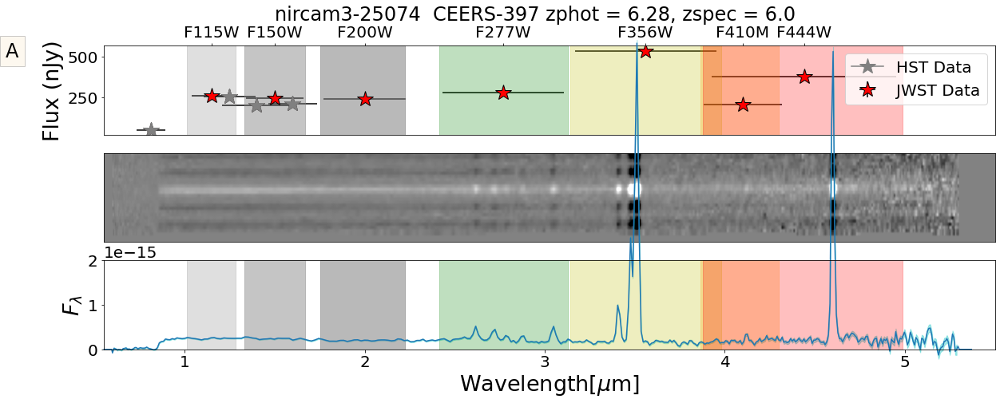




# <u> Contents  (clickable)</u>

## Part 1: The EELG Selection

### [Function Definitions](#funcdef)
* [get_color_table](#get_color_table)
* [load_photometry](#load_photometry)
* [jon_plot](#john_plot)
* [investigate_source](#investigate_source)
* [plot_sources](#plot_sources)
* [preliminary_search](#preliminary_search)
* [cut_sides](#cut_sides)
* [spectra_per_redshift](#spectra_per_redshift)
* [get_ew](#ew)
* [get_ew_red_only](#ew_red)

### [Data Cuts](#ew_calc)

* [Equivalent Width calculation and cut](#ew_calc)

* [Nearby source and detector edge cut](#edge_cut)

* [Minimum number of observations](#min_o)

* [Adding the F277W filter](#f277)


### [Classifying the EELGs](#strings)

* [Visual inspection and category assignment](#strings)

## Part 2: Analysis of the EELGs


### [The EELG Selection](#props)

* [Loading the data](#props)

* [Chi sqr cut to remove red galaxies](#chi2)

* [Tier Assignments](#tiers)

### [Spectroscopy](#nirspec)

* [Mathcing the photometry sources to NIRSpec data](#nirspec)

* [Plotting the SEDs and spectra for the matched sources](#plot_spec)

### [Derived Properties from Photometry](#filter_idents)

* [Identifying emission and continuum from the photometry](#filter_idents)

* [Calculating errors for the photometry measurements](#errors)

* [Getting line measurements from the photometry](#line_vals)

* [Loading eazy measurements (see other notebook for eazy run specifics)](#eazy)

* [Half light radii from GALFITs](#re)


### [Paper Figures](#datplots)

* [Continuum luminosity vs rest frame colors](#datplots)

* [Photometric redshifts (spectroscopy section for comparison to zspec)](#zphot)

* [Rest frame EWs](#restew)

* [Halflight Radii plots](#replot)

* [[OIII]5008/Ha ratio](#ratios)

* [Line luminosities](#line_lums)

* [Morphology plots](#morph)

* [Color-color plots](#color)




# Imports

In [2]:
import astropy.units as u
import astropy.constants as c
from astropy.coordinates import SkyCoord, search_around_sky
from astropy.time import Time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
%matplotlib inline
from astropy.io import fits
from itertools import combinations
import pickle
from astropy.cosmology import WMAP9 as cosmo
import seaborn as sns
from astropy.table import Table

#Matplotlib formating

plt.rcParams['figure.figsize'] = (10, 10)
plt.rc('axes', labelsize=27)
#plt.rc('axes', labelweight='bold')
plt.rc('axes', titlesize=27)
plt.rc('axes', titleweight='bold')
plt.rc('font', family='sans-serif')
plt.rcParams.update({'font.size': 20})

<a class="anchor" id="funcdef"></a>


# Function Definitions

<a class="anchor" id="get_color_table"></a>

In [5]:
def get_color_table(dfi):
    """
    Generates a DataFrame of the colors that can be created with the input DataFrame photometry and assotiated 
    errors
    
    Parameters
    ---
    dfi: pandas DataFrame, 
        generated by load_photometry function
    
    Returns
    ---
    df: pandas DataFrame
        contains all possible color combinations and their respective errors
    
    """
    #Grab the filters from the DataFrame FOR NO HST DATA!! CHANGE INDEX IF FILTERS ARE ADDED
    filters = dfi.keys()[3:16]
    #Initialize an empty DataFrame
    df = pd.DataFrame({})
    #Loop through all possible combinations of 2 filters
    for i in combinations(filters, 2):
        #Check if either of the elements associated with the filter are NaN
        strng0 = float(i[0].split('F')[1])
        strng1 = float(i[1].split('F')[1])
        #Only compute colors that are blue-red
        if strng0<strng1:
            if np.nansum(dfi[f'{i[0]}'])!= 0 and np.nansum(dfi[f'{i[1]}']) !=0:
                #If neither are NaN, add the color to the DataFrame
                f0 = dfi[f'{i[0]}']
                f1 = dfi[f'{i[1]}']
                df[f'{i[0]} - {i[1]}'] = -1*2.5*np.log10((f0)/(f1))
                f0_err = dfi[f'{i[0]}_ERROR']
                f1_err =  dfi[f'{i[1]}_ERROR']
                error = np.sqrt(((((-2.5)/(np.log(10)))*(1/f0))**2)*((f0_err)**2) + ((((2.5)/(np.log(10)))*(1/f1))**2)*((f1_err)**2) )
                df[f'{i[0]} - {i[1]}_ERROR'] = error
            else:
                #If either is NaN, let the color value be NaN
                df[f'{i[0]} - {i[1]}'] = np.nan
                df[f'{i[0]} - {i[1]}_ERROR'] = np.nan
    #Returns the DataFrame
    #df['Object'] = dfi['Object']
    return df, filters

<a class="anchor" id="load_photometry"></a>

In [7]:
def load_photometry(path, photz_path, chi_path, zgrid_path, template_path, ignore_HST = True):
    """
    Initializes a Pandas DataFrame with photometry information
    
    Parameters
    ---
    path: string 
        absolute path to a CEERS_v0.51.2_photom.fits
        
    photz_path: string 
        absolute path to CEERS_v0.51.2_photz_quantities.fits
        
    chi_path: string 
        absolute path to CEERS_v0.51.2_photz_chi2.fits
        
    zgrid_path: string 
        absolute path to CEERS_v0.51.2_photz_zgrid.fits
        
    template_path: string
        absolute path to CEERS_v0.51.2_photz_templates.fits
        
    ignore_HST: bool
        default True, ignores HST photometric filters in photometry files when set to True
        
    Returns
    ---
    df: pandas DataFrame
        DataFrame containing photometric information for each source. Each row indicates one source. The
        column names indicate the following:
        
        RA: Right Ascension of source in decimal degrees 
        
        DEC: Declination of source in decimal degrees 
        
        Region: either a 1 or 2 indicating if the source appears in the region of lesser Right Ascension (2)
                or the region of greater Right Ascension (1)
        
        F115: Source flux in 115 filter, units of nJy 
        
        F150: Source flux in 150 filter, units of nJy
        
        F200: Source flux in 200 filter, units of nJy
        
        F277: Source flux in 277 filter, units of nJy
        
        F356: Source flux in 356 filter, units of nJy
        
        F410: Source flux in 410 filter, units of nJy 
        
        F444: Source flux in 444 filter, units of nJy 
        
        F606 : Source flux in 60.6 filter, units of nJy (Hubble Fitler)
        
        F814 : Source flux in 81.4 filter, units of nJy (Hubble Filter)
        
        F105: Source flux in 105 filter, units of nJy (Hubble Filter)
        
        F125: Source flux in 125 filter, units of nJy (Hubble Filter)
        
        F140: Source flux in 140 filter, units of nJy (Hubble Filter)
        
        F160: Source flux in 160 filter, units of nJy (Hubble Filter)
        
        F115_ERROR: Error in 115 filter flux, units of nJy 
        
        F150_ERROR: Error in 150 filter flux, units of nJy
        
        F200_ERROR: Error in 200 filter flux, units of nJy
        
        F277_ERROR: Error in 277 filter flux, units of nJy 
        
        F356_ERROR: Error in 356 filter flux, units of nJy
        
        F410_ERROR: Error in 410 filter flux, units of nJy 
        
        F444_ERROR: Error in 444 filter flux, units of nJy
        
        F606_ERROR: Error in 60.6 filter flux, units of nJy
        
        F814_ERROR: Error in 81.4 filter flux, units of nJy 
        
        F105_ERROR: Error in 105 filter flux, units of nJy
        
        F125_ERROR: Error in 125 filter flux, units of nJy 
        
        F140_ERROR: Error in 140 filter flux, units of nJy 
        
        F160_ERROR: Error in 160 filter flux, units of nJy 
        
        Pointing: integer photometric pointing 
        
        Object: photometric identifier of form 'nircamX-Y' where 'X' is the photometric pointing and 'Y'
            is the catalog identifier from Finkelstein 2023
            
        Former_Names: catalog identifier from previous photometry catalog
        
        X: x spatial coordinate in filter
        
        Y: y spatial coordinate in filter
        
        PHOTOM_RED_SHIFT: Best photometric redshift 
        
        Min_Chi2: The chi squared value associated with the best fit redshift 
        
        Lowest_Chi2: The 10 lowest chi squared values for the 10 best photometric redshift fits
        
        Lowest_Chi2_Z: The 10 best fit photometric redshift values
        
        A: semimajor axis 
        
        B: semiminor axis 
        
        ze_lower: lower bound of best fit photometric redshift error 
        
        ze_upper: upper bound of best fit photometric redshift error
        
    
    """
    undet = []
    #Opening the file
    hdu1 = fits.open(path)
    #Defining HST filter names
    HST_filters = ['F140', 'F140_ERROR', 'F814', 'F606', 'F105', 'F125', 'F160', 'F814_ERROR', 'F606_ERROR', 
              'F105_ERROR', 'F125_ERROR', 'F160_ERROR']
    #Defining empty lists to store data
    filters= []
    #Looping through each of the keywords in the .fits file
    for key in hdu1[1].columns:
        #If the keyword starts with an F and has type D,
        if key.name[0] == 'F' and key.format == 'D':
            #Check that the filter contains data and not just NaN values
            #This is the first instance of byte swapping in this code. This is necessary when
            #switching from a FITS input to a pandas DataFrame due to byte order support with Pandas.
            #If this byte swapping is absent, an error for big endian buffers on a little endian 
            #compiler will raise.
            if np.nansum(hdu1[1].data[f'{key.name}'].byteswap().newbyteorder()) !=0:
                #Add the filter to the filter list
                filters.append(key.name)
                    
    
    #Loop through the x positions of the data points
    
    #Initalize a pandas Data Frame with the RA and DEC positional coordinates
    df = pd.DataFrame({'RA': hdu1[1].data['RA'].byteswap().newbyteorder(), 
                       'DEC': hdu1[1].data['DEC'].byteswap().newbyteorder()})
    #Add the region flags to the DataFrame
    flags = []
    for x in hdu1[1].data['X'].byteswap().newbyteorder():
        #Check if the position is in the right of the frame
        if x > 5000:
            #Flag this as region 2
            flags.append(2)
        #Flag other points as region 1
        else:
            flags.append(1)
    df['Region'] = flags
    
    filters = filters[0::2]
    
    #Add each filter to the DataFrame, check if user wants to ignore the HST filter
    for f in filters:
        fstrng = 'F'+f.split('_')[1]
        if ignore_HST == False:
            df[fstrng] = hdu1[1].data[f].byteswap().newbyteorder()
        else:
            if fstrng not in HST_filters:
                df[fstrng] = hdu1[1].data[f].byteswap().newbyteorder()
                
    for f in filters:
        strng = 'F' + f.split('_')[1] + '_ERROR'
        if ignore_HST == False:
            df[strng] = hdu1[1].data['FLUXERR_' + f.split('_')[1]].byteswap().newbyteorder()
        else:
            if strng not in HST_filters:
                df[strng] = hdu1[1].data['FLUXERR_' + f.split('_')[1]].byteswap().newbyteorder()
    #Match the sources to the rainbows data, use the index array idk to order the rainbows 
    #data so that it can be added to the DataFrame in the correct order
    pointing = hdu1[1].data['FIELD'].byteswap().newbyteorder()
    ids = hdu1[1].data['ID'].byteswap().newbyteorder()
    formers = hdu1[1].data['ID_V0P2'].byteswap().newbyteorder()
    onames = []
    for i in range(len(ids)):
        p = pointing[i]
        ob = ids[i]
        onames.append('nircam'+str(p)+'-'+str(ob))
    df['Pointing'] = pointing
    
    df['Object'] = onames
    df['Former_Names'] = formers
    #Adding the pixel coordinates
    df['X'] = hdu1[1].data['X'].byteswap().newbyteorder()
    df['Y'] = hdu1[1].data['Y'].byteswap().newbyteorder()
    
    
    hdu2 = fits.open(photz_path)
    hdu3 = fits.open(chi_path)
    hdu4 = fits.open(zgrid_path)
    
    mnchis = []
    photozs = []
    low10chis = []
    low10photozs = []
    
    z_lower = []
    z_upper = []

    zgrid = hdu4[0].data
    length = len(hdu2[1].data['ZA'])
    
    for j in range(length):
        photo_z = hdu2[1].data['ZA'][j]
        photozs.append(photo_z)
        
        z_lower.append(hdu2[1].data['ZL68'][j])
        z_upper.append(hdu2[1].data['ZU68'][j])
        
        chi2 = hdu3[0].data[j]
        mn = np.min(chi2)
        mnchis.append(mn)
        
        low10 = list(sorted(chi2)[0:10])
        low10_rs = []

        for chival in low10:
            x = np.where(chi2 == chival)[0][0]
            rs = zgrid[x]
            low10_rs.append(rs)
        low10chis.append(low10)
        low10photozs.append(low10_rs)
        
    df['PHOTOM_RED_SHIFT'] = photozs
    df['Min_Chi2'] = mnchis
    df['Lowest_Chi2'] = low10chis
    df['Lowest_Chi2_Z'] = low10photozs
    df['A'] = hdu1[1].data['A_IMAGE'].byteswap().newbyteorder()
    df['B'] = hdu1[1].data['B_IMAGE'].byteswap().newbyteorder()
    df['ze_lower'] = z_lower
    df['ze_upper'] = z_upper
    return df#, hdu1[1]


<a class="anchor" id="john_plot"></a>

In [13]:
def jon_plot(rs = None):
    """
    Plots expected prominant emission lines as they varry through redshifts and indicates where a specified
    redshift will land on this plot.
    
    Parameters
    ---
    
    rs: optional, float between 0 and 10
        value of object's redshift
    
    
    Returns
    ---
    
    figure: plot of emission lines with redshift indicated
    
    """
    #f = plt.figure()
    
    
    #plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = True
    #plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = False
    
    font = 25
    #Defining emission line constants
    ha = 6563
    nii = 6584
    o3 = 5007
    o3_2 = 4959
    hb = 4861
    hd = 4101
    ne3 = 3870
    o2 = 3727
    ciii = 1909
    civ = 1550
    lya = 1216
    paa = 18750
    pab = 12820
    #Specifying figure size
    plt.rcParams['figure.figsize'] = (20, 10)
    # Grabbing filters for source from the DataFrame

    
    
    
    # Plotting spans for each of the filters
    plt.axvspan(388, 498.6, label= 'F444W', color = 'r', alpha = .35)
    plt.axvspan(386.4, 430.1, label= 'F410M', alpha = 0.35, color = 'orange')
    plt.axvspan(314, 398, label= 'F356W', color = 'y', alpha = .35)
    plt.axvspan(241.6, 312.7, label= 'F277W', color = 'g', alpha = .35)
    
    plt.axvspan(175.5, 222.6, label= 'F200W', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
    plt.axvspan(133.1, 166.8, label= 'F150W', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
    plt.axvspan(101.3, 128.2, label= 'F115W', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)
    
    
    #Making a range for the emission line calculations
    zarr = np.arange(0,100)
    #Ploting H alpha and NII lines
    plt.plot(1e-4*ha*(1+zarr)*1e2,zarr, c= 'red')
    plt.plot(1e-4*nii*(1+zarr)*1e2,zarr, c= 'r')
    #Plotting H betta and OIII lines
    plt.plot(1e-4*o3*(1+zarr)*1e2,zarr, color='darkgreen')
    plt.plot(1e-4*o3_2*(1+zarr)*1e2,zarr, color='darkgreen')
    plt.plot(1e-4*hb*(1+zarr)*1e2,zarr, color='darkgreen')
    
    
    
    #Plotting OII and NEIII lines
    plt.plot(1e-4*o2*(1+zarr)*1e2,zarr, color='blue')
    plt.plot(1e-4*ne3*(1+zarr)*1e2,zarr, color='blue')
    
    
    #Plotting Pa lines
    plt.plot(1e-4*paa*(1+zarr)*1e2,zarr, color='brown')
    #Plotting Pb lines
    plt.plot(1e-4*pab*(1+zarr)*1e2,zarr, color='brown')
    #Plotting Lya lines
   # plt.plot(1e-4*lya*(1+zarr)*1e2,zarr, color='red', label = r'Ly$\alpha$')
    #Plotting CIV lines
   # plt.plot(1e-4*civ*(1+zarr)*1e2,zarr, color='red', label = r'CIV')
    #Plottinh CIII lines
    #plt.plot(1e-4*ciii*(1+zarr)*1e2,zarr, color='red', label = r'CIII')
    
    #Adding text to all emission lines
    plt.text(400, 5.25, r'H$\alpha$ + [NII]', rotation = 20, c = 'r', zorder = 1, fontsize = font)
    plt.text(450, 8.5, r'H$\beta$+[OIII]', rotation = 25, c = 'darkgreen',zorder = 1, fontsize = font)
    plt.text(277, 7, '[OII]+[NeIII]', rotation = 25, c = 'b', zorder = 1, fontsize = font)
    
    plt.text(420, 2.5, r'Pa$\beta$', rotation = 15, c = 'brown',zorder = 1, fontsize = font)
    plt.text(420, 1.5, r'Pa$\alpha$', rotation = 15, c = 'brown', zorder = 1, fontsize = font)
    #plt.text(115, 9.25, r'Ly$\alpha$', rotation = 55, c = 'red', zorder = 1, fontsize = font)
    #plt.text(115, 7.1, r'CIV', rotation = 45, c = 'red', zorder = 1, fontsize = font)
    #plt.text(105, 4.85, r'CIII', rotation = 45, c = 'red', zorder = 1, fontsize = font)
    
    #If a source is not specified, simply plot the emission lines. If it is specified add it to the plot
    if rs is None:
        p = 1
       # plt.title('Lines of Interest')
    else:
        #Adding the redhsift line to the plot 
        plt.axhline(rs, color = 'k', lw = 10)
        plt.text(120, rs+.25, f'Redshift = {rs}', rotation = 0, fontweight = 'bold', zorder = 10,
                fontsize = 20)
       # plt.title(f'Lines of Interest')
    plt.ylabel('Redshift')
    plt.xlabel('Wavelength [$\mu$m]')
    plt.axvline(4.5, 5.5)
   # ax = f.add_subplot(111)
   # ax.yaxis.tick_right()
    
    #Rotate the ticks, set fixed axes limits
    
    
    #plt.gca().add_patch(Rectangle((386.4,4.8),430-386,3.2,
    #                edgecolor='purple',
    #                facecolor='none',
    #                lw=4))
    ticks = [115.4, 150.1, 199.0, 278.6, 356.3, 409.2, 442.1]
    labels = [1.154, 1.501, 1.990, 2.786, 3.563, 4.092, 4.421]
    plt.xticks(ticks, labels, rotation = 45)
    plt.tick_params('y', length=10, width=1, which='minor')
    plt.ylim(1,10)
    plt.xlim(90,500);
    plt.rcParams['ytick.right'] = plt.rcParams['ytick.labelright'] = False
    plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True
    plt.legend()

<a class="anchor" id="cut_sides"></a>

In [15]:
def cut_sides(df, best_df, num, dynamic = False):
    """
    Takes a DataFrame of sources and compares it to a larger DataFrame. Sources either near the edge of the 
    detected sources or within an arcsecond of a bright source are thrown out
    
    Parameters
    ---
    df: pandas DataFrame
        DataFrame from load_photometry function
        
    best_df: pandas DataFrame
        a cut version of df, only including the sources of interest
    
    num: integer,
        integer pointing number
    
    Reutrns
    ---
    figure: matplotlib figure
        plot of all data in the pointing, indicating which 
            
    cut_data: pandas DataFrame
        the input DataFrame, only including sources that passed cuts
    
    """
    #Identify two seperate regions
    plt.rcParams['figure.figsize'] = (10, 10)
    plt.figure()
    db1 = best_df
    left = df[df['Region']==1]
    right = df[df['Region']==2]
    #Find the edges of the regions, draw a cutoff around the 100 pixel coordinates around the edge
    mn_x = np.min(df['X'])+100
    lmax_x = np.max(left['X'])-100
    rmin_x = np.min(right['X'])+100
    mx_x = np.max(df['X'])-100
    mn_y = np.min(df['Y'])+100
    lmax_y = np.max(left['Y'])-100
    rmin_y = np.min(right['Y'])+100
    mx_y = np.max(df['Y'])-100
    #Create lists to store the relavent sources
    post_cut = []
    too_close = []
    #For each of the sources in the smaller DataFrame
    for i in db1.index:
        #Get the DataFrame only includin that source
        dfsource = db1.loc[i]
        #Check if it is in the leftmost region, if it lies inside the cut region, keep the source
        if dfsource['Region'] == 1:
            if dfsource['X']>mn_x:
                if dfsource['X']<lmax_x:
                    if dfsource['Y']>mn_y:
                        if dfsource['Y']<lmax_y:
                            post_cut.append(i)
        #If the source is in the rightmost region, check if it passes the cuts for that region
        if dfsource['Region'] == 2:  
            if dfsource['X']>rmin_x:
                if dfsource['X']<mx_x:
                    if dfsource['Y']>rmin_y:
                        if dfsource['Y']<mx_y:
                            post_cut.append(i)
    #Plot all the sources that were observed in the region
    plt.scatter(df['RA'], df['DEC'], label = 'Data')
    #Add a gold star for sources that were eliminated due to proximity to edge
    plt.scatter(db1['RA'], db1['DEC'], c = 'gold', marker = '*', s = 200, zorder = 1, 
                label = 'Tossed - close to edge')
    #Look only at the sources that passed the edge proximity check
    for ind in db1.loc[post_cut].index:
        dfsource = db1.loc[ind]
        ra = df.loc[ind]['RA']
        dec = df.loc[ind]['DEC']
        #Create a data frame that includes all sources but the one currntly being looped over
        l = df.drop(ind)
        ra2 = l['RA']
        dec2= l['DEC']
        #Look at all sources within one arcsecond of the source being looped over
        leftovers =l[SkyCoord(ra2*u.deg, dec2*u.deg).separation(SkyCoord(ra*u.deg,dec*u.deg))<1*u.arcsec]
        #If any sources are found to be within one arcsecond
        if len(leftovers)>0:
            #Grab the filters

            a=ind
            fs = []
            fs_strings = []
            for key in df.loc[a][3:11].keys():
                fs.append(float(key.split('F')[1]))
                fs_strings.append(key)
            start=3
            stop=11
            stop2 = 19
            f_final = []
            for f in fs:
                f_final.append(f)

            #Check if the nearby source is brigther than the source of interest by 100nJy in any
            #of the observed filters. If it is, flag the source.
            flags = []
            dfsource = df.loc[ind]
            for fltr in fs_strings:
                for i in leftovers.index:
                    if (leftovers.loc[i][fltr]-dfsource[fltr]) >100:
                        too_close.append(ind)
                        flags.append(i)
    #Plot a black star over any source thrown out because of a nearby source
    close = set(too_close)
    plt.scatter(db1.loc[post_cut].loc[close]['RA'], db1.loc[post_cut].loc[close]['DEC'], marker = '*', color = 'k', s =200,
               label = 'Tossed-Nearby source', zorder = 500)
    #Cut the data 
    throw = db1.loc[post_cut].loc[close]
    good = []
    for ind in db1.loc[post_cut].index:
        if ind not in throw:
            good.append(ind)
    cut_data = db1.loc[good]
    #plot a red star over sources kept after cutting
    plt.scatter(db1.loc[post_cut]['RA'], db1.loc[post_cut]['DEC'], marker = '*', color = 'r', s =200,
               label = 'Kept')
    #Add labels and title
    plt.legend()
    plt.gca().invert_xaxis()
    plt.title(f'Pointing {num} - Data Cuts')
    plt.xlabel('RA(Deg)')
    plt.ylabel('DEC(Deg)');
    return cut_data

<a class="anchor" id="ew"></a>

In [30]:
def get_ew(df, sources):
    """
    string
    """
    def reject_outliers(data, max_std):
        """
        other string to fill out
        """
        return data[abs(data - np.mean(data)) < max_std * np.std(data)]
    filter_widths = {115.0: 0.225 * 1e-6*u.m, 
                150.0: 0.318* 1e-6*u.m,
                105.0: np.nan,
                200: 0.457* 1e-6*u.m,
                277: 0.683* 1e-6*u.m,
                356: 0.781* 1e-6*u.m,
                410: 0.438* 1e-6*u.m,
                444: 1.029* 1e-6*u.m,
                60.6: np.nan,
                81.4: np.nan,
                125: np.nan,
                140: 0.412* 1e-6*u.m,
                160: np.nan}
    # plt.rcParams['figure.figsize'] = (10, 10)
    #sources = cut1['Object']
    hits= []
    rsh = []
    ra = []
    dec = []
    kpcs = []
    filter_arrays = []
    filter_arrays_vals = []
    filter_arrays_err = []
    k = df.index[0]
    a = df.index[0]
    fs = []
    fs_strings = []
    for key in df.loc[a][3:11].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=11
    stop2 = 19
    f_final = []
    for f in fs:
        f_final.append(f)
    
    ews_tot =[]

    ews_tot =[]
    if len(sources) == 1:
        obj = sources
    else:
        for obj in sources:
           # plt.figure()
           # n+=1
            mk = np.array(df['Object']) == np.array(obj)
            a = df[mk]
            rs = a['PHOTOM_RED_SHIFT'].values
            kpc = cosmo.kpc_proper_per_arcmin(np.array(rs))
            #mask = (a[filters].values[0] > (3*a[filter_er].values[0]))&(a[filters].values[0] >0)
            #if c ==0:
            f =  np.array(a.keys()[start:stop].values)
            filter_er = np.array(a.keys()[stop:stop2].values)
            #else:
              #  filters = np.array(a.keys()[4:17].values)
               # filter_er = np.array(a.keys()[18:30].values)
            mask = (a[f].values[0] > (3*a[filter_er].values[0]))#&(a[filters].values[0] >0)
           # filters = np.array(f_final)[mask]
            #if len(filters)>5:
            filter_arrays_vals.append(a[f].values[0][mask])
            filter_arrays.append(np.array(f_final)[mask])
            rsh.append(rs)
           # a
            filter_arrays_err.append(a[filter_er].values[0][mask])
            max_std = 1
            smooth = reject_outliers(a[f].values[0][mask], 1)
            #cv = np.mean(smooth)
            ews = []
            for inn in range(len(a[f].values[0][mask])):
                #z = a['PHOTOM_RED_SHIFT'].values
                ftr = np.array(f_final)[mask][inn]
                fval = a[f].values[0][mask][inn]
                ewrf = (filter_widths[ftr]*(((fval*1e-9*u.Jy)) - (np.mean(smooth)*1e-9*u.Jy))/(np.mean(smooth)*1e-9*u.Jy))
                if ewrf>0:

                    ew = ewrf#/(1+z)
                    ews.append(ew.to(u.AA).value)
                   # print(ewrf>0)
                else:
                    #print(ew)
                    ews.append(np.nan)
            try:
                ews_tot.append(np.nanmax(ews))
            except:
                ews_tot.append(np.nan)


    return ews_tot

In [31]:
def get_ew_277(df, sources):
    """
    string
    """
    def reject_outliers(data, max_std):
        """
        other string
        """
        return data[abs(data - np.mean(data)) < max_std * np.std(data)]
    red = [277.0]
    filter_widths = {115.0: 0.225 * 1e-6*u.m, 
                150.0: 0.318* 1e-6*u.m,
                105.0: np.nan,
                200: 0.457* 1e-6*u.m,
                277: 0.683* 1e-6*u.m,
                356: 0.781* 1e-6*u.m,
                410: 0.438* 1e-6*u.m,
                444: 1.029* 1e-6*u.m,
                60.6: np.nan,
                81.4: np.nan,
                125: np.nan,
                140: 0.412* 1e-6*u.m,
                160: np.nan}
    # plt.rcParams['figure.figsize'] = (10, 10)
    #sources = cut1['Object']
    hits= []
    rsh = []
    ra = []
    dec = []
    kpcs = []
    filter_arrays = []
    filter_arrays_vals = []
    filter_arrays_err = []
    k = df.index[0]
    
    fs = []
    fs_strings = []
    
    for key in df.loc[k][3:10].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=10
    stop2 = 17
    f_final = []
    for f in fs:
        f_final.append(f)
        
    ews_tot =[]
    if len(sources) == 1:
        obj = sources
    else:
        for obj in sources:
           # plt.figure()
           # n+=1
            mk = np.array(df['Object']) == np.array(obj)
            a = df[mk]
            rs = a['PHOTOM_RED_SHIFT'].values
           # kpc = cosmo.kpc_proper_per_arcmin(np.array(rs))
            #mask = (a[filters].values[0] > (3*a[filter_er].values[0]))&(a[filters].values[0] >0)
            #if c ==0:
            f =  np.array(a.keys()[start:stop].values)
            filter_er = np.array(a.keys()[stop:stop2].values)
            #else:
              #  filters = np.array(a.keys()[4:17].values)
               # filter_er = np.array(a.keys()[18:30].values)
            mask = (a[f].values[0] > (3*a[filter_er].values[0]))#&(a[filters].values[0] >0)
           # filters = np.array(f_final)[mask]
            #if len(filters)>5:
            filter_arrays_vals.append(a[f].values[0][mask])
            filter_arrays.append(np.array(f_final)[mask])
            rsh.append(rs)
           # a
            filter_arrays_err.append(a[filter_er].values[0][mask])
            max_std = 1
            smooth = reject_outliers(a[f].values[0][mask], 1)
            #cv = np.mean(smooth)
            ews = []
            for inn in range(len(a[f].values[0][mask])):
                z = a['PHOTOM_RED_SHIFT'].values
                ftr = np.array(f_final)[mask][inn]
                fval = a[f].values[0][mask][inn]
                ewrf = (filter_widths[ftr]*(((fval*1e-9*u.Jy)) - (np.mean(smooth)*1e-9*u.Jy))/(np.mean(smooth)*1e-9*u.Jy))
                if ftr in red:
                    if ewrf>0:

                        ew = ewrf#/(1+z)
                        ews.append(ew.to(u.AA).value)
                       # print(ewrf>0)
                    else:
                        #print(ew)
                        ews.append(np.nan)
            try:
                ews_tot.append(np.nanmax(ews))
            except:
                ews_tot.append(np.nan)
    ew_lists_big, cont, spike_vals, spike_widths == 0
    return ews_tot, ew_lists_big, cont, spike_vals, spike_widths

In [17]:
def get_ew_red_only_and_277(df, sources):
    """
    string
    """
    def reject_outliers(data, max_std):
        """
        other string
        """
        return data[abs(data - np.mean(data)) < max_std * np.std(data)]
    #Defining the filters that we consider red
    red = [277.0, 356.0, 410.0, 444.0]
    #Defining the widths of these filters
    filter_widths = {115.0: 0.225 * 1e-6*u.m, 
                150.0: 0.318* 1e-6*u.m,
                105.0: np.nan,
                200: 0.457* 1e-6*u.m,
                277: 0.683* 1e-6*u.m,
                356: 0.781* 1e-6*u.m,
                410: 0.438* 1e-6*u.m,
                444: 1.029* 1e-6*u.m,
                60.6: np.nan,
                81.4: np.nan,
                125: np.nan,
                140: 0.412* 1e-6*u.m,
                160: np.nan}
    #Defining lists to store data
    hits = []
    rsh = []
    ra = []
    dec = []
    kpcs = []
    ew_lists_big = []
    filter_arrays = []
    filter_arrays_vals = []
    filter_arrays_err = []
    k = df.index[0]
    #Defining filters
    fs = []
    fs_strings = []
    for key in df.loc[k][3:10].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=10
    stop2 = 17
    f_final = []
    for f in fs:
        f_final.append(f)
    #Defining lsits for equivalent widths
    ews_tot =[]
    cont = []
    spike_vals = [] 
    spike_widths = []
    #Check if we have been fed just one object. If so, we just want to iterate over this.
    if len(sources) == 1:
        obj = sources
    else:
        #looping over each of the sources
        for obj in sources:
            #Isolate the dataframe of just this object
            mk = np.array(df['Object']) == np.array(obj)
            a = df[mk]
            #Get the redshift
            rs = a['PHOTOM_RED_SHIFT'].values
            #kpc = cosmo.kpc_proper_per_arcmin(np.array(rs))
            #Get the filters and their respective errors for this source
            f =  np.array(a.keys()[start:stop].values)
            filter_er = np.array(a.keys()[stop:stop2].values)
            #Apply a limit that all real data points will be at least three times their error
            mask = (a[f].values[0] > (3*a[filter_er].values[0]))#&(a[filters].values[0] >0)
            #Add the filter values and redshifts to respective arrays
            filter_arrays_vals.append(a[f].values[0][mask])
            filter_arrays.append(np.array(f_final)[mask])
            rsh.append(rs)
            #Add the error to the correct array
            filter_arrays_err.append(a[filter_er].values[0][mask])
            #Set the maximum allowed standard deviation before a spike is not considered to be part of the continuum
            max_std = 1
            #smooth is the isolated continuum
            smooth = reject_outliers(a[f].values[0][mask], 1)
            #Make a list to hold the equivalent widths for just this object
            ews = []
            filter_vals = []
            fwidth = []
            #Iterate over each filter
            for inn in range(len(a[f].values[0][mask])):
                #z = a['PHOTOM_RED_SHIFT'].values
                ftr = np.array(f_final)[mask][inn]
                fval = a[f].values[0][mask][inn]
                ewrf = (filter_widths[ftr]*(((fval*1e-9*u.Jy)) - (np.mean(smooth)*1e-9*u.Jy))/(np.mean(smooth)*1e-9*u.Jy))
                if ftr in red:
                    if ewrf>0:

                        ew = ewrf#/(1+z)
                        ews.append(ew.to(u.AA).value)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
                       # print(ewrf>0)
                    else:
                        #print(ew)
                        ews.append(np.nan)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
            try:
                ews_tot.append(np.nanmax(ews))
            except:
                ews_tot.append(np.nan)
            cont.append(smooth)
            spike_vals.append(filter_vals)
            spike_widths.append(fwidth)
    ew_lists_big, cont, spike_vals, spike_widths == 0
    return ews_tot, ew_lists_big, cont, spike_vals, spike_widths

<a class="anchor" id="ew_red"></a>

In [19]:
def get_ew_red_only(df, sources):
    """
    string
    """
    def reject_outliers(data, max_std):
        """
        other string
        """
        return data[abs(data - np.mean(data)) < max_std * np.std(data)]
    #Defining the filters that we consider red
    red = [356.0, 410.0, 444.0]
    #Defining the widths of these filters
    filter_widths = {115.0: 0.225 * 1e-6*u.m, 
                150.0: 0.318* 1e-6*u.m,
                105.0: np.nan,
                200: 0.457* 1e-6*u.m,
                277: 0.683* 1e-6*u.m,
                356: 0.781* 1e-6*u.m,
                410: 0.438* 1e-6*u.m,
                444: 1.029* 1e-6*u.m,
                60.6: np.nan,
                81.4: np.nan,
                125: np.nan,
                140: 0.412* 1e-6*u.m,
                160: np.nan}
    #Defining lists to store data
    hits= []
    rsh = []
    ra = []
    dec = []
    kpcs = []
    ew_lists_big = []
    filter_arrays = []
    filter_arrays_vals = []
    filter_arrays_err = []
    k = df.index[0]
    #Defining filters
    fs = []
    fs_strings = []
    for key in df.loc[k][3:10].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=10
    stop2 = 17
    f_final = []
    for f in fs:
        f_final.append(f)
    #Defining lsits for equivalent widths
    ews_tot =[]
    cont = []
    spike_vals = [] 
    spike_widths = []
    #Check if we have been fed just one object. If so, we just want to iterate over this.
    if len(sources) == 1:
        obj = sources
    else:
        #looping over each of the sources
        for obj in sources:
            #Isolate the dataframe of just this object
            mk = np.array(df['Object']) == np.array(obj)
            a = df[mk]
            #Get the redshift
            rs = a['PHOTOM_RED_SHIFT'].values
            #kpc = cosmo.kpc_proper_per_arcmin(np.array(rs))
            #Get the filters and their respective errors for this source
            f =  np.array(a.keys()[start:stop].values)
            filter_er = np.array(a.keys()[stop:stop2].values)
            #Apply a limit that all real data points will be at least three times their error
            mask = (a[f].values[0] > (3*a[filter_er].values[0]))#&(a[filters].values[0] >0)
            #Add the filter values and redshifts to respective arrays
            filter_arrays_vals.append(a[f].values[0][mask])
            filter_arrays.append(np.array(f_final)[mask])
            rsh.append(rs)
            #Add the error to the correct array
            filter_arrays_err.append(a[filter_er].values[0][mask])
            #Set the maximum allowed standard deviation before a spike is not considered to be part of the continuum
            max_std = 1
            #smooth is the isolated continuum
            smooth = reject_outliers(a[f].values[0][mask], 1)
            #Make a list to hold the equivalent widths for just this object
            ews = []
            filter_vals = []
            fwidth = []
            #Iterate over each filter
            for inn in range(len(a[f].values[0][mask])):
                #z = a['PHOTOM_RED_SHIFT'].values
                ftr = np.array(f_final)[mask][inn]
                fval = a[f].values[0][mask][inn]
                ewrf = (filter_widths[ftr]*(((fval*1e-9*u.Jy)) - (np.mean(smooth)*1e-9*u.Jy))/(np.mean(smooth)*1e-9*u.Jy))
                if ftr in red:
                    if ewrf>0:

                        ew = ewrf#/(1+z)
                        ews.append(ew.to(u.AA).value)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
                       # print(ewrf>0)
                    else:
                        #print(ew)
                        ews.append(np.nan)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
            try:
                ews_tot.append(np.nanmax(ews))
            except:
                ews_tot.append(np.nan)
            cont.append(smooth)
            spike_vals.append(filter_vals)
            spike_widths.append(fwidth)
   # ew_lists_big, cont, spike_vals, spike_widths == 0
    return ews_tot, ew_lists_big, cont, spike_vals, spike_widths

In [20]:
def get_ew_red_only(df, sources):
    """
    string
    """
    def reject_outliers(data, max_std):
        """
        other string
        """
        return data[abs(data - np.mean(data)) < max_std * np.std(data)]
    #Defining the filters that we consider red
    red = [356.0, 410.0, 444.0]
    #Defining the widths of these filters
    filter_widths = {115.0: 0.225 * 1e-6*u.m, 
                150.0: 0.318* 1e-6*u.m,
                105.0: np.nan,
                200: 0.457* 1e-6*u.m,
                277: 0.683* 1e-6*u.m,
                356: 0.781* 1e-6*u.m,
                410: 0.438* 1e-6*u.m,
                444: 1.029* 1e-6*u.m,
                60.6: np.nan,
                81.4: np.nan,
                125: np.nan,
                140: 0.412* 1e-6*u.m,
                160: np.nan}
    #Defining lists to store data
    hits= []
    rsh = []
    ra = []
    dec = []
    kpcs = []
    ew_lists_big = []
    filter_arrays = []
    filter_arrays_vals = []
    filter_arrays_err = []
    k = df.index[0]
    #Defining filters
    fs = []
    fs_strings = []
    for key in df.loc[k][3:10].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=10
    stop2 = 17
    f_final = []
    for f in fs:
        f_final.append(f)
    #Defining lsits for equivalent widths
    ews_tot =[]
    cont = []
    spike_vals = [] 
    spike_widths = []
    #Check if we have been fed just one object. If so, we just want to iterate over this.
    if len(sources) == 1:
        obj = sources
    else:
        #looping over each of the sources
        for obj in sources:
            #Isolate the dataframe of just this object
            mk = np.array(df['Object']) == np.array(obj)
            a = df[mk]
            #Get the redshift
            rs = a['PHOTOM_RED_SHIFT'].values
            #kpc = cosmo.kpc_proper_per_arcmin(np.array(rs))
            #Get the filters and their respective errors for this source
            f =  np.array(a.keys()[start:stop].values)
            filter_er = np.array(a.keys()[stop:stop2].values)
            #Apply a limit that all real data points will be at least three times their error
            mask = (a[f].values[0] > (3*a[filter_er].values[0]))#&(a[filters].values[0] >0)
            #Add the filter values and redshifts to respective arrays
            filter_arrays_vals.append(a[f].values[0][mask])
            filter_arrays.append(np.array(f_final)[mask])
            rsh.append(rs)
            #Add the error to the correct array
            filter_arrays_err.append(a[filter_er].values[0][mask])
            #Set the maximum allowed standard deviation before a spike is not considered to be part of the continuum
            max_std = 1
            #smooth is the isolated continuum
            smooth = reject_outliers(a[f].values[0][mask], 1)
            #Make a list to hold the equivalent widths for just this object
            ews = []
            filter_vals = []
            fwidth = []
            #Iterate over each filter
            for inn in range(len(a[f].values[0][mask])):
                #z = a['PHOTOM_RED_SHIFT'].values
                ftr = np.array(f_final)[mask][inn]
                fval = a[f].values[0][mask][inn]
                ewrf = (filter_widths[ftr]*(((fval*1e-9*u.Jy)) - (np.mean(smooth)*1e-9*u.Jy))/(np.mean(smooth)*1e-9*u.Jy))
                if ftr in red:
                    if ewrf>0:

                        ew = ewrf#/(1+z)
                        ews.append(ew.to(u.AA).value)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
                       # print(ewrf>0)
                    else:
                        #print(ew)
                        ews.append(np.nan)
                        filter_vals.append(ftr)
                        fwidth.append(filter_widths[ftr])
            try:
                ews_tot.append(np.nanmax(ews))
            except:
                ews_tot.append(np.nan)
            cont.append(smooth)
            spike_vals.append(filter_vals)
            spike_widths.append(fwidth)
   # ew_lists_big, cont, spike_vals, spike_widths == 0
    return ews_tot, ew_lists_big, cont, spike_vals, spike_widths

In [168]:
def plot_class(classif, dfc, log = False, lt = 0, rt = 0):
    """
    Plots all SEDs of objects with a particular filter emission classification
    
    Parameters
    ---
    classif: string
        classification string of form 'sFILTER-DUST', for exapmple 's410-nd' to indicate a
        source with a spike in F410M with no significant dust reddening
        
    dfc: pandas DataFrame
        DataFrame from the load_photometry function to sample SED data from
        
    log: bool, optional
        when set to True, plots the SEDs on log scales
        
    lt: optional, starts plotting at this index in the DataFrame
    
    rt: optional, stops plotting at this index in the DataFrame
    
    Returns
    ---
    
    matplitlib figures with SEDs of associated sources
    
    """
    #Add text boxes here
    #xpos = -40
    #ypos = 1000
    #let = 'C'
    
    
    plt. style. use('default')
    plt.rcParams['figure.figsize'] = (10, 10)
    plt.rc('axes', labelsize=27)
    #plt.rc('axes', labelweight='bold')
    plt.rc('axes', titlesize=30)
    plt.rc('axes', titleweight='normal')
    plt.rc('font', family='sans-serif')
    plt.rcParams.update({'font.size': 20})

    
    plt.rcParams['figure.figsize'] = (10, 5)
    
   # plt.figure()
    
    shape_key = 'Shape'
    #THIS ONE
  #  hist = plt.hist(dfc[dfc[shape_key] == classif]['PHOTOM_RED_SHIFT'], bins = 30)
  #  z = dfc[dfc['Shape'] == classif]['PHOTOM_RED_SHIFT']
  #  mrs = hist[1][np.argmax(hist[0])]
  #  plt.xlabel('Photometric Redshift')
   # plt.axvline(mrs, c = 'k', label = f'Highest Occurance Redshift {round(mrs,2)}')
   # plt.legend()
   # plt.title(f'Sources of Shape {classif}, Finkelstein');
  #  plt.figure();
    
   # hist = plt.hist(dfc[dfc[shape_key] == classif]['ZPhot'], bins = 30)
   # z = dfc[dfc['Shape'] == classif]['ZPhot']
   # mrs = hist[1][np.argmax(hist[0])]
   # plt.axvline(mrs, c = 'k', label = f'Highest Occurance Redshift {round(mrs,2)}')
   # plt.legend()
   # plt.title(f'Sources of Shape {classif}, Updated');
   # plt.figure();
    
    

    plt.rcParams['figure.figsize'] = (10, 5)
    #plot_sources(remaining['Object'], remaining, df_col6, 6)
    df = dfc
    sources = dfc[dfc[shape_key] == classif]['Object']
    #plt.rcParams['figure.figsize'] = (20, 10)
    #Grab filters from DataFrame
    HST_filters = [140.0, 81.4, 60.6, 105.0, 125.0,  160.0]

    ra = []
    dec = []
    zs = []
    ps = []
    #redshifts = []
    fs = []
    fs_strings = []
    a=dfc.index[0]
    for key in df.loc[a][3:11].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=16
    stop2 = 29
    f_final = []
    for f in fs:
        if f>600:
            f_final.append(f*.1)
        else:
            f_final.append(f)

    #Create a colormap 
    colormap = plt.cm.gist_ncar
    colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
    #Create an SED for each of the sources
    i=0
    n=0
    rss = []
    for obj in sources:
        
        props = dict(boxstyle = 'square', facecolor = 'wheat', alpha = 0.2)
       ##### plt.text(xpos, ypos, let, size = 'large', bbox = props)
        
        #Increase the iteration tracker, grab the DataFrame for just this object
        n+=1
        #print(shapes[i])
        mk = np.array(df['Object']) == np.array(obj)
        a = df[mk]
        #Get the redshift and filters
        rs = a['PHOTOM_RED_SHIFT'].values[0]
        ra.append(a['RA'].values[0])
        dec.append(a['DEC'].values[0])
        rss.append(rs)
        zs.append(rs)
        filters = np.array(a.keys()[start:stop].values)
        filter_er = np.array(a.keys()[stop:stop2].values)
        #Mask the data so all filter values are greater than 3 times their error
        mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
        #Sort the data so the SED plot connects from left to right, regardless of filter input order
        z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
        x=[i[0] for i in z]
        y=[i[1] for i in z]
        
       # print(rs)
        
        xerror = []
        for j in x:
            xerror.append(error_dict[j]/2)

        
        
        
        plt.errorbar(x,y,a[filter_er].values[0][mask], xerr = xerror, ls='none',
                    color = 'k', marker = '*', markersize = 20, zorder = 1, label = 'JWST Data',
                    markerfacecolor='r',)
            #Add the x ticks
        plt.xticks(np.array(f_final)[mask])

        itr = 0
        xvals= []
        for point in range(len(x)):
            if itr == 0:
                if x[point] in HST_filters:
                    itr+=1
                    plt.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20, label = 'HST Data',
                            zorder = 2)
                    xvals.append(x[point])
            else:
                if x[point] in HST_filters:
                    itr+=1
                    plt.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20)
                    xvals.append(x[point])
    plt.axvspan(241.6, 312.7,  color = 'g', alpha = .025)
    plt.axvspan(314, 398,  color = 'y', alpha = .025)
    plt.axvspan(386.4, 430.1,  alpha = 0.025, color = 'orange')
    plt.axvspan(388, 498.6,  color = 'r', alpha = .025)
    plt.axvspan(175.5, 222.6,  color = 'grey', alpha = 0.055)#color = 'cyan', alpha = .25)
    plt.axvspan(133.1, 166.8,  color = 'grey', alpha = 0.045)#color = 'blue', alpha = .25)
    plt.axvspan(101.3, 128.2,  color = 'grey', alpha = 0.025)#color = 'purple', alpha = .25)
    #Add titles and labels
    #plt.title(f'Sources of Interest All pointings Shape {cs[num]}')
    #plt.title(f'Sources of Similar SED Shape \n{n} sources')
    #plt.title(f'z = {np.mean(rss)}')
    plt.ylabel('Flux (nJy)')

    #140.0, 81.4, 60.6, 105.0, 125.0,  160.0

    labs = {'81.4':.80, '140.0':1.39, '60.6':.59, '105.0':1.05, '125.0':1.25, '160.0':1.54}
    ticks = [115.4, 150.1, 199.0, 278.6, 356.3, 409.2, 442.1]
    labels = [1.15, 1.50, 1.99, 2.78, 3.56, 4.09, 4.42]
    for v in xvals:
        ticks.append(v)
        labels.append(labs[str(v)])

    plt.xticks(ticks, labels, rotation = 90, fontsize = 14)


   # xlabels = np.around(np.array(x)/100,2)
    if log == True:
        plt.yscale("log")
    plt.xlabel(r'Wavelength [$\mu$m]')
   # plt.xticks(x, xlabels, 
   #            rotation = 90, fontsize = 16)
    r = a['RA'].values[0]
    d = a['DEC'].values[0]
    p = a['Pointing'].values[0]
    ps.append(p)
    #print(r,d)
    tenxs = a['Lowest_Chi2_Z'].values[0]
    tenrs = a['Lowest_Chi2'].values[0]
    ###LEGEND CONTROL
    plt.legend(loc = 'upper left')
    #plt.title(f'{obj}, Redshift: {round(rs,3)} \n Ra: {r} Dec: {d} \n Four most likely z: {tenxs[0:6]}\n Corresponding chisq: {tenrs[0:6]}')
    plt.tick_params('y', length=20, width=2, which='major')
    plt.tick_params('y', length=10, width=1, which='minor')
       # plt.legend()
    plt.title(f'{obj} Zphot = {round(rs,2)}')
    i+=1
           # plt.show()
           # plt.close()
           # plt.figure();

    plt.rcParams['figure.figsize'] = (10, 5)
    plt.figure()
    plt.hist(rs)
    plt.figure()
    #ratio = all_eelgs[shape_bool]['F356']/all_eelgs[shape_bool]['F444']

    plt.scatter(ra, dec, c = zs, zorder = 20,
               s = 20, cmap = 'Paired')
    plt.colorbar()

    if lt == 0 and rt == 0:
        lim = None
    else:
        rstot = len(rss)
        inside = len(np.array(rss)[(np.array(rss)>lt) & (np.array(rss)<rt)])
        print(rstot, inside)
        

    for p in range(1,10):
        plt.scatter(df_new['RA'][df_new['Pointing'] == p], df_new['DEC'][df_new['Pointing'] == p], zorder = 0, 
                   alpha = 1, c = 'k')


    plt.gca().invert_xaxis()
    plt.figure()
    #plt.legend();
    #return ra,dec, zs, ps
    #jon_plot(mrs, dfc, source = f'Source Shape {classif}');

In [22]:
def plot_em_all(df):
    """
    Takes all sources in a pandas DataFrame and plots their SEDS in one plot. 
    
    Parameters
    ---
    df: pandas DataFrame
        DataFrame containing the sources to be plotted
    
    Returns
    ---
    Matplotlib figure containing all SEDs
    
    """
    plt.rcParams['figure.figsize'] = (20, 20)
    #plot_sources(remaining['Object'], remaining, df_col6, 6)
    df = df_new[msk][bool_mask][ew_bool][cutmask]
    sources = df_new[msk][bool_mask][ew_bool][cutmask]['Object']
    #plt.rcParams['figure.figsize'] = (20, 10)
    #Grab filters from DataFrame
    fs = []
    fs_strings = []
    a=df.index[0]
    c=0


    fs = []
    fs_strings = []

    for key in df.loc[a][3:16].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=16
    stop2 = 29
    f_final = []
    for f in fs:
        if f>600:
            f_final.append(f*.1)
        else:
            f_final.append(f)

    #Create a colormap 
    colormap = plt.cm.gist_ncar
    colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
    #Create an SED for each of the sources
    i=0
    n=0
    for obj in sources:
        #Increase the iteration tracker, grab the DataFrame for just this object
        n+=1
        #print(shapes[i])
        mk = np.array(df['Object']) == np.array(obj)
        a = df[mk]
        #Get the redshift and filters
        rs = a['PHOTOM_RED_SHIFT']
        filters = np.array(a.keys()[start:stop].values)
        filter_er = np.array(a.keys()[stop:stop2].values)
        #Mask the data so all filter values are greater than 3 times their error
        mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
        #Sort the data so the SED plot connects from left to right, regardless of filter input order
        z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
        x=[i[0] for i in z]
        y=[i[1] for i in z]
        plt.errorbar(x,y,a[filter_er].values[0][mask], label = f'Redshift = {rs.values[0]}, {obj}',
                    color = colors[n-1])
            #Add the x ticks
        plt.xticks(np.array(f_final)[mask])





    #Add 277, 356, 410, and 444 filters
    plt.axvspan(314, 398, label= 'F356', color = 'y', alpha = .25)
    plt.axvspan(386.4, 430.1, label= 'F410', alpha = 0.25, color = 'orange')
    plt.axvspan(388, 498.6, label= 'F444', color = 'r', alpha = .25)
    plt.axvspan(241.6, 312.7, label= 'F277', color = 'g', alpha = .25)
    #Add titles and labels
    plt.title(f'Sources of Interest All pointings')
    plt.ylabel('Flux (nJy)')
    plt.yscale("log")
    plt.xlabel('Filter')
    plt.xticks(rotation = 45)
    #plt.legend()
    plt.tick_params('y', length=20, width=2, which='major')
    plt.tick_params('y', length=10, width=1, which='minor')
    i+=1

In [159]:
def plot_class(classif, dfc):
    plt.rcParams['figure.figsize'] = (10, 5)
    hist = plt.hist(dfc[dfc['Shape'] == classif]['PHOTOM_RED_SHIFT'], bins = 30)
    z = dfc[dfc['Shape'] == classif]['PHOTOM_RED_SHIFT']
    mrs = hist[1][np.argmax(hist[0])]
    plt.axvline(mrs, c = 'k', label = f'Highest Occurance Redshift {mrs}')
    plt.legend()
    plt.title(f'Sources of Shape {classif}\n{len(z)} Sources');
    plt.figure();


    plt.rcParams['figure.figsize'] = (10, 5)
    #plot_sources(remaining['Object'], remaining, df_col6, 6)
    df = dfc
    sources = dfc[dfc['Shape'] == classif]['Object']
    #plt.rcParams['figure.figsize'] = (20, 10)
    #Grab filters from DataFrame
    fs = []
    fs_strings = []
    a=df.index[0]
    c=0


    for key in df.loc[a][3:11].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=11
    stop2 = 19
    f_final = []
    for f in fs:
        f_final.append(f)
   
    #Create a colormap 
    colormap = plt.cm.gist_ncar
    colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
    #Create an SED for each of the sources
    i=0
    n=0
    rss = []
    for obj in sources:
        #Increase the iteration tracker, grab the DataFrame for just this object
        n+=1
        #print(shapes[i])
        mk = np.array(df['Object']) == np.array(obj)
        a = df[mk]
        #Get the redshift and filters
        rs = a['PHOTOM_RED_SHIFT']
        rss.append(rs)
        filters = np.array(a.keys()[start:stop].values)
        filter_er = np.array(a.keys()[stop:stop2].values)
        #Mask the data so all filter values are greater than 3 times their error
        mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
        #Sort the data so the SED plot connects from left to right, regardless of filter input order
        z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
        x=[i[0] for i in z]
        y=[i[1] for i in z]
        plt.errorbar(x,y,a[filter_er].values[0][mask],#, label = f'Redshift = {rs.values[0]}, {obj}',
                    color = colors[n-1])
            #Add the x ticks
        plt.xticks(np.array(f_final)[mask])
        #Add 277, 356, 410, and 444 filters
        plt.axvspan(241.6, 312.7, label= 'F277W', color = 'g', alpha = .25)
        plt.axvspan(314, 398, label= 'F356W', color = 'y', alpha = .25)
        plt.axvspan(386.4, 430.1, label= 'F410M', alpha = 0.25, color = 'orange')
        plt.axvspan(388, 498.6, label= 'F444W', color = 'r', alpha = .25)
        plt.axvspan(175.5, 222.6, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
        plt.axvspan(133.1, 166.8, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
        plt.axvspan(101.3, 128.2, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)
        #Add titles and labels
        #plt.title(f'Sources of Interest All pointings Shape {cs[num]}')
        #plt.title(f'Sources of Similar SED Shape \n{n} sources')
        #plt.title(f'z = {np.mean(rss)}')
        plt.ylabel('Flux (nJy)')
        plt.yscale("log")
        plt.xlabel('Filter')
        plt.xticks(rotation = 45)
        #plt.legend()
        plt.tick_params('y', length=20, width=2, which='major')
        plt.tick_params('y', length=10, width=1, which='minor')
       # plt.legend()
        i+=1
    plt.show()
    plt.close()
    plt.figure();
    
    #jon_plot(mrs, dfc, source = f'Source Shape {classif}');

In [347]:
def get_sed(obj, df, log = False, lt = 0, rt = 0):
    
    xpos = -40
    ypos = 1000
    let = 'C'
    plt. style. use('default')
    plt.rcParams['figure.figsize'] = (10, 10)
    plt.rc('axes', labelsize=27)
    #plt.rc('axes', labelweight='bold')
    plt.rc('axes', titlesize=30)
    plt.rc('axes', titleweight='normal')
    plt.rc('font', family='sans-serif')
    plt.rcParams.update({'font.size': 20})

    
    plt.rcParams['figure.figsize'] = (10, 5)
    
    
    shape_key = 'Pure Shape'
    dfc = df
    
    

    plt.rcParams['figure.figsize'] = (10, 5)
    #plot_sources(remaining['Object'], remaining, df_col6, 6)
    #df = dfc
    dat = df[df['Object'] == obj]
    #plt.rcParams['figure.figsize'] = (20, 10)
    #Grab filters from DataFrame
    HST_filters = [140.0, 81.4, 60.6, 105.0, 125.0,  160.0]

    ra = []
    dec = []
    zs = []
    ps = []
    #redshifts = []
    fs = []
    fs_strings = []
    a=dfc.index[0]
    for key in df.loc[a][3:16].keys():
        fs.append(float(key.split('F')[1]))
        fs_strings.append(key)
    start=3
    stop=16
    stop2 = 29
    f_final = []
    for f in fs:
        if f>600:
            f_final.append(f*.1)
        else:
            f_final.append(f)

    #Create a colormap 
    colormap = plt.cm.gist_ncar
    colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
    #Create an SED for each of the sources
    i=0
    n=0
    rss = []
   # for obj in sources[0:45]:

   # props = dict(boxstyle = 'square', facecolor = 'wheat', alpha = 0.2)
   ##### plt.text(xpos, ypos, let, size = 'large', bbox = props)

    #Increase the iteration tracker, grab the DataFrame for just this object
    n+=1
    #print(shapes[i])
    mk = np.array(df['Object']) == np.array(obj)
    a = df[mk]
    #Get the redshift and filters
    rs = a['PHOTOM_RED_SHIFT'].values[0]
    ra.append(a['RA'].values[0])
    dec.append(a['DEC'].values[0])
    rss.append(rs)
    zs.append(rs)
    filters = np.array(a.keys()[start:stop].values)
    filter_er = np.array(a.keys()[stop:stop2].values)
    #Mask the data so all filter values are greater than 3 times their error
    mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
    #Sort the data so the SED plot connects from left to right, regardless of filter input order
    z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
    x=[i[0] for i in z]
    y=[i[1] for i in z]

   # print(rs)

    xerror = []
    for j in x:
        xerror.append(error_dict[j]/2)




    plt.errorbar(x,y,a[filter_er].values[0][mask], xerr = xerror, ls='none',
                color = 'k', marker = '*', markersize = 20, zorder = 1, label = 'JWST Data',
                markerfacecolor='r')
        #Add the x ticks
    plt.xticks(np.array(f_final)[mask])

    itr = 0
    xvals= []
    for point in range(len(x)):
        if itr == 0:
            if x[point] in HST_filters:
                itr+=1
                plt.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20, label = 'HST Data',
                        zorder = 2)
                xvals.append(x[point])
        else:
            if x[point] in HST_filters:
                itr+=1
                plt.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20)
                xvals.append(x[point])
    plt.axvspan(241.6, 312.7,  color = 'g', alpha = .25)
    plt.axvspan(314, 398,  color = 'y', alpha = .25)
    plt.axvspan(386.4, 430.1,  alpha = 0.25, color = 'orange')
    plt.axvspan(388, 498.6,  color = 'r', alpha = .25)
    plt.axvspan(175.5, 222.6,  color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
    plt.axvspan(133.1, 166.8,  color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
    plt.axvspan(101.3, 128.2,  color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)
    #Add titles and labels
    #plt.title(f'Sources of Interest All pointings Shape {cs[num]}')
    #plt.title(f'Sources of Similar SED Shape \n{n} sources')
    #plt.title(f'z = {np.mean(rss)}')
    plt.ylabel('Flux (nJy)')

    140.0, 81.4, 60.6, 105.0, 125.0,  160.0

    labs = {'81.4':.80, '140.0':1.39, '60.6':.59, '105.0':1.05, '125.0':1.25, '160.0':1.54}
    ticks = [115.4, 150.1, 199.0, 278.6, 356.3, 409.2, 442.1]
    labels = [1.15, 1.50, 1.99, 2.78, 3.56, 4.09, 4.42]
    for v in xvals:
        ticks.append(v)
        labels.append(labs[str(v)])

    plt.xticks(ticks, labels, rotation = 90, fontsize = 14)


   # xlabels = np.around(np.array(x)/100,2)
    if log == True:
        plt.yscale("log")
    plt.xlabel(r'Wavelength [$\mu$m]')
   # plt.xticks(x, xlabels, 
   #            rotation = 90, fontsize = 16)
    r = a['RA'].values[0]
    d = a['DEC'].values[0]
    p = a['Pointing'].values[0]
    ps.append(p)
    #print(r,d)
    tenxs = a['Lowest_Chi2_Z'].values[0]
    tenrs = a['Lowest_Chi2'].values[0]
    ###LEGEND CONTROL
    plt.legend(loc = 'upper left')
    #plt.title(f'{obj}, Redshift: {round(rs,3)} \n Ra: {r} Dec: {d} \n Four most likely z: {tenxs[0:6]}\n Corresponding chisq: {tenrs[0:6]}')
    plt.tick_params('y', length=20, width=2, which='major')
    plt.tick_params('y', length=10, width=1, which='minor')
       # plt.legend()
    plt.title(f'{obj} Zphot = {round(rs,2)}')
    plt.savefig(f'/home/kelcey/paper_plots/{obj}.pdf', bbox_inches = 'tight')
    i+=1
       # plt.show()
       # plt.close()
       # plt.figure();

    plt.rcParams['figure.figsize'] = (10, 5)
    plt.figure()
    plt.hist(rs)
    plt.figure()
    #ratio = all_eelgs[shape_bool]['F356']/all_eelgs[shape_bool]['F444']

    plt.scatter(ra, dec, c = zs, zorder = 20,
               s = 20, cmap = 'Paired')
    plt.colorbar()

    if lt == 0 and rt == 0:
        lim = None
    else:
        rstot = len(rss)
        inside = len(np.array(rss)[(np.array(rss)>lt) & (np.array(rss)<rt)])
        print(rstot, inside)


    for p in range(1,10):
        plt.scatter(df_new['RA'][df_new['Pointing'] == p], df_new['DEC'][df_new['Pointing'] == p], zorder = 0, 
                   alpha = 1, c = 'k')


    plt.gca().invert_xaxis()
    plt.figure()
    #plt.legend();
    #return ra,dec, zs, ps
    #jon_plot(mrs, dfc, source = f'Source Shape {classif}');


# The EELG Observed Frame Cut at 5000 AA

This code was used to create the initial EELG selection. Only here for consistency, but explanation will be more bare-bones.

<a class="anchor" id="ew_cut"></a>

In [24]:
#Loading in all photometry to get the EWs. We keep the HST filters here becuase we use them to check for
#minnimum number of detections

df_new = load_photometry("/home/kelcey/Downloads/CEERS_v0.51.2_photom.fits",
                         "/home/kelcey/Downloads/CEERS_v0.51.2_photz_quantities.fits",
                         "/home/kelcey/Downloads/CEERS_v0.51.2_photz_chi2.fits",
                         "/home/kelcey/Downloads/CEERS_v0.51.2_photz_zgrid.fits",
                         "/home/kelcey/Downloads/CEERS_v0.51.2_photz_templates.fits",
                         ignore_HST = False)

In [28]:
#We also generate a color table for plots
df_col_new = get_color_table(df_new)[0]

/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [32]:
#Calculating the EWs for F277W extreme emission and all other red emission seperately. We do this because 
#F277W selection was added later, and so this just preserves the code as we previously produced it.

ews_tot, ew_lists_big, cont, spike_vals, spike_widths = get_ew_red_only(df = df_new, sources = df_new['Object'])
ews_tot277, ew_lists_big277, cont277, spike_vals277, spike_widths277 = get_ew_277(df = df_new, sources = df_new['Object'])

<ipython-input-20-4f4a519f3b63>:105: RuntimeWarning: All-NaN axis encountered
  ews_tot.append(np.nanmax(ews))
<ipython-input-31-32a4510363fa>:94: RuntimeWarning: All-NaN axis encountered
  ews_tot.append(np.nanmax(ews))


In [33]:
#We check for sources with observed frame equivalent widths >5000 AA in either F277W, the redder filters, or both

redew = np.array(ews_tot)>5000
blueew = np.array(ews_tot277)>5000
ewbool = []
color_select = []
for i in range(len(df_new)):
    if redew[i] == True and blueew[i] == False:
        ewbool.append(True)
        color_select.append('red')
    if redew[i] == False and blueew[i] == True:
        ewbool.append(True)
        color_select.append('277')
    if redew[i] == True and blueew[i] == True:
        ewbool.append(True)
        color_select.append('both')
    if redew[i] == False and blueew[i] == False:
        ewbool.append(False)

In [34]:
#Adding the EWs to the DataFrame
df_new['EW'] = ews_tot
df_new['EW277'] = ews_tot277

We can look at this selection against a color cut selection to show how the populations differ.

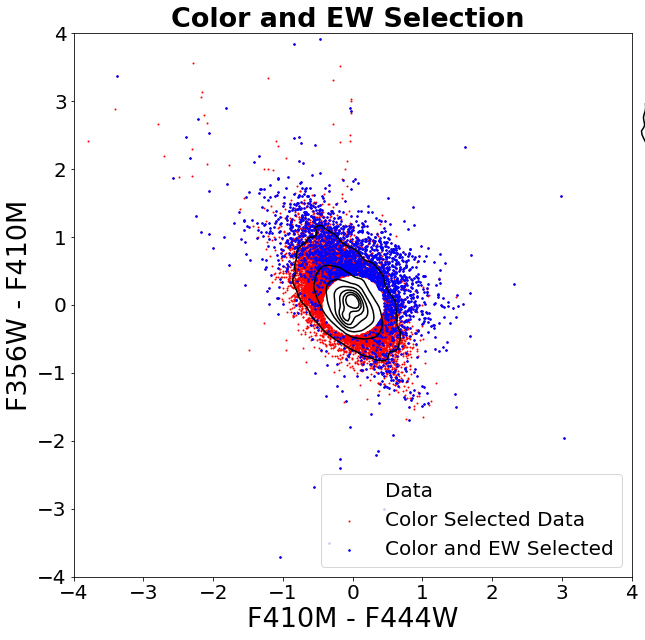

In [52]:
plt.rcParams['figure.figsize'] = (10, 10)
plt.figure()
#Create two masks for the data in the color-color plot to specify filter value > 3 times error and position
# in color-color plot
msk = (df_new['F410'] > 3*df_new['F410_ERROR']) & (df_new['F444'] > 3*df_new['F444_ERROR']) & (df_new['F356'] > 3*df_new['F356_ERROR'])

x, y = np.array(df_col_new['F410 - F444'][msk]), np.array(df_col_new['F356 - F410'][msk])

a = .5
b = .5

#mask = np.repeat(False, len(x))
mask = np.sqrt(((x)**2)/(a**2) + ((y)**2)/b**2) <= .9

#number_inside = np.count_nonzero(mask) 

xs = df_col_new['F410 - F444'][msk]
ys = df_col_new['F356 - F410'][msk]

dat =  pd.DataFrame({'F410 - F444':xs.values, 'F356 - F410':ys.values})
sns.kdeplot(data = dat, x = 'F410 - F444', y = 'F356 - F410',  fill = False,  label = 'Data', 
            levels = 8, color = 'k')
bool_mask = ~mask

big = df_col_new['F410 - F444'][msk][bool_mask]

plt.scatter(df_col_new['F410 - F444'][msk][bool_mask],df_col_new['F356 - F410'][msk][bool_mask], 
            s = 1,  color = 'red', label = 'Color Selected Data')

#Add axes and titles

leng = len(df_col_new['F410 - F444'][msk][bool_mask])


ewmin = 5000
ew_bool = df_new[msk][bool_mask]['EW'].values>ewmin

plt.scatter(df_col_new['F410 - F444'][msk][bool_mask][ew_bool],
                df_col_new['F356 - F410'][msk][bool_mask][ew_bool], 
                s = 10,  color = 'blue', marker = '.', label = 'Color and EW Selected')

lengew = len(df_col_new['F410 - F444'][msk][bool_mask][ew_bool])
plt.xlim(-4,4)
plt.ylim(-4,4)
plt.xlabel('F410M - F444W')
plt.ylabel('F356W - F410M')

#plt.title(f'All Pointings \n{leng} Sources Color Selected \n{lengew} Sources EW Selected')
tot = len(df_col_new['F410 - F444'][msk][bool_mask][ew_bool])
plt.title(f'Color and EW Selection ')#\n {tot} sources')
plt.legend();

We then draw a line from the F150W filter to the F444W filter and perform a chi sqr fit to identify sources with a linear behavior across these filters and a positive slope. We consider these to be red emission line interlopers.

In [63]:
ewmin = 5000
ew_bool = df_new[msk]['EW'].values>ewmin


#ewmin = 5000
#CLASSIFICATION CODE
plt.rcParams['figure.figsize'] = (10, 5)
#plot_sources(remaining['Object'], remaining, df_col6, 6)
df = df_new[msk]#[bool_mask][ew_bool]
sources = df_new[msk][ew_bool]['Object']
#plt.rcParams['figure.figsize'] = (20, 10)
#Grab filters from DataFrame
fs = []
fs_strings = []
a=df.index[0]
c=0
wchivals = []
chivals = []

HST_filters = [140.0, 81.4, 60.6, 105.0, 125.0,  160.0]


fs = []
fs_strings = []

for key in df.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=16
stop2 = 29
f_final = []
for f in fs:
    if f>600:
        f_final.append(f*.1)
    else:
        f_final.append(f)

#Create a colormap 
#colormap = plt.cm.gist_ncar
#colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
#Create an SED for each of the sources
i=0
n=0
for obj in sources:
    #Increase the iteration tracker, grab the DataFrame for just this object
    n+=1
    #print(shapes[i])
    mk = np.array(df['Object']) == np.array(obj)
    a = df[mk]
    #Get the redshift and filters
    rs = a['PHOTOM_RED_SHIFT']
    filters = np.array(a.keys()[start:stop].values)
    filter_er = np.array(a.keys()[stop:stop2].values)
    #Mask the data so all filter values are greater than 3 times their error
    mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
    #Sort the data so the SED plot connects from left to right, regardless of filter input order
    z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
    x=[i[0] for i in z]
    y=[i[1] for i in z]
   # plt.errorbar(x,y,a[filter_er].values[0][mask], label = f'Redshift = {rs.values[0]}, {obj}',
    #            color = 'k')
        #Add the x ticks
    #plt.xticks(np.array(f_final)[mask])
    
    #for point in range(len(x)):
    #    if x[point] in HST_filters:
            #plt.plot(x[point], y[point], marker = '*', color = 'r', markersize = 20)
           
    try:
        xstart = 150.0
        xend = 444.0
        ystart = y[-6]
        yend = y[-1]

        
            
        m = (yend-ystart)/(xend-xstart)
        b = yend-m*xend
        
        if m<0:
            chi2 = 1e2
            chivals.append(1e2)
        else:

            xmodel = np.array([150.0, 200.0, 277.0, 356.0, 410.0, 444.0])
            ymodel = m*xmodel + b
            #plt.plot(xmodel,ymodel,c = 'b')

            datax = np.array([150.0, 200.0, 277.0, 356.0, 410.0, 444.0])
            datay = y[-6:]
            dataerr = a[filter_er].values[0][mask][-6:]
            
            if datay[0]<datay[1]<datay[2]<datay[3]<datay[4]<datay[5]:
                fact = np.max(y)/10
                chi2 = 0
                for xi in range(len(datax)):
                    chi2+= ((ymodel[xi] - datay[xi])**2)/(fact*dataerr[xi]**2)
                chivals.append(chi2)
            else:
                chi2 = 1e2
                chivals.append(1e2)
        #print('ran')
    except:
        chi2 = 1e2
        chivals.append(1e2)
    
    #Add 277, 356, 410, and 444 filters
    #plt.axvspan(314, 398, label= 'F356', color = 'y', alpha = .25)
    #plt.axvspan(386.4, 430.1, label= 'F410', alpha = 0.25, color = 'orange')
    #plt.axvspan(388, 498.6, label= 'F444', color = 'r', alpha = .25)
    #plt.axvspan(241.6, 312.7, label= 'F277', color = 'g', alpha = .25)
    wchi = (1+float(rs))*chi2
    wchivals.append(wchi)
    #Add titles and labels
    #plt.title(f'Source {obj}, chisqr: {round(chi2,3)} \n redshift: {round(float(rs),3)}, weighted chi2 = {round(wchi,3)}')
    #plt.ylabel('Flux (nJy)')
    #plt.yscale("log")
    #plt.xlabel('Filter')
    #plt.xticks(rotation = 45)
    #plt.legend()
    #plt.tick_params('y', length=20, width=2, which='major')
    #plt.tick_params('y', length=10, width=1, which='minor')
    i+=1
    #plt.show()
    #plt.close()
    #plt.figure();

print('Cut at F150')
cutvals = [0,1, 2, 3, 4, 10]
for cutval in cutvals:
    #cutval = 10
    cutmask = np.array(wchivals)>cutval
    names_post_cut = df_new['Object'][msk][ew_bool][cutmask].values


    old_eelgs = pd.read_pickle('all_eelgs.csv')
    objects = names_post_cut
    bad = 0
    recover = []
    boolar = []
    shapes = []
    for o in old_eelgs['Object'].values:
        if o not in objects:
            s = old_eelgs[old_eelgs['Object'] == o]['Shape'].values[0]


            shapes.append(s)


            bad+=1
            boolar.append(True)
            recover.append(o)
        else:
            boolar.append(False)
    irg_gal = np.array(shapes) != 'Irg'
    lost = len(np.array(shapes)[irg_gal])
    print(lost, 'sources lost in', cutval)


Cut at F150
658 sources lost in 0
658 sources lost in 1
658 sources lost in 2
658 sources lost in 3
658 sources lost in 4
659 sources lost in 10


In [65]:
cutval = 3
cutmask = np.array(wchivals)>cutval

redew = np.array(ews_tot)>5000
blueew = np.array(ews_tot277)>5000
ewbool = []
color_select = []
for i in range(len(df_new)):
    if redew[i] == True and blueew[i] == False:
        ewbool.append(True)
        color_select.append('red')
    if redew[i] == False and blueew[i] == True:
        ewbool.append(True)
        color_select.append('277')
    if redew[i] == True and blueew[i] == True:
        ewbool.append(True)
        color_select.append('both')
    if redew[i] == False and blueew[i] == False:
        ewbool.append(False)

In [66]:
ew_remain = df_new[msk][ew_bool][cutmask]
ew_remain

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,PHOTOM_RED_SHIFT,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277
41,214.953045,52.983808,2,0.062443,-0.834431,-0.279612,4.563413,3.736782,7.727645,4.325859,...,18.13,11.048602,"[11.048601698096837, 11.048846560287634, 11.04...","[18.12999999999993, 18.159999999999933, 18.099...",0.760,0.449,5.80,18.97,6963.218359,3615.409509
61,214.924342,52.963187,2,29.310970,32.080626,32.642583,39.894291,72.621066,134.456283,71.754768,...,6.97,20.495199,"[20.495198788558987, 21.158022907371905, 21.27...","[6.970000000000013, 6.940000000000013, 7.00000...",2.688,2.259,6.94,7.18,8316.573667,NaN
190,215.009686,53.017001,1,302.312967,552.392100,671.217284,828.786644,963.060358,1041.188003,1050.557701,...,1.90,6.410421,"[6.41042141970936, 6.597435017056181, 6.675762...","[1.9000000000000015, 1.9300000000000015, 2.080...",6.051,3.354,1.87,2.20,7379.427651,NaN
192,214.970902,52.995678,1,14.212326,11.627032,17.474609,19.642713,14.332065,37.270515,15.781275,...,5.05,6.066577,"[6.066576579928967, 6.180890438855775, 6.55273...","[5.049999999999997, 5.019999999999997, 4.98999...",1.344,1.036,4.90,5.26,5642.032482,1406.420122
210,214.977343,52.999644,1,5.915133,6.558885,7.293308,6.278270,8.870115,19.223844,9.918504,...,7.00,1.794455,"[1.7944552198289045, 1.8458916656805124, 1.881...","[7.000000000000013, 7.030000000000014, 6.97000...",0.851,0.680,5.26,8.02,6539.254671,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101680,214.823532,52.732549,2,18.494534,46.391512,36.590216,39.439304,927.777173,1125.432376,361.750597,...,7.39,299.022984,"[299.0229844915008, 299.04741148729596, 299.14...","[7.3900000000000166, 7.420000000000017, 7.3600...",2.092,1.343,7.27,7.51,52052.571722,NaN
101772,214.886416,52.776351,1,1.265444,3.469587,4.615524,4.801804,4.981320,8.128695,7.152297,...,2.35,39.870971,"[39.87097059338707, 40.25483672445875, 40.2736...","[2.349999999999999, 10.449999999999969, 10.419...",0.883,0.604,2.23,10.48,5047.779301,NaN
101785,214.895602,52.782766,1,0.251271,2.637867,1.486632,5.149648,54.685462,69.796566,26.227536,...,7.21,34.302253,"[34.302253207922966, 34.312211819148786, 34.32...","[7.210000000000015, 7.240000000000015, 7.18000...",0.796,0.500,6.76,18.88,43778.990174,NaN
101803,214.894003,52.781401,1,4.147596,-3.875856,7.779653,172.093406,707.268232,2208.621701,525.474195,...,19.99,136.059806,"[136.05980638252544, 136.46538122326882, 136.8...","[19.990000000000002, 19.96, 7.480000000000017,...",2.052,0.954,6.22,19.75,29760.369609,NaN


# Source Cuts

we toss sources within 1 arcsecond of a nearby source >100nJy brighter or sources near the edge of the detector

<a class="anchor" id="edge_cut"></a>

In [79]:
p1 = df_new['Pointing'] == 1
dpoint1 = df_new[p1]
print(len(dpoint1), 'Sources in pointing 1')

p2 = df_new['Pointing'] == 2
dpoint2 = df_new[p2]
print(len(dpoint2), 'Sources in pointing 2')

p3 = df_new['Pointing'] == 3
dpoint3 = df_new[p3]
print(len(dpoint3), 'Sources in pointing 3')

p4 = df_new['Pointing'] == 4
dpoint4 = df_new[p4]
print(len(dpoint4), 'Sources in pointing 4')

p5 = df_new['Pointing'] == 5
dpoint5 = df_new[p5]
print(len(dpoint5), 'Sources in pointing 5')

p6 = df_new['Pointing'] == 6
dpoint6 = df_new[p6]
print(len(dpoint6), 'Sources in pointing 6')

p7 = df_new['Pointing'] == 7
dpoint7 = df_new[p7]
print(len(dpoint7), 'Sources in pointing 7')

p8 = df_new['Pointing'] == 8
dpoint8 = df_new[p8]
print(len(dpoint8), 'Sources in pointing 8')

p9 = df_new['Pointing'] == 9
dpoint9 = df_new[p9]
print(len(dpoint9), 'Sources in pointing 9')

p10 = df_new['Pointing'] == 10
dpoint10 = df_new[p10]
print(len(dpoint10), 'Sources in pointing 10')

10738 Sources in pointing 1
10181 Sources in pointing 2
11185 Sources in pointing 3
10496 Sources in pointing 4
9185 Sources in pointing 5
11600 Sources in pointing 6
10466 Sources in pointing 7
10029 Sources in pointing 8
9394 Sources in pointing 9
8534 Sources in pointing 10


In [80]:
p1 = ew_remain['Pointing'] == 1
point1 = ew_remain[p1]
print(len(point1), 'EELG Candidates in pointing 1')

p2 = ew_remain['Pointing'] == 2
point2 = ew_remain[p2]
print(len(point2), 'EELG Candidates in pointing 2')

p3 = ew_remain['Pointing'] == 3
point3 = ew_remain[p3]
print(len(point3), 'EELG Candidates in pointing 3')

p4 = ew_remain['Pointing'] == 4
point4 = ew_remain[p4]
print(len(point4), 'EELG Candidates in pointing 4')

p5 = ew_remain['Pointing'] == 5
point5 = ew_remain[p5]
print(len(point5), 'EELG Candidates in pointing 5')

p6 = ew_remain['Pointing'] == 6
point6 = ew_remain[p6]
print(len(point6), 'EELG Candidates in pointing 6')

p7 = ew_remain['Pointing'] == 7
point7 = ew_remain[p7]
print(len(point7), 'EELG Candidates in pointing 7')

p8 = ew_remain['Pointing'] == 8
point8 = ew_remain[p8]
print(len(point8), 'EELG Candidates in pointing 8')

p9 = ew_remain['Pointing'] == 9
point9 = ew_remain[p9]
print(len(point9), 'EELG Candidates in pointing 9')

p10 = ew_remain['Pointing'] == 10
point10 = ew_remain[p10]
print(len(point10), 'EELG Candidates in pointing 10')

385 EELG Candidates in pointing 1
349 EELG Candidates in pointing 2
518 EELG Candidates in pointing 3
563 EELG Candidates in pointing 4
274 EELG Candidates in pointing 5
529 EELG Candidates in pointing 6
438 EELG Candidates in pointing 7
446 EELG Candidates in pointing 8
315 EELG Candidates in pointing 9
292 EELG Candidates in pointing 10


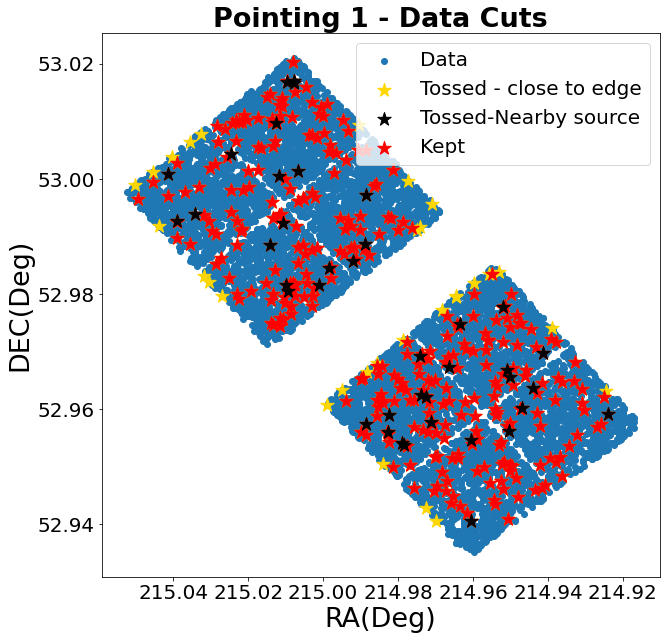

In [69]:
cut1 = cut_sides(dpoint1, point1, 1)

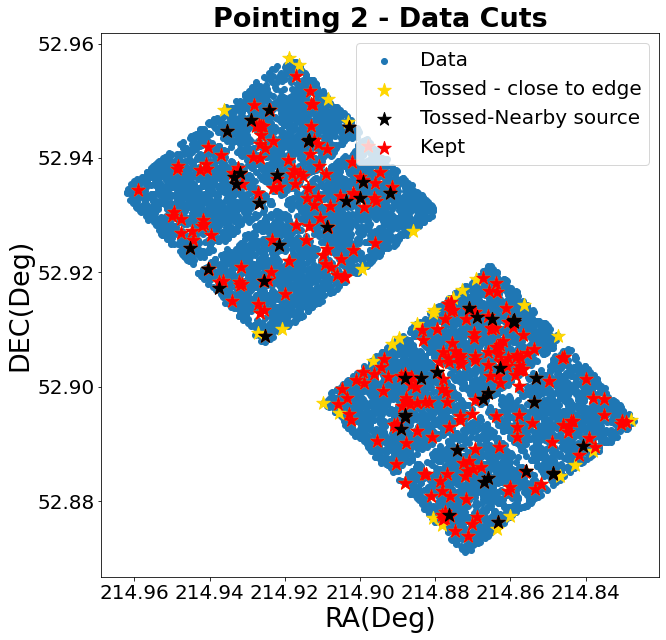

In [70]:
cut2 = cut_sides(dpoint2, point2, 2)

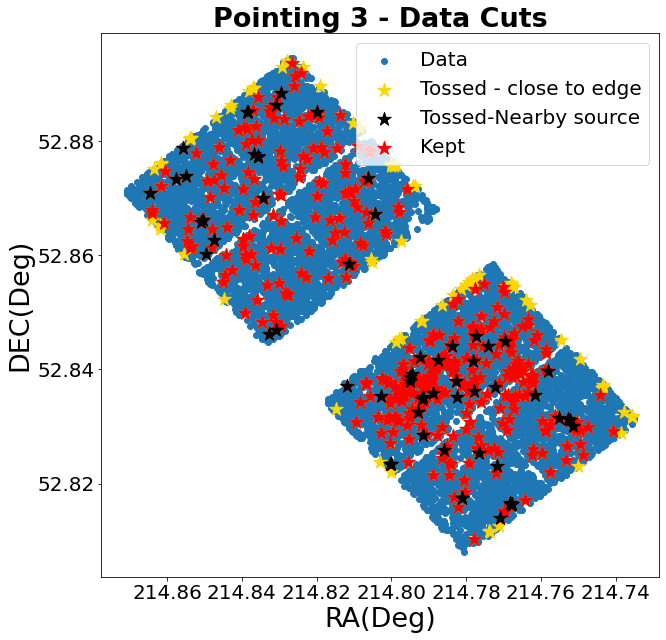

In [71]:
cut3 = cut_sides(dpoint3, point3, 3)

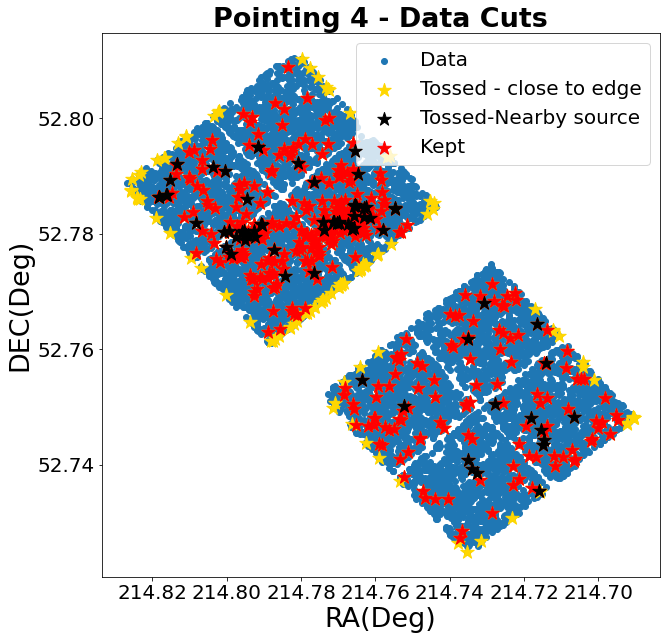

In [72]:
cut4 = cut_sides(dpoint4, point4, 4)

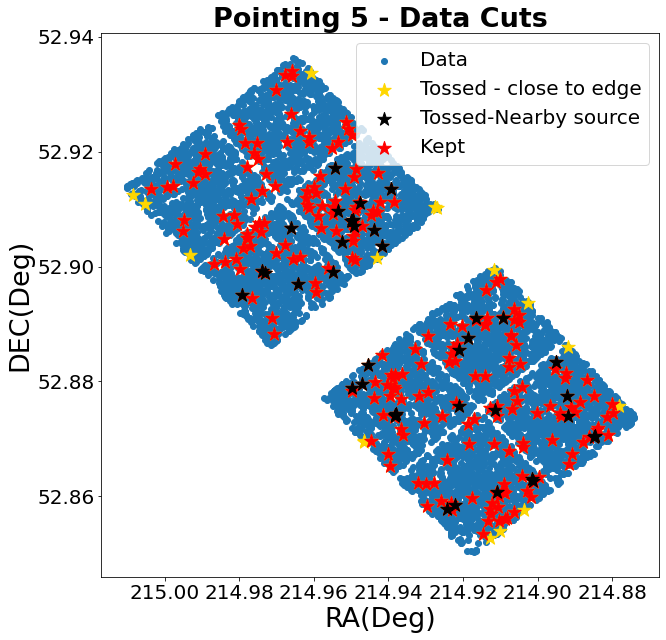

In [73]:
cut5 = cut_sides(dpoint5, point5, 5)

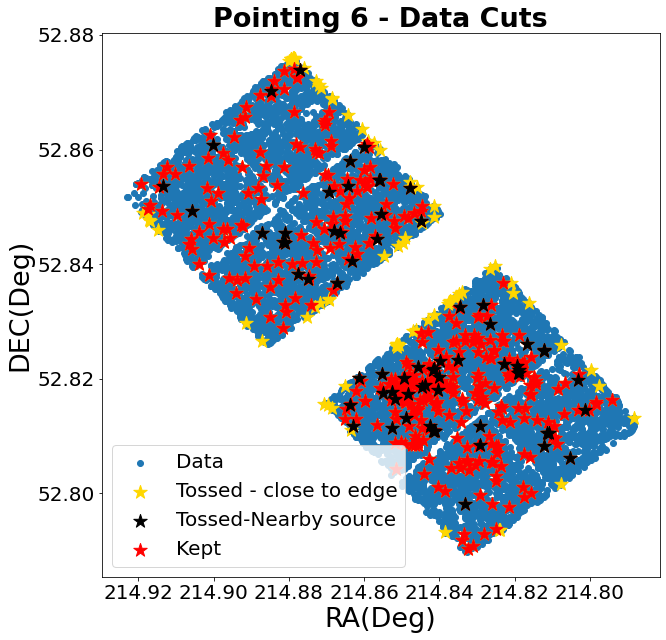

In [74]:
cut6 = cut_sides(dpoint6, point6, 6)

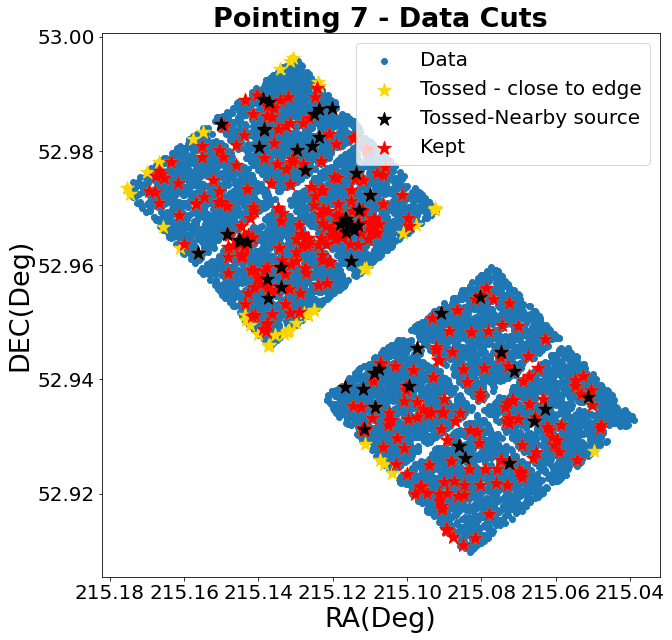

In [75]:
cut7 = cut_sides(dpoint7, point7, 7)

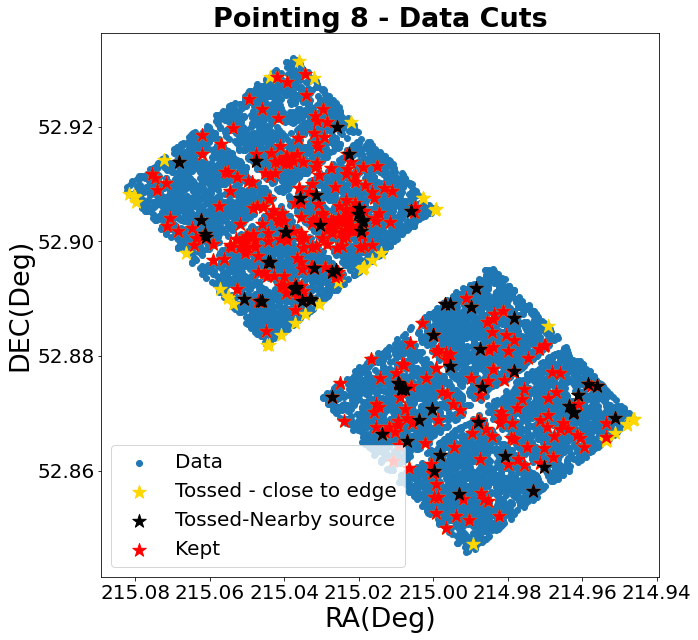

In [76]:
cut8 = cut_sides(dpoint8, point8, 8)

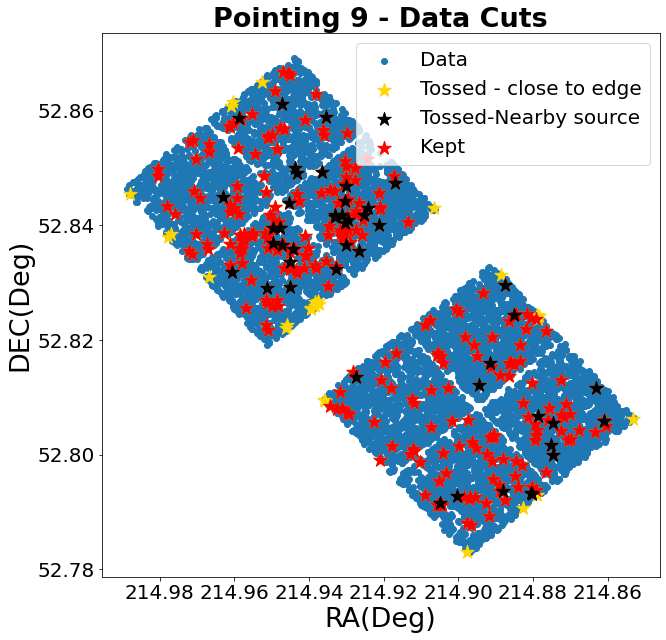

In [77]:
cut9 = cut_sides(dpoint9, point9, 9)

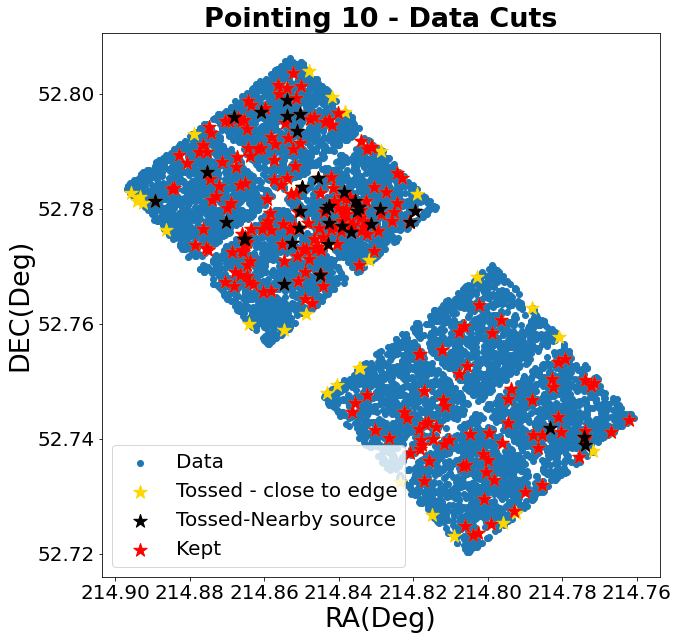

In [78]:
cut10 = cut_sides(dpoint10, point10, 10)

In [81]:
post_cuts = pd.concat([cut1, cut2, cut3, cut4, cut5, cut6, cut7, cut8, cut9, cut10],ignore_index=True)
post_cuts

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,PHOTOM_RED_SHIFT,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277
0,215.009686,53.017001,1,302.312967,552.392100,671.217284,828.786644,963.060358,1041.188003,1050.557701,...,1.90,6.410421,"[6.41042141970936, 6.597435017056181, 6.675762...","[1.9000000000000015, 1.9300000000000015, 2.080...",6.051,3.354,1.87,2.20,7379.427651,NaN
1,214.932836,52.968113,2,8.616176,6.404878,5.466024,8.697954,5.227619,36.690439,18.155623,...,7.33,42.247046,"[42.247045857894605, 42.3141080489829, 42.3535...","[7.330000000000016, 7.360000000000016, 7.30000...",1.353,1.199,7.21,7.42,12254.874429,NaN
2,214.954783,52.983419,2,4.188721,5.663508,3.364383,4.192558,6.617743,6.330266,9.480273,...,1.93,10.706817,"[10.706816876031219, 10.822995223554331, 10.85...","[1.9300000000000015, 1.9000000000000015, 1.960...",1.199,0.912,1.96,7.90,15527.857114,748.508551
3,214.939178,52.972235,2,4.252985,4.610895,5.548351,8.809229,5.799238,10.152478,10.102836,...,1.63,14.460052,"[14.460051996450623, 14.918307276464102, 15.29...","[1.6300000000000012, 1.6000000000000012, 1.660...",1.231,0.983,1.36,6.79,10175.728700,NaN
4,214.924964,52.962075,2,1.736885,3.568556,4.809306,4.163764,7.987744,25.117955,12.760980,...,7.45,13.979583,"[13.979583410598808, 14.013243338494997, 14.08...","[7.450000000000017, 7.420000000000017, 7.48000...",1.301,0.797,7.12,7.48,13443.115868,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3640,214.836501,52.744679,2,803.435389,1124.853484,1509.830216,1893.072836,2234.876836,2488.304331,2610.017234,...,1.72,6.110403,"[6.110402778643463, 6.373504252572735, 6.51520...","[1.7200000000000013, 1.6900000000000013, 1.750...",6.581,5.203,1.63,1.78,17565.865076,NaN
3641,214.889203,52.781325,1,1398.382705,1913.146292,2669.943747,3694.991757,4069.527052,4417.890654,4891.732506,...,1.69,14.226967,"[14.22696717386116, 14.269812298199462, 14.332...","[1.6900000000000013, 1.8100000000000014, 1.720...",10.250,3.481,1.27,1.78,7162.266852,NaN
3642,214.868189,52.766583,1,962.593990,1351.938672,1784.317194,2312.761150,2424.961641,2583.010472,2799.387380,...,1.75,5.563958,"[5.563957822710216, 5.697036827653534, 5.87899...","[1.7500000000000013, 1.7200000000000013, 1.780...",11.828,5.519,1.69,1.81,5249.239081,NaN
3643,214.878627,52.773674,1,1.629938,0.500411,1.725610,4.382257,8.649793,10.304757,10.092519,...,1.63,37.051095,"[37.051094681603956, 37.0706077180152, 37.5872...","[1.6300000000000012, 1.6000000000000012, 4.869...",0.756,0.451,3.16,8.53,7285.036137,NaN


In [82]:
#Assigning a location (bottom or top) of each pointing to indicate which detector block the source is in

Area1 = post_cuts['F356']-post_cuts['F410']>0
Area2 = post_cuts['F356']-post_cuts['F410']<0

area1 = post_cuts[Area1]
area2 = post_cuts[Area2]

area1['Area'] = np.repeat('Top', len(area1))
area2['Area'] = np.repeat('Bottom', len(area2))
post_cuts = pd.concat([area1, area2], ignore_index = True)
post_cuts

<ipython-input-82-7d6405a04d84>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  area1['Area'] = np.repeat('Top', len(area1))
<ipython-input-82-7d6405a04d84>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  area2['Area'] = np.repeat('Bottom', len(area2))


,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277,Area
0,214.954783,52.983419,2,4.188721,5.663508,3.364383,4.192558,6.617743,6.330266,9.480273,...,10.706817,"[10.706816876031219, 10.822995223554331, 10.85...","[1.9300000000000015, 1.9000000000000015, 1.960...",1.199000,0.912,1.96,7.90,15527.857114,748.508551,Top
1,214.930827,52.963421,2,14120.972365,21037.775831,29760.212411,42601.633905,46421.133123,44121.358330,42316.546379,...,4.656620,"[4.656619985137884, 4.683230356103618, 5.20071...","[1.1200000000000008, 1.1500000000000008, 1.090...",19.356001,13.555,1.03,1.18,6853.878224,NaN,Top
2,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,22.103577,...,7.274877,"[7.274876591567221, 7.374749539899978, 7.75149...","[6.61000000000001, 6.64000000000001, 6.5800000...",2.588000,1.962,4.30,6.61,5667.584823,1860.582914,Top
3,215.007727,53.016718,1,167.029639,216.001733,191.770087,204.920793,215.822859,200.348072,428.196307,...,24.811615,"[24.811615116470264, 24.840917166064067, 25.24...","[7.9900000000000215, 7.960000000000021, 8.0200...",4.289000,3.190,7.93,8.05,12706.497007,NaN,Top
4,214.930825,52.961072,2,5569.394657,8647.815050,12184.993624,17334.789307,18425.384588,17414.187663,16406.495670,...,4.414447,"[4.414446875782519, 4.415717223844215, 4.80031...","[1.1200000000000008, 1.0900000000000007, 1.060...",12.543000,10.482,0.94,1.18,5917.400844,NaN,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3640,214.836501,52.744679,2,803.435389,1124.853484,1509.830216,1893.072836,2234.876836,2488.304331,2610.017234,...,6.110403,"[6.110402778643463, 6.373504252572735, 6.51520...","[1.7200000000000013, 1.6900000000000013, 1.750...",6.581000,5.203,1.63,1.78,17565.865076,NaN,Bottom
3641,214.889203,52.781325,1,1398.382705,1913.146292,2669.943747,3694.991757,4069.527052,4417.890654,4891.732506,...,14.226967,"[14.22696717386116, 14.269812298199462, 14.332...","[1.6900000000000013, 1.8100000000000014, 1.720...",10.250000,3.481,1.27,1.78,7162.266852,NaN,Bottom
3642,214.868189,52.766583,1,962.593990,1351.938672,1784.317194,2312.761150,2424.961641,2583.010472,2799.387380,...,5.563958,"[5.563957822710216, 5.697036827653534, 5.87899...","[1.7500000000000013, 1.7200000000000013, 1.780...",11.828000,5.519,1.69,1.81,5249.239081,NaN,Bottom
3643,214.878627,52.773674,1,1.629938,0.500411,1.725610,4.382257,8.649793,10.304757,10.092519,...,37.051095,"[37.051094681603956, 37.0706077180152, 37.5872...","[1.6300000000000012, 1.6000000000000012, 4.869...",0.756000,0.451,3.16,8.53,7285.036137,NaN,Bottom


In [84]:
#This was used when we considered exclusing the brightest sources, but this cut was 
#ultimately not used
blue_cuts = post_cuts#[post_cuts['F410']<1e5]
print(len(post_cuts))
blue_cuts

3645


,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277,Area
0,214.954783,52.983419,2,4.188721,5.663508,3.364383,4.192558,6.617743,6.330266,9.480273,...,10.706817,"[10.706816876031219, 10.822995223554331, 10.85...","[1.9300000000000015, 1.9000000000000015, 1.960...",1.199000,0.912,1.96,7.90,15527.857114,748.508551,Top
1,214.930827,52.963421,2,14120.972365,21037.775831,29760.212411,42601.633905,46421.133123,44121.358330,42316.546379,...,4.656620,"[4.656619985137884, 4.683230356103618, 5.20071...","[1.1200000000000008, 1.1500000000000008, 1.090...",19.356001,13.555,1.03,1.18,6853.878224,NaN,Top
2,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,22.103577,...,7.274877,"[7.274876591567221, 7.374749539899978, 7.75149...","[6.61000000000001, 6.64000000000001, 6.5800000...",2.588000,1.962,4.30,6.61,5667.584823,1860.582914,Top
3,215.007727,53.016718,1,167.029639,216.001733,191.770087,204.920793,215.822859,200.348072,428.196307,...,24.811615,"[24.811615116470264, 24.840917166064067, 25.24...","[7.9900000000000215, 7.960000000000021, 8.0200...",4.289000,3.190,7.93,8.05,12706.497007,NaN,Top
4,214.930825,52.961072,2,5569.394657,8647.815050,12184.993624,17334.789307,18425.384588,17414.187663,16406.495670,...,4.414447,"[4.414446875782519, 4.415717223844215, 4.80031...","[1.1200000000000008, 1.0900000000000007, 1.060...",12.543000,10.482,0.94,1.18,5917.400844,NaN,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3640,214.836501,52.744679,2,803.435389,1124.853484,1509.830216,1893.072836,2234.876836,2488.304331,2610.017234,...,6.110403,"[6.110402778643463, 6.373504252572735, 6.51520...","[1.7200000000000013, 1.6900000000000013, 1.750...",6.581000,5.203,1.63,1.78,17565.865076,NaN,Bottom
3641,214.889203,52.781325,1,1398.382705,1913.146292,2669.943747,3694.991757,4069.527052,4417.890654,4891.732506,...,14.226967,"[14.22696717386116, 14.269812298199462, 14.332...","[1.6900000000000013, 1.8100000000000014, 1.720...",10.250000,3.481,1.27,1.78,7162.266852,NaN,Bottom
3642,214.868189,52.766583,1,962.593990,1351.938672,1784.317194,2312.761150,2424.961641,2583.010472,2799.387380,...,5.563958,"[5.563957822710216, 5.697036827653534, 5.87899...","[1.7500000000000013, 1.7200000000000013, 1.780...",11.828000,5.519,1.69,1.81,5249.239081,NaN,Bottom
3643,214.878627,52.773674,1,1.629938,0.500411,1.725610,4.382257,8.649793,10.304757,10.092519,...,37.051095,"[37.051094681603956, 37.0706077180152, 37.5872...","[1.6300000000000012, 1.6000000000000012, 4.869...",0.756000,0.451,3.16,8.53,7285.036137,NaN,Bottom


# Minnimum Observations

we impose a minimum number of detected filters (5) to consider a source for the sample

<a class="anchor" id="min_o"></a>

In [85]:
dv = blue_cuts
fs = []
fs_strings = []
a=dv.index[0]
c=0


fs = []
fs_strings = []

for key in dv.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=16
stop2 = 29
f_final = []
for f in fs:
    f_final.append(f)

#Change this variable to adjust cut
min_obs = 5
filter_strings = blue_cuts.keys()[start:stop]
error_strings = blue_cuts.keys()[stop:stop2]
keep = []
for ind in blue_cuts.index:
    fvals = []
    evals = []
    dat = blue_cuts.loc[ind]
    for s in range(len(filter_strings)):
        fvals.append(dat[filter_strings[s]])
        evals.append(dat[error_strings[s]])
    hits = (np.array(fvals)>3*np.array(evals) )#& (np.array(fvals) >0) &(np.array(evals) >0)
    hit_count = np.count_nonzero(hits)
    if hit_count > min_obs:
        toss = 0
        mn = np.min(np.array(fvals)[hits])
        mx = np.max(np.array(fvals)[hits])
        if mn<10:
            toss+=1
        #if mx >700:
         #   toss+=1
        #for val in  np.array(fvals)[hits]:
         #   if val < 10:
          #      toss +=1
           # elif val >500:
            #    toss+=1
        if toss == 0:
            keep.append(ind)

blue_cuts.loc[keep]

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277,Area
1,214.930827,52.963421,2,14120.972365,21037.775831,29760.212411,42601.633905,46421.133123,44121.358330,42316.546379,...,4.656620,"[4.656619985137884, 4.683230356103618, 5.20071...","[1.1200000000000008, 1.1500000000000008, 1.090...",19.356001,13.555,1.03,1.18,6853.878224,NaN,Top
2,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,22.103577,...,7.274877,"[7.274876591567221, 7.374749539899978, 7.75149...","[6.61000000000001, 6.64000000000001, 6.5800000...",2.588000,1.962,4.30,6.61,5667.584823,1860.582914,Top
3,215.007727,53.016718,1,167.029639,216.001733,191.770087,204.920793,215.822859,200.348072,428.196307,...,24.811615,"[24.811615116470264, 24.840917166064067, 25.24...","[7.9900000000000215, 7.960000000000021, 8.0200...",4.289000,3.190,7.93,8.05,12706.497007,NaN,Top
4,214.930825,52.961072,2,5569.394657,8647.815050,12184.993624,17334.789307,18425.384588,17414.187663,16406.495670,...,4.414447,"[4.414446875782519, 4.415717223844215, 4.80031...","[1.1200000000000008, 1.0900000000000007, 1.060...",12.543000,10.482,0.94,1.18,5917.400844,NaN,Top
6,214.936184,52.964741,2,37.962750,39.519575,48.915930,78.632956,68.369465,62.167033,74.352124,...,13.028586,"[13.028585563899682, 13.07776872565458, 13.130...","[4.659999999999994, 4.689999999999994, 4.62999...",3.423000,2.461,1.57,5.53,5350.781161,NaN,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3638,214.875497,52.773130,1,11.844572,19.393734,14.444475,40.619241,24.589348,40.681511,16.975843,...,25.979424,"[25.979423982370857, 26.02824702267938, 26.087...","[5.079999999999997, 5.109999999999998, 5.13999...",2.367000,1.845,4.51,5.17,5072.359875,7887.077205,Bottom
3640,214.836501,52.744679,2,803.435389,1124.853484,1509.830216,1893.072836,2234.876836,2488.304331,2610.017234,...,6.110403,"[6.110402778643463, 6.373504252572735, 6.51520...","[1.7200000000000013, 1.6900000000000013, 1.750...",6.581000,5.203,1.63,1.78,17565.865076,NaN,Bottom
3641,214.889203,52.781325,1,1398.382705,1913.146292,2669.943747,3694.991757,4069.527052,4417.890654,4891.732506,...,14.226967,"[14.22696717386116, 14.269812298199462, 14.332...","[1.6900000000000013, 1.8100000000000014, 1.720...",10.250000,3.481,1.27,1.78,7162.266852,NaN,Bottom
3642,214.868189,52.766583,1,962.593990,1351.938672,1784.317194,2312.761150,2424.961641,2583.010472,2799.387380,...,5.563958,"[5.563957822710216, 5.697036827653534, 5.87899...","[1.7500000000000013, 1.7200000000000013, 1.780...",11.828000,5.519,1.69,1.81,5249.239081,NaN,Bottom


In [86]:
eelgs = blue_cuts.loc[keep]
eelgs

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277,Area
1,214.930827,52.963421,2,14120.972365,21037.775831,29760.212411,42601.633905,46421.133123,44121.358330,42316.546379,...,4.656620,"[4.656619985137884, 4.683230356103618, 5.20071...","[1.1200000000000008, 1.1500000000000008, 1.090...",19.356001,13.555,1.03,1.18,6853.878224,NaN,Top
2,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,22.103577,...,7.274877,"[7.274876591567221, 7.374749539899978, 7.75149...","[6.61000000000001, 6.64000000000001, 6.5800000...",2.588000,1.962,4.30,6.61,5667.584823,1860.582914,Top
3,215.007727,53.016718,1,167.029639,216.001733,191.770087,204.920793,215.822859,200.348072,428.196307,...,24.811615,"[24.811615116470264, 24.840917166064067, 25.24...","[7.9900000000000215, 7.960000000000021, 8.0200...",4.289000,3.190,7.93,8.05,12706.497007,NaN,Top
4,214.930825,52.961072,2,5569.394657,8647.815050,12184.993624,17334.789307,18425.384588,17414.187663,16406.495670,...,4.414447,"[4.414446875782519, 4.415717223844215, 4.80031...","[1.1200000000000008, 1.0900000000000007, 1.060...",12.543000,10.482,0.94,1.18,5917.400844,NaN,Top
6,214.936184,52.964741,2,37.962750,39.519575,48.915930,78.632956,68.369465,62.167033,74.352124,...,13.028586,"[13.028585563899682, 13.07776872565458, 13.130...","[4.659999999999994, 4.689999999999994, 4.62999...",3.423000,2.461,1.57,5.53,5350.781161,NaN,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3638,214.875497,52.773130,1,11.844572,19.393734,14.444475,40.619241,24.589348,40.681511,16.975843,...,25.979424,"[25.979423982370857, 26.02824702267938, 26.087...","[5.079999999999997, 5.109999999999998, 5.13999...",2.367000,1.845,4.51,5.17,5072.359875,7887.077205,Bottom
3640,214.836501,52.744679,2,803.435389,1124.853484,1509.830216,1893.072836,2234.876836,2488.304331,2610.017234,...,6.110403,"[6.110402778643463, 6.373504252572735, 6.51520...","[1.7200000000000013, 1.6900000000000013, 1.750...",6.581000,5.203,1.63,1.78,17565.865076,NaN,Bottom
3641,214.889203,52.781325,1,1398.382705,1913.146292,2669.943747,3694.991757,4069.527052,4417.890654,4891.732506,...,14.226967,"[14.22696717386116, 14.269812298199462, 14.332...","[1.6900000000000013, 1.8100000000000014, 1.720...",10.250000,3.481,1.27,1.78,7162.266852,NaN,Bottom
3642,214.868189,52.766583,1,962.593990,1351.938672,1784.317194,2312.761150,2424.961641,2583.010472,2799.387380,...,5.563958,"[5.563957822710216, 5.697036827653534, 5.87899...","[1.7500000000000013, 1.7200000000000013, 1.780...",11.828000,5.519,1.69,1.81,5249.239081,NaN,Bottom


# Adding F277W filter

We add in the identification of sources with emission in F277W second becuase we decided to add this back in later. We repeat all the previous steps

<a class="anchor" id="f277"></a>

In [100]:
#Create two masks for the data in the color-color plot to specify filter value > 3 times error and position
# in color-color plot
msk = (df_new['F410'] > 3*df_new['F410_ERROR']) & (df_new['F277'] > 3*df_new['F277_ERROR']) & (df_new['F356'] > 3*df_new['F356_ERROR'])

x, y = np.array(df_col_new['F356 - F410'][msk]), np.array(df_col_new['F277 - F356'][msk])

a = .4
b = .4
mask = np.sqrt(((x-.2)**2)/(a**2) + ((y+.1)**2)/b**2) <0

#number_inside = np.count_nonzero(mask) 


#iminj = big_data_col['F356 - F410'][msk]> (0.44+big_data_col['F356 - F410_ERROR'][msk])
#jminh = big_data_col['F410 - F444'][msk]< (0.44-big_data_col['F410 - F444_ERROR'][msk])
bool_mask = ~mask

#big = big_data_col['F410 - F444'][msk][bool_mask]



In [99]:
color_remain = df_new[msk][bool_mask]
ews = get_ew_277(df = color_remain, sources = color_remain['Object'])

<ipython-input-31-32a4510363fa>:94: RuntimeWarning: All-NaN axis encountered
  ews_tot.append(np.nanmax(ews))
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered

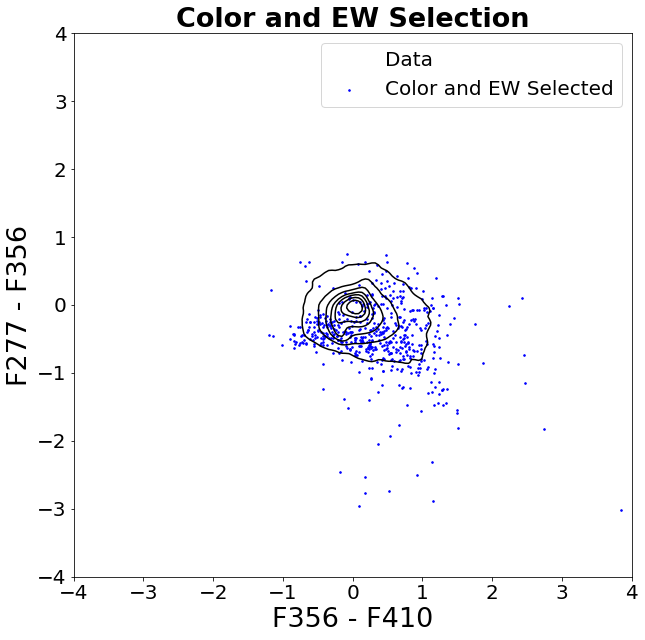

In [105]:
plt.rcParams['figure.figsize'] = (10, 10)
#plt.scatter(df_col_new['F356 - F410'][msk],df_col_new['F277 - F356'][msk], s = 1,  color = 'k')

xs = df_col_new['F356 - F410'][msk]
ys = df_col_new['F277 - F356'][msk]

dat =  pd.DataFrame({'F356 - F410':xs.values, 'F277 - F356':ys.values})
sns.kdeplot(data = dat, x = 'F356 - F410', y = 'F277 - F356',  fill = False,  label = 'Data', 
            levels = 8, color = 'k')



#big = big_data_col['F410 - F444'][msk][bool_mask]

#plt.scatter(df_col_new['F356 - F410'][msk][bool_mask],df_col_new['F277 - F356'][msk][bool_mask], 
#            s = 1,  color = 'red')

ewmin = 5000
ew_bool = np.array(ews[0])>ewmin 
tot = len(df_col_new['F356 - F410'][msk][bool_mask][ew_bool])
plt.scatter(df_col_new['F356 - F410'][msk][bool_mask][ew_bool],
            df_col_new['F277 - F356'][msk][bool_mask][ew_bool], 
            s = 10,  color = 'b', marker = '.', label = 'Color and EW Selected')
#Add axes and titles
plt.xlim(-4,4)
plt.ylim(-4,4)
plt.xlabel('F356 - F410')
plt.ylabel('F277 - F356')
plt.title('Color and EW Selection')

#plt.title(f'All Pointings, Color Selection from Paper \n EW > {ewmin}, {tot} Sources Selected ')
plt.legend();

The detector edsge and nearby source cut:

In [106]:
ew_remain = df_new[msk][bool_mask][ew_bool]
p1 = df_new['Pointing'] == 1
dpoint1 = df_new[p1]
print(len(dpoint1), 'Source in pointing 1')

p2 = df_new['Pointing'] == 2
dpoint2 = df_new[p2]
print(len(dpoint2), 'Source in pointing 2')

p3 = df_new['Pointing'] == 3
dpoint3 = df_new[p3]
print(len(dpoint3), 'Source in pointing 3')

p4 = df_new['Pointing'] == 4
dpoint4 = df_new[p4]
print(len(dpoint4), 'Source in pointing 4')

p5 = df_new['Pointing'] == 5
dpoint5 = df_new[p5]
print(len(dpoint5), 'Source in pointing 5')

p6 = df_new['Pointing'] == 6
dpoint6 = df_new[p6]
print(len(dpoint6), 'Source in pointing 6')

p7 = df_new['Pointing'] == 7
dpoint7 = df_new[p7]
print(len(dpoint7), 'Source in pointing 7')

p8 = df_new['Pointing'] == 8
dpoint8 = df_new[p8]
print(len(dpoint8), 'Source in pointing 8')

p9 = df_new['Pointing'] == 9
dpoint9 = df_new[p9]
print(len(dpoint9), 'Source in pointing 9')

p10 = df_new['Pointing'] == 10
dpoint10 = df_new[p10]
print(len(dpoint10), 'Source in pointing 10')

p1 = ew_remain['Pointing'] == 1
point1 = ew_remain[p1]
print(len(point1), 'Source in pointing 1')

p2 = ew_remain['Pointing'] == 2
point2 = ew_remain[p2]
print(len(point2), 'Source in pointing 2')

p3 = ew_remain['Pointing'] == 3
point3 = ew_remain[p3]
print(len(point3), 'Source in pointing 3')

p4 = ew_remain['Pointing'] == 4
point4 = ew_remain[p4]
print(len(point4), 'Source in pointing 4')

p5 = ew_remain['Pointing'] == 5
point5 = ew_remain[p5]
print(len(point5), 'Source in pointing 5')

p6 = ew_remain['Pointing'] == 6
point6 = ew_remain[p6]
print(len(point6), 'Source in pointing 6')

p7 = ew_remain['Pointing'] == 7
point7 = ew_remain[p7]
print(len(point7), 'Source in pointing 7')

p8 = ew_remain['Pointing'] == 8
point8 = ew_remain[p8]
print(len(point8), 'Source in pointing 8')

p9 = ew_remain['Pointing'] == 9
point9 = ew_remain[p9]
print(len(point9), 'Source in pointing 9')

p10 = ew_remain['Pointing'] == 10
point10 = ew_remain[p10]
print(len(point10), 'Source in pointing 10')

10738 Source in pointing 1
10181 Source in pointing 2
11185 Source in pointing 3
10496 Source in pointing 4
9185 Source in pointing 5
11600 Source in pointing 6
10466 Source in pointing 7
10029 Source in pointing 8
9394 Source in pointing 9
8534 Source in pointing 10
66 Source in pointing 1
49 Source in pointing 2
54 Source in pointing 3
81 Source in pointing 4
31 Source in pointing 5
61 Source in pointing 6
42 Source in pointing 7
61 Source in pointing 8
40 Source in pointing 9
46 Source in pointing 10


,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,PHOTOM_RED_SHIFT,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277
0,214.945150,52.976893,2,6.876287,4.644468,5.745175,12.576024,8.918044,11.296003,2.910118,...,4.87,18.151505,"[18.151505199138825, 18.30464457448352, 18.414...","[4.869999999999996, 4.899999999999996, 0.61000...",1.743,1.369,0.70,5.47,1890.768670,5133.260453
1,214.948019,52.977387,2,40.468047,35.267163,42.683652,79.978971,52.432502,26.553881,31.457395,...,4.66,14.303806,"[14.303805526872146, 14.35816643907079, 14.420...","[4.659999999999994, 4.599999999999993, 4.62999...",3.962,2.245,4.33,4.72,NaN,9444.594505
2,214.948392,52.975951,2,27.685415,24.395622,23.526240,59.577211,37.842881,25.015032,25.623294,...,4.66,13.309420,"[13.309420017015498, 13.327134733518477, 13.36...","[4.659999999999994, 4.629999999999994, 4.26999...",3.851,2.529,4.12,4.69,439.041655,9728.136856
3,214.954740,52.980704,2,-0.698335,-2.915082,0.696559,5.862714,10.022972,13.820296,4.323219,...,19.99,10.889903,"[10.889902545286517, 10.901553745821987, 10.91...","[19.990000000000002, 19.96, 19.93, 19.9, 19.86...",1.459,1.231,4.12,19.33,26604.576056,13666.206962
4,214.924429,52.957731,2,64.116372,61.325985,82.132600,158.997360,109.535344,66.077053,66.036033,...,0.58,27.104851,"[27.104851409523935, 27.18953925465909, 27.322...","[0.5800000000000003, 0.6100000000000003, 0.640...",4.059,2.745,0.55,0.64,NaN,7828.324722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,214.885355,52.783374,1,21.176288,28.461999,32.591149,67.346989,35.451040,21.721608,15.989244,...,0.52,27.018444,"[27.01844351834823, 27.8443148817871, 28.41435...","[0.5200000000000002, 0.4900000000000002, 0.460...",2.673,2.189,0.49,4.33,328.263180,6690.433157
467,214.859825,52.764025,1,1.658025,3.508157,2.870889,9.301482,5.169531,8.116938,7.062503,...,16.00,10.442196,"[10.442196493819548, 10.443778169870054, 10.44...","[15.99999999999985, 16.029999999999852, 15.969...",1.161,0.869,11.47,17.41,5329.331977,6824.044392
468,214.884269,52.781259,1,32.581710,38.039143,23.228427,68.886098,47.415709,70.887890,31.920860,...,4.93,18.789398,"[18.789397795019056, 18.951760856334882, 20.45...","[4.929999999999996, 4.899999999999996, 4.95999...",2.627,2.267,4.90,5.02,942.027143,9258.682372
469,214.875497,52.773130,1,11.844572,19.393734,14.444475,40.619241,24.589348,40.681511,16.975843,...,5.08,25.979424,"[25.979423982370857, 26.02824702267938, 26.087...","[5.079999999999997, 5.109999999999998, 5.13999...",2.367,1.845,4.51,5.17,5072.359875,7887.077205


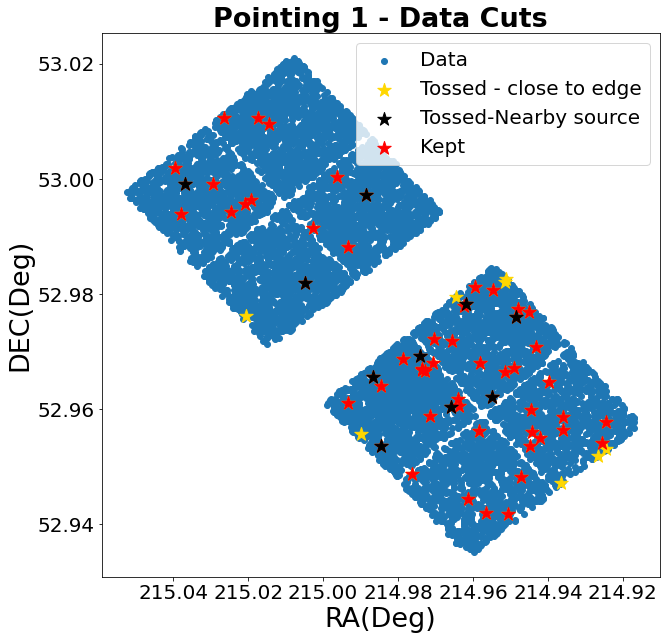

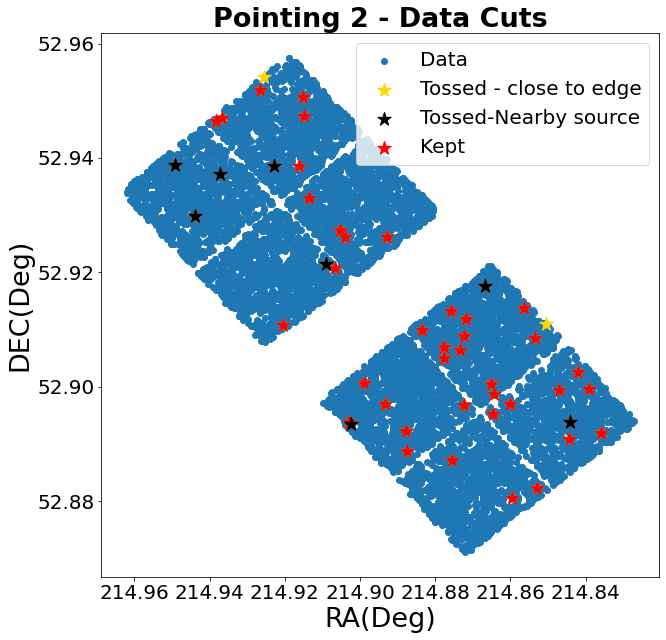

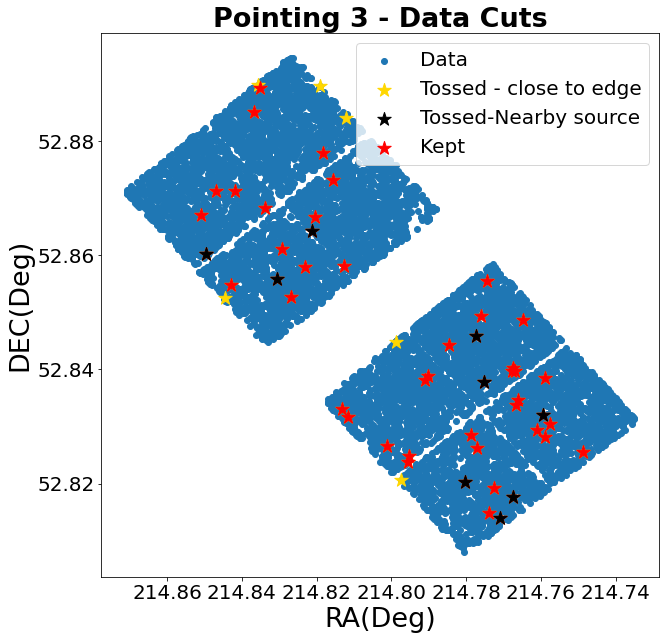

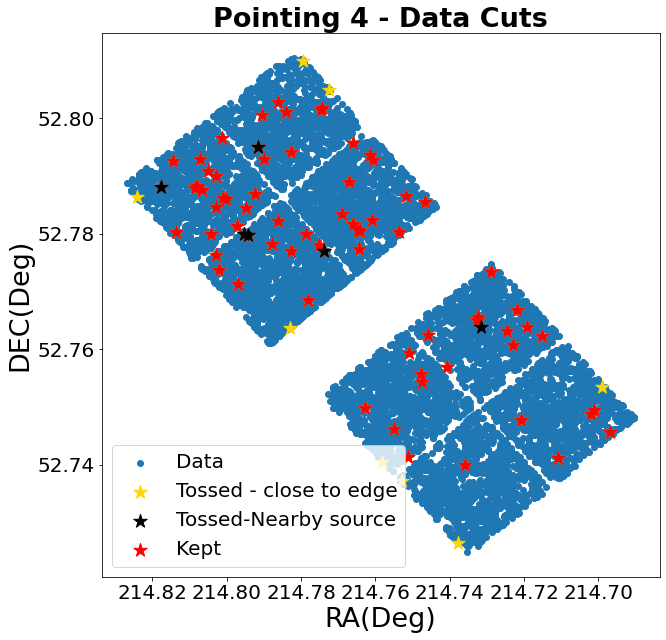

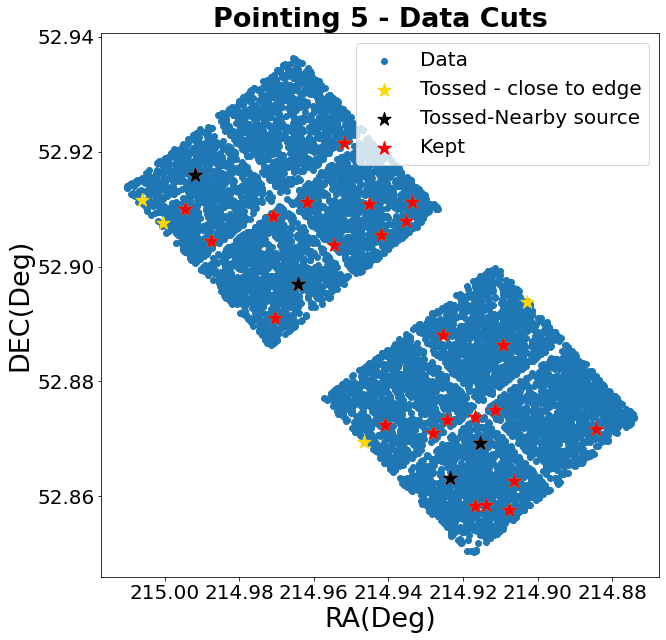

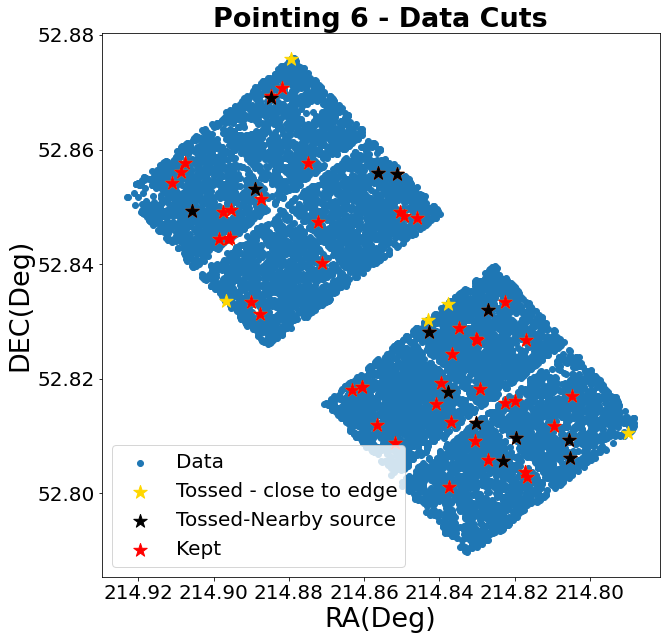

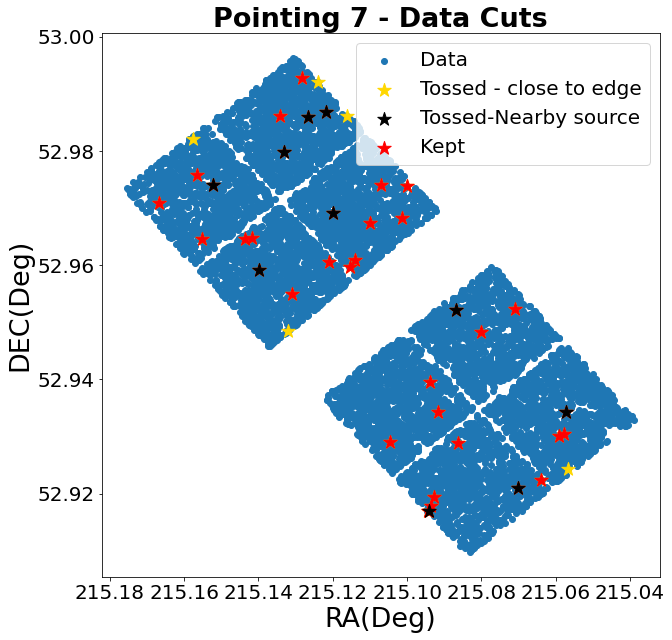

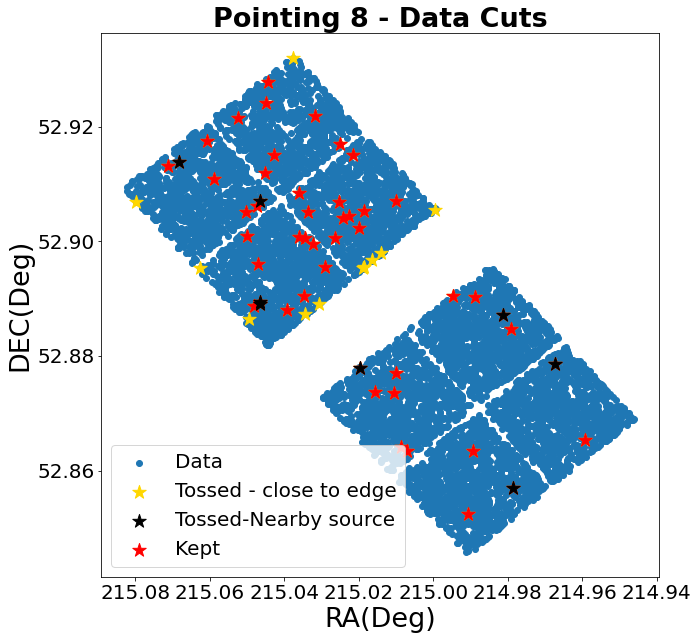

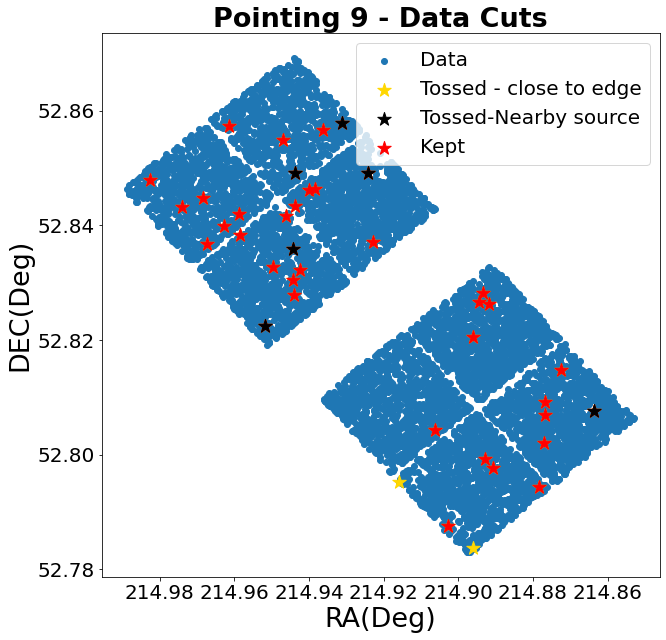

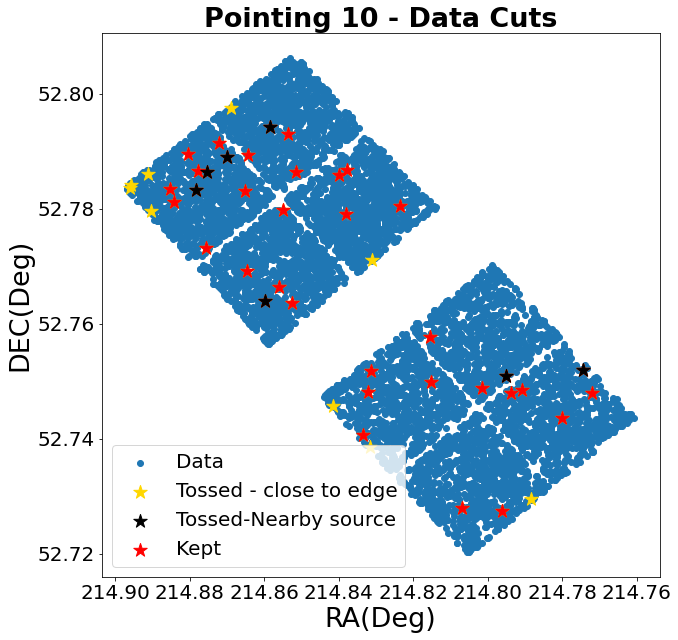

In [107]:
cut1 = cut_sides(dpoint1, point1, 1)

cut2 = cut_sides(dpoint2, point2, 2)

cut3 = cut_sides(dpoint3, point3, 3)

cut4= cut_sides(dpoint4, point4, 4)

cut5 = cut_sides(dpoint5, point5, 5)

cut6 = cut_sides(dpoint6, point6, 6)

cut7 = cut_sides(dpoint7, point7, 7)

cut8 = cut_sides(dpoint8, point8, 8)

cut9 = cut_sides(dpoint9, point9, 9)

cut10 = cut_sides(dpoint10, point10, 10)

post_cuts = pd.concat([cut1, cut2, cut3, cut4, cut5, cut6, cut7, cut8, cut9, cut10],ignore_index=True)
post_cuts

In [108]:
Area1 = post_cuts['F356']-post_cuts['F410']>0
Area2 = post_cuts['F356']-post_cuts['F410']<0

area1 = post_cuts[Area1]
area2 = post_cuts[Area2]

area1['Area'] = np.repeat('Top', len(area1))
area2['Area'] = np.repeat('Bottom', len(area2))
post_cuts = pd.concat([area1, area2], ignore_index = True)
post_cuts

<ipython-input-108-7d6405a04d84>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  area1['Area'] = np.repeat('Top', len(area1))
<ipython-input-108-7d6405a04d84>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  area2['Area'] = np.repeat('Bottom', len(area2))


,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,A,B,ze_lower,ze_upper,EW,EW277,Area
0,214.948019,52.977387,2,40.468047,35.267163,42.683652,79.978971,52.432502,26.553881,31.457395,...,14.303806,"[14.303805526872146, 14.35816643907079, 14.420...","[4.659999999999994, 4.599999999999993, 4.62999...",3.962,2.245,4.33,4.72,NaN,9444.594505,Top
1,214.948392,52.975951,2,27.685415,24.395622,23.526240,59.577211,37.842881,25.015032,25.623294,...,13.309420,"[13.309420017015498, 13.327134733518477, 13.36...","[4.659999999999994, 4.629999999999994, 4.26999...",3.851,2.529,4.12,4.69,439.041655,9728.136856,Top
2,214.924429,52.957731,2,64.116372,61.325985,82.132600,158.997360,109.535344,66.077053,66.036033,...,27.104851,"[27.104851409523935, 27.18953925465909, 27.322...","[0.5800000000000003, 0.6100000000000003, 0.640...",4.059,2.745,0.55,0.64,NaN,7828.324722,Top
3,214.959393,52.981163,2,7.394661,6.500952,9.486764,28.825235,13.336397,13.107183,8.210391,...,28.078203,"[28.078202523796275, 28.317804951881442, 28.75...","[0.5500000000000003, 0.5800000000000003, 15.87...",2.229,1.751,0.70,16.18,1317.329924,10422.330457,Top
4,214.925432,52.954103,2,43.032831,40.688139,42.868019,82.019807,57.054431,43.389679,41.432116,...,26.872383,"[26.872383293522773, 26.966200759522724, 27.13...","[4.749999999999995, 4.779999999999995, 4.71999...",2.882,2.473,4.60,4.81,NaN,6368.356329,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,214.852409,52.763565,1,12.465038,8.482618,6.929342,16.234747,5.175934,17.133993,8.436254,...,28.018222,"[28.01822234841034, 28.198148930927893, 28.686...","[5.169999999999998, 5.139999999999998, 5.19999...",1.464,1.368,5.11,5.20,3709.670858,5122.654738,Bottom
467,214.859825,52.764025,1,1.658025,3.508157,2.870889,9.301482,5.169531,8.116938,7.062503,...,10.442196,"[10.442196493819548, 10.443778169870054, 10.44...","[15.99999999999985, 16.029999999999852, 15.969...",1.161,0.869,11.47,17.41,5329.331977,6824.044392,Bottom
468,214.884269,52.781259,1,32.581710,38.039143,23.228427,68.886098,47.415709,70.887890,31.920860,...,18.789398,"[18.789397795019056, 18.951760856334882, 20.45...","[4.929999999999996, 4.899999999999996, 4.95999...",2.627,2.267,4.90,5.02,942.027143,9258.682372,Bottom
469,214.875497,52.773130,1,11.844572,19.393734,14.444475,40.619241,24.589348,40.681511,16.975843,...,25.979424,"[25.979423982370857, 26.02824702267938, 26.087...","[5.079999999999997, 5.109999999999998, 5.13999...",2.367,1.845,4.51,5.17,5072.359875,7887.077205,Bottom


In [127]:
blue_cuts = post_cuts#[post_cuts['F356']<1e3]

In [125]:
dv = blue_cuts
fs = []
fs_strings = []
a=dv.index[0]
c=0


fs = []
fs_strings = []

for key in dv.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=11
stop2 = 19
f_final = []
for f in fs:
    f_final.append(f)


min_obs = 5
filter_strings = blue_cuts.keys()[start:stop]
error_strings = blue_cuts.keys()[stop:stop2]
keep = []
for ind in blue_cuts.index:
    fvals = []
    evals = []
    dat = blue_cuts.loc[ind]
    for s in range(len(filter_strings)):
        fvals.append(dat[filter_strings[s]])
        evals.append(dat[error_strings[s]])
    hits = (np.array(fvals)>3*np.array(evals) )#& (np.array(fvals) >0) &(np.array(evals) >0)
    hit_count = np.count_nonzero(hits)
    if hit_count > min_obs:
        toss = 0
        mn = np.min(np.array(fvals)[hits])
        mx = np.max(np.array(fvals)[hits])
        if mn<10:
            toss+=1
        #if mx >700:
         #   toss+=1
        #for val in  np.array(fvals)[hits]:
         #   if val < 10:
          #      toss +=1
           # elif val >500:
            #    toss+=1
        if toss == 0:
            keep.append(ind)

#blue_cuts.loc[keep]

In [126]:
eelgs277 = blue_cuts.loc[keep]
#eelgs277

Combining the two selection methods:

In [123]:
boolvals = []
for obj in np.array(eelgs277['Object'].values):
    if obj in np.array(eelgs['Object'].values):
        boolvals.append(False)
    else:
        boolvals.append(True)
#eelgs277[boolvals]

In [124]:
all_eelgs = pd.concat([eelgs, eelgs277[boolvals]], ignore_index = True)

We read in the selection file we used for our paper (included in the GitHub repo)

In [146]:
all_eelgs = pd.read_pickle('eelgs_updated_photom.pkl')
all_eelgs

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Former_Names,X,Y,PHOTOM_RED_SHIFT,Min_Chi2,Lowest_Chi2,Lowest_Chi2_Z,EW,EW_lists,Area
0,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,22.103577,...,857,2451.009033,4141.298828,4.51,4.098303,"[4.098303070497878, 4.134248692035703, 4.20455...","[4.509999999999993, 4.479999999999992, 4.44999...",5667.584823,"[5667.584823018489, nan, 925.4431485620587]",Top
1,215.007727,53.016718,1,167.029639,216.001733,191.770087,204.920793,215.822859,200.348072,428.196307,...,881,587.694580,4106.119141,7.99,11.038461,"[11.038460869407272, 11.082019097142302, 11.12...","[7.9900000000000215, 8.020000000000021, 7.9600...",11453.681442,"[508.08320515999594, nan, 11453.681441537488]",Top
2,214.955178,52.977106,2,19.974514,20.409648,37.135036,31.856192,27.524009,16.108483,37.392213,...,1342,6667.402832,3912.887695,0.37,8.730390,"[8.730390345062762, 8.881146221394097, 9.25894...","[0.3700000000000001, 0.40000000000000013, 0.43...",5136.986456,"[808.8095667500033, nan, 5136.986456465604]",Top
3,214.960089,52.976177,2,22.796074,19.256812,28.210308,38.804125,67.169046,17.841594,48.336049,...,2076,6522.270996,3570.450195,6.49,42.937120,"[42.93712037091798, 43.000218767801655, 43.023...","[6.490000000000009, 6.520000000000009, 6.46000...",8853.882656,"[8853.882655855128, nan, 5509.46952363609]",Top
4,214.956834,52.973154,2,27.300727,24.687040,31.275358,36.869192,103.626192,92.891501,184.974565,...,2194,6950.971191,3514.365479,6.40,15.947264,"[15.947263874410254, 15.976409517188713, 16.07...","[6.400000000000008, 6.370000000000008, 6.43000...",27267.050555,"[8159.255145738, 3648.1259941242606, 27267.050...",Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1134,214.840283,52.783318,1,16.562073,13.927856,26.674422,41.476971,20.137589,24.086450,26.476373,...,-1,2888.727051,3309.474609,3.49,13.845345,"[13.845345012480701, 13.91765637238199, 14.056...","[3.4899999999999918, 3.5199999999999916, 3.549...",1665.822201,"[nan, 249.6961187225027, 1665.8222013085553]",Bottom
1135,214.864177,52.789303,1,28.336660,24.993670,25.305025,49.764127,26.755863,31.865783,21.547552,...,-1,1219.063965,2452.050049,0.55,14.919544,"[14.919544298336708, 15.185738251870147, 16.08...","[0.5500000000000003, 0.5800000000000003, 0.610...",704.335489,"[nan, 704.3354891073047, nan]",Bottom
1136,214.872190,52.791455,1,16.979599,13.889222,16.084904,39.790016,10.540274,32.591156,15.934043,...,-1,645.806213,2175.943848,5.17,53.003496,"[53.00349616277501, 53.058211977303216, 53.874...","[5.169999999999998, 5.139999999999998, 5.10999...",4699.620274,"[nan, 4699.6202740873405, 138.82026905827726]",Bottom
1137,214.867546,52.782031,1,22.699025,22.756328,21.484736,42.004555,24.563556,37.689875,18.435348,...,-1,1725.972900,1700.874146,4.90,14.305626,"[14.305625570466166, 15.002471156489353, 18.08...","[4.899999999999996, 4.929999999999996, 4.95999...",2836.396885,"[576.1739856428613, 2836.3968850781216, nan]",Bottom


# String Identification

We then classify the remaining EELG candidates by eye. I'll print here just the first 5 SEDs, but the true version of this code involves printing each of the remaining SEDs for classification.

<a class="anchor" id="strings"></a>

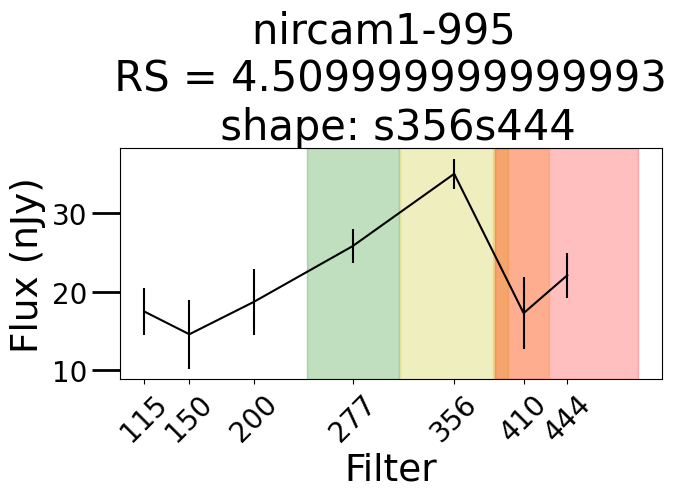

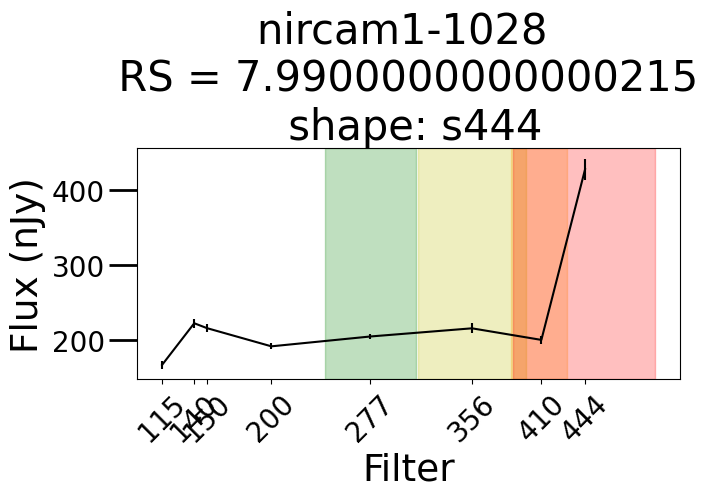

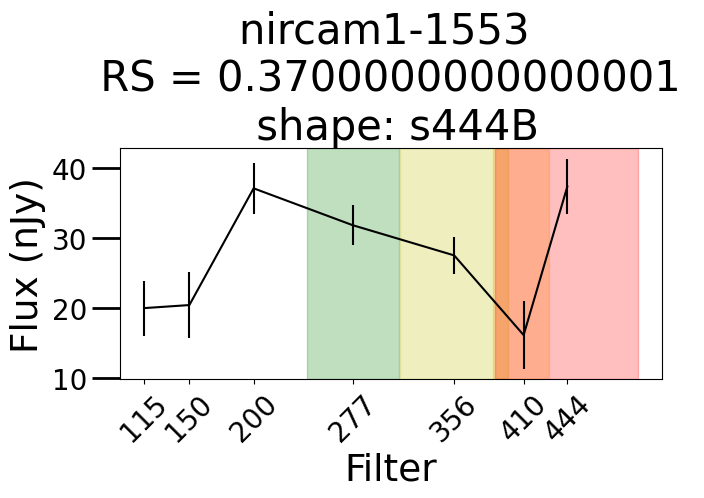

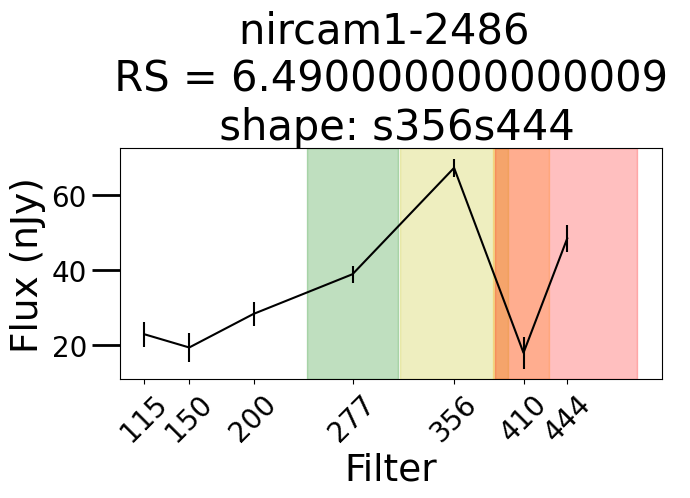

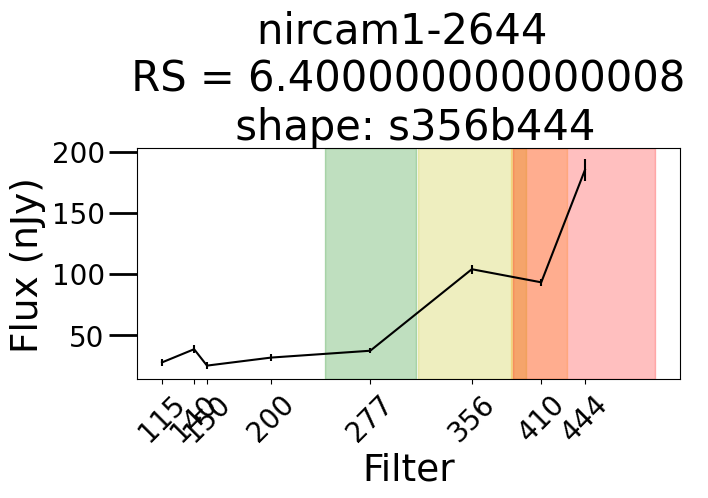

<Figure size 700x300 with 0 Axes>

In [147]:
plt.rcParams['figure.figsize'] = (7, 3)
#plot_sources(remaining['Object'], remaining, df_col6, 6)
df = all_eelgs
sources = all_eelgs['Object']
#plt.rcParams['figure.figsize'] = (20, 10)
#Grab filters from DataFrame
fs = []
fs_strings = []
a=df.index[0]
c=0

fs = []
fs_strings = []

for key in df.loc[a][3:11].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=11
stop2 = 19
f_final = []
for f in fs:
    f_final.append(f)

#Create a colormap 

#colormap = plt.cm.gist_ncar
#colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]

#Create an SED for each of the sources
i=0
n=-1
for obj in sources[0:5]:
    #Increase the iteration tracker, grab the DataFrame for just this object
    n+=1
    #print(shapes[i])
    mk = np.array(df['Object']) == np.array(obj)
    a = df[mk]
    #Get the redshift and filters
    rs = a['PHOTOM_RED_SHIFT'].values
    filters = np.array(a.keys()[start:stop].values)
    filter_er = np.array(a.keys()[stop:stop2].values)
    #Mask the data so all filter values are greater than 3 times their error
    mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
    #Sort the data so the SED plot connects from left to right, regardless of filter input order
    z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
    x=[i[0] for i in z]
    y=[i[1] for i in z]
    plt.errorbar(x,y,a[filter_er].values[0][mask], label = f'Redshift = {rs}, {obj}',
                color = 'k')
        #Add the x ticks
    plt.xticks(np.array(f_final)[mask])





    #Add 277, 356, 410, and 444 filters
    plt.axvspan(314, 398, label= 'F356', color = 'y', alpha = .25)
    plt.axvspan(386.4, 430.1, label= 'F410', alpha = 0.25, color = 'orange')
    plt.axvspan(388, 498.6, label= 'F444', color = 'r', alpha = .25)
    plt.axvspan(241.6, 312.7, label= 'F277', color = 'g', alpha = .25)
    #Add titles and labels
    plt.title(f'{obj} \n RS = {rs[0]} \n shape: {shapes[n]}')
    plt.ylabel('Flux (nJy)')
   # plt.yscale("log")
    plt.xlabel('Filter')
    plt.xticks(rotation = 45)
    #plt.legend()
    plt.tick_params('y', length=20, width=2, which='major')
    plt.tick_params('y', length=10, width=1, which='minor')
    i+=1
    plt.show()
    plt.close()
    plt.figure();

We can call our function for the emission line road map to get an idea of what lines we should expect in what filters for a given redshift.

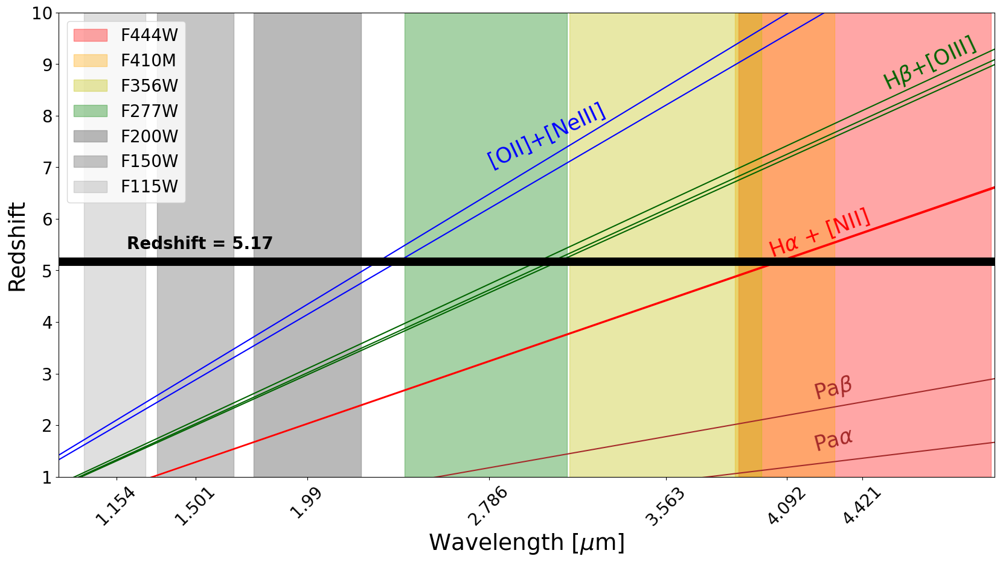

In [148]:
jon_plot(5.17)

We record string identifiers for each EELG candidate. They have the form of 's' for spike followed by an integer representing the filter for the spike. A shape of 'I'is an imaging artifact and a shape of 'Irg' is a red galaxy with emission lines, not an extreme emission line galaxy.

In [149]:
shapes = ['s356s444', 's444', 's444B', 's356s444', 's356b444', 's444', 's356b444', 's444B', 's277', 'Irg',
         's277', 's444', 's444B', 's277', 's444', 's356s444', 's277s356s444', 's356s444', 's444', 's444',
         's444', 's444', 's356s444', 's444', 's444', 's356s444', 's356b444', 's356b444', 's444B', 's356s444',
         's444B', 's356', 's444B', 's356s444', 's356b444', 's356s444', 'Irg', 's277s356', 's356s444', 's277',
         's444', 's444', 's277s356', 's356', 's356', 's356s444', 's356B', 's444', 's356s444', 's356B', 's356',
         's356s444', 's444', 's356s444', 's356', 's356s444', 's444B', 's356s444', 's356B', 's356B', 's356s444',
         's356s444', 's356s444', 's356s444', 's356', 's356B', 's356s444', 's356s444', 's356B', 's356s444',
         's356s444', 's356s444', 's356s444B', 's356s444', 's356s444', 'Irg', 's356s444', 's356s444',
         's356B', 's444', 's356s444', 's356s444', 's356', 's356s444', 's356s444', 's356s444', 'I',
         's444', 's356s444', 's356s444', 's356b444', 's356s444', 's356', 's277s444', 's356s444',
         's356s444', 's356s444', 's356s444', 's356s444', 's356s444', 's444B', 's444', 's356s444',
         's444', 's356s444', 's444', 's277', 's277s356B', 's277', 's356B', 's356s444', 's356s444', 's356s444',
         's356s444', 's356s444', 's356', 's444', 's356s444', 's356s444', 's444', 's356s444', 's356s444',
         's356s444', 's356s444', 's356s444B', 's277s356B', 's356s444', 's356', 's356s444', 's356s444', 's356s444',
         's356s444B', 'Irg', 's356s444B', 's277s356s444', 's356s444', 's356s444', 's356s444', 's356B', 's356s444',
         's356B', 's356s444', 's356s444', 's356s444B', 's444', 's356s444', 's277s444', 's444', 's356s444',
         's356s444', 's444', 's356s444', 's356s444', 's356s444', 's356s444', 's444', 's356s444B', 's356s444',
         's444', 's356b444', 's356s444', 's356s444', 's356s444B', 's356s444', 's356s444', 's356s444', 's356s444',
         's444B', 's356s444', 's356s444', 's444', 's356s444', 'Irg', 's277s444B', 's356s444', 's356s444', 
          's277s444', 's356s444', 's356s444B', 's356s444', 's356', 's356s444', 's356s444', 's277s356', 's356s444',
          's356s444', 's444', 's356s444', 's356B', 's356b444', 's356s444', 's356', 's356s444', 's356s444', 
          's356s444', 's444', 's444','s356s444', 's444', 's277s444', 's356s444', 's356s444', 's444', 's356s444',
          's356s444', 's356s444', 's356s444B', 's356s444', 's356s444', 'Irg', 's356s444', 's356s444', 's356', 
          's356s444', 's356s444', 's356s444', 's356s444', 's356', 's356s444B', 'Irg', 's356s444', 's277', 's277',
          's356s410', 's356s444', 's356s444', 's444', 's444', 's356s444', 's356s444', 's356s444', 's356s444',
          's444', 's356s444', 's277', 's356s444', 's444', 's356s444', 's356s444', 's356s444', 's356s444', 's356s444',
          's356s444B', 's356s444', 's356s444', 's356b444', 's356s444', 's356s444', 's356s444B', 's444B', 's356s444',
          's356s444', 's356s444', 's356s444', 's444B', 's444B', 's356s444', 's356s444', 's356s444', 's356', 
          's356s444', 's444B', 's277s444', 's356s444', 's356s444', 's356b444', 's444', 's356s444B', 's356s444',
          's277', 's356s444', 's356s444', 's356s444', 's444', 's444', 's356s444', 's356', 's356s444B', 's356s444',
          's444', 's356s444', 's277s444', 's356s444', 's356s444', 's356s444', 's444', 's356s444', 's356s444B',
          's356b444', 's356s444B', 's356s444', 's356s444', 's444', 's277s444', 's356s444', 's356s444', 's444B',
          's277s444', 's277', 's356s444', 's356s444B', 's356s444', 's356s444', 's356s444', 's356s444', 's356s444',
          's356s444', 's356s444', 's444B', 's356s444', 's356s444', 's277', 's277s356', 's356s444', 's356s444', 
          's356s444', 's356s444', 's356s444B', 's356s444', 's444', 'Irg', 's356s444', 's444', 's356s444', 's356s444',
          's356s410', 's356', 's356s444', 's356s444', 's356', 's356s444', 's356s444', 's356s444', 'Irg', 's356s444',
          's356s444B', 's444', 's410', 's410s444', 's410', 's410', 's277s410', 's277s410', 's410', 's277s410',
          's277b410', 's277b410', 's356b444', 's444', 's410', 'I', 's410B', 's410B', 's410B', 's277s410', 's410',
          's410', 's410', 's277s410', 's410', 's277s410', 's410', 's410', 's410', 's410s444', 's410', 's277s410',
          's410', 's410B', 's410B', 's410', 's410B', 's277s410', 's410', 's277b410', 's410', 's277s410', 
          's277s444B', 's444B', 's410', 's277b410', 's444', 's356s410', 's444', 's277s410B', 's410', 's410', 's410',
          's356b444', 's444', 's410B', 's410', 's410', 'Irg', 's410', 's410', 's444', 's410B', 's277s410', 
          's277s410', 's410', 's444', 's410', 's277s410', 's410', 's444', 's410', 's410B', 's410B', 's410',
          's410', 's410', 's410', 's410', 's410', 's410', 's410', 's277b410', 's356b444', 's444', 's444', 
          's410s444', 's410', 's410', 's277b410', 's444', 's410s444B', 's277s410', 's410', 's277b410',
          's410', 's410B', 's410', 's277s410B', 's277s410', 's444', 's277s410', 's410', 's277s410s444', 's410',
          's410', 's444', 's444', 's410B', 's410', 's410B', 's410', 's410', 'I', 's444', 's444', 's410', 's277s444',
          's277s410', 's410', 's277b410', 's410', 's410', 's410', 's444', 's277s410', 's410', 's410','s410s444',
          's277s410s444', 'I', 's356s410', 's410s444B', 's277s444', 's410', 's277s410', 's277s410', 's444B', 
          's277s410', 's444', 's410B', 's444', 's277s410', 's444B', 's277s410', 's277s410', 's444B', 's410', 'I',
          's356s410', 's277s410s444', 's277s410', 's277s410', 's277s410', 's356s410', 's277s410', 's277s410',
          's410B', 's410', 's410', 's277s410', 's356s410', 's277s410', 's277s410', 's444', 's410', 's444', 's410',
          's410', 's410', 's410', 's277s410B', 's277s410', 's410', 's444', 's410', 's410B', 's410B', 's277s410',
          's410B', 's444', 's277s410', 's277s410', 's410', 's444', 'S410', 's410', 's410', 's410', 's410', 's410',
          's410', 's277s410', 's410', 's410', 's277s410', 's410', 's410', 'I', 's444', 's444', 's410', 's444',
          's410s444', 's410', 's410', 's277s410', 's277b410', 's444', 's444', 's410B', 's277s410', 's277s410',
          's277s410', 's410', 's277s410', 's277s444', 's410B', 's410', 's277s444', 's410', 's277s410', 's444',
          's444', 's444B', 's410', 's410B', 's410', 's356s410', 's410','s277s444', 's444', 's444', 's444', 's410',
          's277s410', 's410', 's277s410', 's410', 's410', 's410B', 's444', 's410B', 's410B', 'I', 's277b410',
          's277b410', 's410', 'I', 's277s410', 's444', 's410', 's444', 's444B', 'Irg', 's444', 's410B','s410',
          's277s410', 's277s410', 's410B', 's410', 's444', 's410', 's410', 's410B', 's410B', 's444B', 's410',
          's410', 's277s444', 's410', 's410', 's410', 's410B', 's277s410', 's277s410', 's277s410', 's410', 
          's277s410', 's410', 's277s410', 's277s410', 's410', 's410', 's410B', 's277s410', 's277s410', 's277s444',
          's444B', 's444', 's277s410', 's444', 's277s410', 's356s410', 's277s410', 's444', 's444', 's277b410',
          's410', 's444', 's444B', 's410', 's444', 's410B', 's410s444', 's277s444', 's410B', 's410', 's410',
          's444', 's410', 's410B', 's277s410', 's410', 's410', 's410B', 's410B', 's410B', 's410B', 's410B', 's410B',
          's356s410', 's444B', 's356s410', 's410', 's410', 's356s410', 's444B', 's410', 's277s410', 's410', 's410',
          's277s410', 's410B', 's277s410', 's277s410B', 's410B', 's410B', 's356s410', 's410', 's277s410', 's277',
          's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277s444', 's277', 's277', 's277', 's277',
          's277s444', 's277', 's277B', 's277', 's277s444B', 's277', 's277', 's277', 's277', 's277', 's277', 's277',
          's277B', 's277', 's277', 's277', 's277', 's277s444', 's277B', 's277B', 's277', 's277', 's277', 's277',
          's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277', 's277s444B',
          's277B', 's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 'Irg', 's277', 's277', 'Irg',
          's277B', 's277', 's277', 's277', 's277', 's277B', 's277', 'Irg', 's277', 's277', 'Irg', 's277', 's277',
          's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 'Irg', 's277', 's277', 's277', 's277',
          's277', 's277', 's277', 's277B', 's277', 's277B', 's277', 's277', 's277', 's277', 's277', 's277',
          's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277',
          's277s356', 's277', 's277', 's277', 's277', 's356s444','s277', 's277', 's277', 's277', 's277B', 's277',
          's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277', 's277', 's277',
          'Irg', 's277', 's277', 's277', 's277', 's277', 's277s356', 's277', 's277', 's277', 's277', 's277s444',
          's277s444', 's356b444', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B',
          's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277', 's277',
          's277', 's277', 's277B', 's277B', 's277', 's277B', 's277', 's277', 's277', 's277', 's277', 's277', 
          's277B', 's277', 's277', 's277', 's277B', 's277B', 's277', 's277B', 's277B', 's277', 's277',
          's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277B', 's277B', 's277', 's277',
          's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B',
          's277', 's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277s444', 's277', 's277B', 's277',
          's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277', 's277B', 's277', 's277B', 's277', 's277',
          's277B', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B', 's277',
          's277', 's277', 's277', 's277', 's277B', 'Irg', 's277', 's277B', 's277', 's277', 's277', 'Irg', 's277',
          's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277B',
          's277', 's277', 's277', 's277', 's277', 's277B', 's277', 's277', 's277', 's277', 's277B', 's277', 's277',
          's277', 's277s444', 's277', 's277B', 's277', 's277', 's277', 'Irg', 's277', 's277', 'Irg', 's277', 's277',
          's277', 's277s444', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 's277', 
          's277s444', 'Irg', 's277', 's277', 's277', 's277', 's277', 'Irg', 's277', 's277s410', 's277s410B', 
          's277s410', 's277s410B', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410B',
          's277s410', 's277s410', 's277s410', 's277s410B', 's277s410', 's277s410B', 's277s410', 's277s410',
          'Irg', 's277', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410B', 'Irg', 
          's277s410', 's277s410', 's277s410', 's277s410', 's277s410B', 's277s410', 's277s410', 's277s410', 'Irg',
          'Irg', 'Irg', 's277', 's277s410B', 's444', 's277', 's277s410B', 's277s410', 's277s444', 's277',
          's277s410', 's277s410', 's277s410', 's277B', 's277s410B', 's277s410', 's277s410', 's277B', 's27B',
          's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410B', 's444',
          's444', 's277B', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277B', 
          's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 
          's277s410', 's277s410', 'Irg', 's277s410', 's277B', 's277s410', 's277s410', 's277s410', 's277',
          's277s410', 's277s410B', 's277s410', 's444', 's444', 's277s410', 's277s410', 's277s410', 's277',
          's444', 's277s410B', 's277s410', 's277s410', 's277s410B', 's277s410', 's277s410','s277s410',
          's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277s410', 's277B', 
          's444', 's277s410', 'Irg', 's277s410B', 's277s410', 's277', 's277s410', 's277B', 's277', 's277',
          's277', 's277B', 's277s410', 's277s410', 's277B'
          
          
         ]

In [150]:
all_eelgs['Shape'] = shapes

We can take a look at what each of the classifications look like by calling our plot_class function:

Fix this code:

In [163]:
classes = list(set(shapes))
for c in classes:
    plot_class(c, all_eelgs)

TypeError: '>' not supported between instances of 'float' and 'str'

# Part 2: Selection Analysis



now looking at the properties of the selection

<a class="anchor" id="props"></a>

In [173]:
#imports: combine this with the imports above

import astropy.units as u
import astropy.constants as c
from astropy.coordinates import SkyCoord, search_around_sky
from astropy.time import Time
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
#%matplotlib notebook
%matplotlib inline
from astropy.io import fits
from itertools import combinations
import pickle
from astropy.cosmology import WMAP9 as cosmo
import seaborn as sns
from astropy.table import Table

plt.rcParams['figure.figsize'] = (10, 10)
plt.rc('axes', labelsize=27)
#plt.rc('axes', labelweight='bold')
plt.rc('axes', titlesize=27)
plt.rc('axes', titleweight='bold')
plt.rc('font', family='sans-serif')
plt.rcParams.update({'font.size': 20})

Reading in the tables

all the CEERS data:

In [175]:
df_new = load_photometry("/home/kelcey/Downloads/CEERS_v0.51.2_photom.fits",
                    "/home/kelcey/Downloads/CEERS_v0.51.2_photz_quantities.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_chi2.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_zgrid.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_templates.fits",
                            ignore_HST = False)
df_new.keys()

Index(['RA', 'DEC', 'Region', 'F115', 'F150', 'F200', 'F277', 'F356', 'F410',
       'F444', 'F606', 'F814', 'F105', 'F125', 'F140', 'F160', 'F115_ERROR',
       'F150_ERROR', 'F200_ERROR', 'F277_ERROR', 'F356_ERROR', 'F410_ERROR',
       'F444_ERROR', 'F606_ERROR', 'F814_ERROR', 'F105_ERROR', 'F125_ERROR',
       'F140_ERROR', 'F160_ERROR', 'Pointing', 'Object', 'Former_Names', 'X',
       'Y', 'PHOTOM_RED_SHIFT', 'Min_Chi2', 'Lowest_Chi2', 'Lowest_Chi2_Z',
       'A', 'B', 'ze_lower', 'ze_upper'],
      dtype='object')

Our EELG selection from the previous part

In [176]:
artifactless = pd.read_pickle('finalfinaldata.pkl')
artifactless

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,Lowest_Chi2,Lowest_Chi2_Z,EW,EW277,Area,Shape,Spikes,Dust,Blue,Pure Shape
0,214.920073,52.958305,2,63.476854,64.187067,80.654493,155.818449,104.024284,63.002817,62.786032,...,"[34.28694121032506, 34.96740844656684, 35.0098...","[0.6400000000000003, 0.6100000000000003, 0.670...",3315.831904,7744.253128,Top,s277-nbc-nd,s277,nd,nbc,s277wz-nd
1,214.948019,52.977387,2,40.468047,35.267163,42.683652,79.978971,52.432502,26.553881,31.457395,...,"[14.303805526872146, 14.35816643907079, 14.420...","[4.659999999999994, 4.599999999999993, 4.62999...",2310.615676,6670.561603,Top,s277-bc-nd,s277,nd,bc,s277-nd
2,214.940366,52.970820,2,39.287647,30.916884,38.413252,82.691391,62.614552,36.037090,49.019772,...,"[6.519523822471699, 6.564936874860928, 6.61229...","[4.749999999999995, 4.719999999999994, 4.68999...",3039.150974,5699.981806,Top,s277-bc-nd,s277,nd,bc,s277-nd
3,214.948392,52.975951,2,27.685415,24.395622,23.526240,59.577211,37.842881,25.015032,25.623294,...,"[13.309420017015498, 13.327134733518477, 13.36...","[4.659999999999994, 4.629999999999994, 4.26999...",2997.080131,8049.009645,Top,s277-bc-nd,s277,nd,bc,s277-nd
4,214.923938,52.957912,2,87.525454,78.365270,73.491645,157.327402,93.869264,62.085379,61.808271,...,"[38.419920756178364, 38.57907760258965, 38.875...","[4.329999999999991, 4.299999999999991, 4.35999...",1812.135193,7273.343430,Top,s277-bc-nd,s277,nd,bc,s277-nd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2864,214.860360,52.766516,1,301.712633,406.754878,620.739974,493.858434,524.209737,743.739719,838.540180,...,"[33.722515886909, 34.222874296918604, 34.33298...","[3.3999999999999924, 3.309999999999993, 3.3699...",6582.769703,NaN,Bottom,s200s444-nbc-nd,s200s444,nd,nbc,s200s444-nd
2868,214.884269,52.781259,1,32.581710,38.039143,23.228427,68.886098,47.415709,70.887890,31.920860,...,"[18.789397795019056, 18.951760856334882, 20.45...","[4.929999999999996, 4.899999999999996, 4.95999...",3902.056464,5720.017018,Bottom,s277s410-bc-nd,s277s410,nd,bc,s277s410-nd
2870,214.809218,52.727329,2,44.012427,35.400553,34.093525,81.183518,41.871640,79.906216,52.719833,...,"[15.613249080057166, 15.665059160701636, 15.69...","[5.139999999999998, 5.169999999999998, 5.10999...",3665.523414,5916.419257,Bottom,s277s410-bc-nd,s277s410,nd,bc,s277s410-nd
2873,214.830286,52.741424,2,23.879905,21.904731,26.470735,26.073408,43.258973,84.605967,37.394704,...,"[40.19765005499998, 40.316456969661665, 41.252...","[6.940000000000013, 6.970000000000013, 6.91000...",8042.696830,NaN,Bottom,s410-bc-nd,s410,nd,bc,s410-nd


<a class="anchor" id="chi2"></a>

# $\chi^2$ cut to remove red galaxies


In [177]:
#CLASSIFICATION CODE
plt.rcParams['figure.figsize'] = (10, 5)
#plot_sources(remaining['Object'], remaining, df_col6, 6)
df = artifactless
sources = artifactless['Object']
#plt.rcParams['figure.figsize'] = (20, 10)
#Grab filters from DataFrame
fs = []
fs_strings = []
a=df.index[0]
c=0
wchivals = []
chivals = []

HST_filters = [140.0, 81.4, 60.6, 105.0, 125.0,  160.0]


fs = []
fs_strings = []

for key in df.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=16
stop2 = 29
f_final = []
for f in fs:
    if f>600:
        f_final.append(f*.1)
    else:
        f_final.append(f)

#Create a colormap 
#colormap = plt.cm.gist_ncar
#colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]
#Create an SED for each of the sources
i=0
n=0
for obj in sources:
    #Increase the iteration tracker, grab the DataFrame for just this object
    n+=1
    #print(shapes[i])
    mk = np.array(df['Object']) == np.array(obj)
    a = df[mk]
    #Get the redshift and filters
    rs = a['PHOTOM_RED_SHIFT']
    filters = np.array(a.keys()[start:stop].values)
    filter_er = np.array(a.keys()[stop:stop2].values)
    #Mask the data so all filter values are greater than 3 times their error
    mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
    #Sort the data so the SED plot connects from left to right, regardless of filter input order
    z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
    x=[i[0] for i in z]
    y=[i[1] for i in z]
           
    try:
        xstart = 200.0
        xend = 444.0
        ystart = y[-5]
        yend = y[-1]

        
            
        m = (yend-ystart)/(xend-xstart)
        b = yend-m*xend
        
        if m<0:
            chi2 = 1e2
            chivals.append(1e2)
        else:

            xmodel = np.array([200.0, 277.0, 356.0, 410.0, 444.0])
            ymodel = m*xmodel + b
            #plt.plot(xmodel,ymodel,c = 'b')

            datax = np.array([200.0, 277.0, 356.0, 410.0, 444.0])
            datay = y[-5:]
            dataerr = a[filter_er].values[0][mask][-5:]
            
            if datay[0]<datay[1]<datay[2]<datay[3]<datay[4]:
                fact = np.max(y)/10
                chi2 = 0
                for xi in range(len(datax)):
                    chi2+= ((ymodel[xi] - datay[xi])**2)/(fact*dataerr[xi]**2)
                chivals.append(chi2)
            else:
                chi2 = 1e2
                chivals.append(1e2)
        #print('ran')
    except:
        chi2 = 1e2
        chivals.append(1e2)
   # wchi = (1+float(rs))*chi2
    wchi = chi2
    wchivals.append(wchi)

    i+=1


chibool = np.array(chivals)>20

# Confidence tier assignments

<a class="anchor" id="tiers"></a>

In [178]:
shapes = artifactless['Pure Shape']
new_s = []
for s in shapes:
    if s == 's277wz-nd':
        new_s.append('s277-nd')
    elif s == 's277s356-nd':
        new_s.append('s277-nd')
    else:
        new_s.append(s)
artifactless['Pure Shape'] = new_s


tier_list = []

missed = []

iz = []

for obj in artifactless['Object']:
    dat = artifactless[artifactless['Object'] == obj]
    
    shape = dat['Pure Shape'].values[0]
    zph = dat['PHOTOM_RED_SHIFT'].values
    
    if shape == 's277-nd':
        if zph > 4:
            tier_list.append('1A')
            #iz.append(zph)
        else:
            tier_list.append('2A')
        iz.append([4,5.5])
    elif shape == 's277s410-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's277s356s410s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's410-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's277s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's356-nd':
        if zph>5.3:
            tier_list.append('1B')
           # iz.append(zph)
        else:
            tier_list.append('2B')
        iz.append([5.5,7])
            
    elif shape == 's410s444-nd':
        if (zph > 7.2) and (zph < 7.8):
            tier_list.append('1B')
           # iz.append(zph)
        else:
            tier_list.append('2B')
        iz.append([7.2,7.8])
        
    elif shape == 's356s444-nd':
        if zph > 5.5:
            tier_list.append('1A')
            #iz.append(zph)
        else:
            tier_list.append('2A')
        iz.append([5.6,7])
    elif shape == 's277s356s444-nd':
        if zph>5:
            tier_list.append('3A')
           # iz.append(zph)
        else:
            tier_list.append('3A')
        iz.append([5,5.5])
    elif shape == 's277s356-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's200s277s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's200-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's356s410s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
    
    elif shape == 's200s356s444-d':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape ==  's356s410-nd':
        if zph>6:
            tier_list.append('1B')
            #iz.append(zph)
        else:
            tier_list.append('2B')
        iz.append([6.6,6.8])
    elif shape == 's444-nd':
        if (zph>7.5) and (zph<9.5):
            tier_list.append('1B')
            #iz.append(zph)
        else:
            tier_list.append('2B')
        iz.append([7.5, 9.5])
    elif shape ==  's277s410-nd':
        if (zph > 4.9) and (zph < 5.4):
            tier_list.append('1A')
          #  iz.append(zph)
        else:
            tier_list.append('2A')
        iz.append([4.9,5.4])
            
    elif shape == 's356s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's200s410s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's410s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's200s277-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's200s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's277444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's277-d':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's356s410s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's200s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape == 's200s277444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    elif shape ==  's277s444-ds277s444':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's410-nd':
        if zph > 6.8:
            tier_list.append('1B')
        else:
            tier_list.append('2B')
        iz.append([7,8])###
    elif shape == 's277s444-d':
        tier_list.append('3B')
        iz.append(np.nan)
        
    elif shape == 's277s410s444-nd':
        if zph>5:
            tier_list.append('1A')
           # iz.append(zph)
        else:
            tier_list.append('2A')
        iz.append([5,5.2])
            
    elif shape == 's277s356-nd':
        if zph>3.5:
            tier_list.append('1A')
           # iz.append(zph)
        else:
            tier_list.append('2A')
        iz.append([4,5.5])
            
    elif shape == 's277s356s410s444-nd':
        tier_list.append('3A')
        iz.append(np.nan)
        
    else:
        missed.append(shape)

artifactless['Tier'] = tier_list

#Removing diffraction spikes identified by image inspection

artifactless['ZEEL'] = iz
rej = [23087,27863,33244, 36167, 59927,95505, 99815,39083,64059, 69906,75468,78081,79645, 81281, 82314,86152,94692]
arts = []
for o in artifactless[chibool]['Object'].values:
    if int(o.split('-')[1]) in rej:
        arts.append(False)
    else:
        arts.append(True)

bad_bool1 = artifactless[chibool][arts]['Object']!='nircam5-51524'
bad_bool = artifactless[chibool][arts][bad_bool1]['Object'] != 'nircam7-73581'
final_data = artifactless[chibool][arts][bad_bool1][bad_bool]
###final_data.to_pickle('final_post_all_cuts.pkl')
#final_data[final_data['Tier'] == '3B']
final_data

,RA,DEC,Region,F115,F150,F200,F277,F356,F410,F444,...,EW,EW277,Area,Shape,Spikes,Dust,Blue,Pure Shape,Tier,ZEEL
0,214.920073,52.958305,2,63.476854,64.187067,80.654493,155.818449,104.024284,63.002817,62.786032,...,3315.831904,7744.253128,Top,s277-nbc-nd,s277,nd,nbc,s277-nd,2A,"[4, 5.5]"
1,214.948019,52.977387,2,40.468047,35.267163,42.683652,79.978971,52.432502,26.553881,31.457395,...,2310.615676,6670.561603,Top,s277-bc-nd,s277,nd,bc,s277-nd,1A,"[4, 5.5]"
2,214.940366,52.970820,2,39.287647,30.916884,38.413252,82.691391,62.614552,36.037090,49.019772,...,3039.150974,5699.981806,Top,s277-bc-nd,s277,nd,bc,s277-nd,1A,"[4, 5.5]"
3,214.948392,52.975951,2,27.685415,24.395622,23.526240,59.577211,37.842881,25.015032,25.623294,...,2997.080131,8049.009645,Top,s277-bc-nd,s277,nd,bc,s277-nd,1A,"[4, 5.5]"
4,214.923938,52.957912,2,87.525454,78.365270,73.491645,157.327402,93.869264,62.085379,61.808271,...,1812.135193,7273.343430,Top,s277-bc-nd,s277,nd,bc,s277-nd,1A,"[4, 5.5]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2864,214.860360,52.766516,1,301.712633,406.754878,620.739974,493.858434,524.209737,743.739719,838.540180,...,6582.769703,NaN,Bottom,s200s444-nbc-nd,s200s444,nd,nbc,s200s444-nd,3A,NaN
2868,214.884269,52.781259,1,32.581710,38.039143,23.228427,68.886098,47.415709,70.887890,31.920860,...,3902.056464,5720.017018,Bottom,s277s410-bc-nd,s277s410,nd,bc,s277s410-nd,1A,"[4.9, 5.4]"
2870,214.809218,52.727329,2,44.012427,35.400553,34.093525,81.183518,41.871640,79.906216,52.719833,...,3665.523414,5916.419257,Bottom,s277s410-bc-nd,s277s410,nd,bc,s277s410-nd,1A,"[4.9, 5.4]"
2873,214.830286,52.741424,2,23.879905,21.904731,26.470735,26.073408,43.258973,84.605967,37.394704,...,8042.696830,NaN,Bottom,s410-bc-nd,s410,nd,bc,s410-nd,1B,"[7, 8]"


Calculating the background data EWs

In [179]:
ews_tot, ew_lists_big, cont, spike_vals, spike_widths = get_ew_red_only(df_new, df_new['Object'])
df_new['EW'] = ews_tot

<ipython-input-20-4f4a519f3b63>:105: RuntimeWarning: All-NaN axis encountered
  ews_tot.append(np.nanmax(ews))
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountere

# NIRSpec matching for the EELG candidates:

<a class="anchor" id="nirspec"></a>

In [355]:
#Reading in the CEERS NIRSepc data 

path = '/home/kelcey/Downloads/CEERS_MSA_selected_by_field.dat'
a = np.loadtxt(path)

MPT_ID = []
ra = []
dec = []
observed = []
feilds = np.array(['nM_all', 'nP_all',   'nM_p4',  'nM_p5',  'nM_p7',  'nM_p8',  'nM_p9', 
          'nM_p10',   'nP_p4',  'nP_p5',  'nP_p7',  'nP_p8',  'nP_p9',  'nP_p10'])

# Grabbing the observed fields
for row in a:
    MPT_ID.append(row[0])
    ra.append(row[1])
    dec.append(row[2])
    hits = []
    for i in range(len(row[3:])):
        if row[3:][i] == 1:
            hits.append(feilds[i])
    observed.append(hits)


In [182]:
#Matching the photometry targets to the closest spectroscopic targets in RA/DEC

c = SkyCoord(ra=np.array(ra)*u.degree, dec=np.array(dec)*u.degree)

catalog = SkyCoord(ra=df_new['RA']*u.degree, dec=df_new['DEC']*u.degree)

idx, d2d, d3d = c.match_to_catalog_sky(catalog)

nirspec = pd.DataFrame({'MPT ID':MPT_ID, 'RA':ra, 'DEC': dec, 'NIRSpec Observations':observed, 
              'Closest Photometry Match Distance': d2d, 'Photometry RA': df_new['RA'][idx], 
              'Photometry DEC':df_new['DEC'][idx], 'Photometry ID': df_new['Object'][idx]})
nirspec = nirspec.reset_index()
nirspec

,index,MPT ID,RA,DEC,NIRSpec Observations,Closest Photometry Match Distance,Photometry RA,Photometry DEC,Photometry ID
0,2066,0.0,215.010022,53.013641,"[nM_all, nM_p5]",2.166929e-06,215.010026,53.013641,nircam1-2067
1,4701,2.0,214.994402,52.989379,"[nP_all, nP_p5]",1.413664e-06,214.994404,52.989378,nircam1-4702
2,4773,3.0,215.005189,52.996580,"[nP_all, nP_p5]",3.988922e-06,215.005185,52.996577,nircam1-4774
3,4776,4.0,215.005365,52.996697,"[nM_all, nM_p5]",6.794296e-07,215.005366,52.996697,nircam1-4777
4,7077,7.0,215.011706,52.988303,"[nM_all, nP_all, nM_p5, nP_p5]",1.284138e-06,215.011708,52.988303,nircam1-7078
...,...,...,...,...,...,...,...,...,...
1017,86691,45619.0,214.930562,52.843951,"[nP_all, nP_p10]",7.862084e-06,214.930574,52.843954,nircam9-86692
1018,63914,45705.0,215.171930,53.026610,"[nP_all, nP_p7]",3.914628e-02,215.130732,52.996311,nircam7-63915
1019,63115,45721.0,214.892008,52.831295,"[nP_all, nP_p4]",2.684916e-05,214.892045,52.831310,nircam6-63116
1020,63914,46001.0,215.153643,53.058171,"[nP_all, nP_p7]",6.337610e-02,215.130732,52.996311,nircam7-63915


In [184]:
#Getting the conversion factor from angstroms to micrometers

conversion = u.AA.to(u.um)
conversion

#Building a dictionary of the filter widths and depths
width_dict = {60.6: np.array([(5889.2-(2189.2/2))*conversion, (5889.2+(2189.2/2))*conversion])*100, 
              81.4: np.array([(8039.1-(1565.2/2))*conversion, (8039.1+(1565.2/2))*conversion])*100,
              105.0: np.array([(1055.2-(265.0/2))*0.001, (1055.2+(265.0/2))*0.001])*100,
              115.0: np.array([(1.154-(0.225/2)), (1.154+(0.225/2))]),
              125.0: np.array([(1248.6-(284.5/2))*0.001, (1248.6+(284.5/2))*0.001])*100,
              140.0: np.array([(1392.3-(384.0/2))*0.001, (1392.3+(384.0/2))*0.001])*100,
              150.0: np.array([(1.501-(0.318/2)), (1.501+(0.318/2))])*100,
              160.0: np.array([(1536.9-(268.3/2))*0.001, (1536.9+(268.3/2))*0.001])*100,
              200.0: np.array([(1.990-(0.461/2), (1.990+(0.461/2)))])*100,
              277.0: np.array([(2.786-(0.672/2)), (2.786+(0.672/2))])*100,
              356.0: np.array([(3.365-(0.347/2)), (3.365+(0.347/2))])*100,
              410.0: np.array([(4.092-(0.436/2)), (4.092+(0.436/2))])*100,
              444.0: np.array([(4.421-(1.024/2)), (4.421+(1.024/2))])*100}

error_dict = {60.6: 2189.2*conversion*100, 
              81.4: 1565.2*conversion*100,
              105.0: 265.0*0.001*100,
              115.0: 0.225*100,
              125.0: 284.5*0.001*100,
              140.0: 384.0*0.001*100,
              150.0: 0.318*100,
              160.0: 268.3*0.001*100,
              200.0: 0.461*100,
              277.0: 0.672*100,
              356.0: 0.787*100,
              410.0: 0.436*100,
              444.0: 1.024*100}

In [185]:
#Printing the sources with spectroscopic overlap with our EELG sample

photids = []
d2ds = []
mptids = []
cathits = []
for i in nirspec.index:
    nirdata = nirspec.loc[i]
    name = nirdata['Photometry ID']
    if name in artifactless['Object'].values:
        photids.append(name)
        cathits.append(nirdata['NIRSpec Observations'])
        d2ds.append(nirdata['Closest Photometry Match Distance'])
        mptids.append(nirdata['MPT ID'])
        print(nirdata['Closest Photometry Match Distance'], ">>> Source ",nirdata['MPT ID']
              , name)
print(len(mptids), 'soruces matched')

3.988921976892676e-06 >>> Source  3.0 nircam1-4774
6.794296442512608e-07 >>> Source  4.0 nircam1-4777
2.3146341962317357e-06 >>> Source  20.0 nircam3-23084
1.0070050931777416e-06 >>> Source  23.0 nircam6-61381
4.686689796628257e-07 >>> Source  24.0 nircam6-61419
1.3385050778581031e-06 >>> Source  38.0 nircam1-1021
1.5861443169111004e-06 >>> Source  44.0 nircam1-1253
6.057815386350989e-06 >>> Source  94.0 nircam1-5545
2.0445344100803696e-06 >>> Source  323.0 nircam2-19984
2.1876891065104685e-06 >>> Source  355.0 nircam3-21394
1.250486242103245e-06 >>> Source  386.0 nircam3-23965
1.7517880413020244e-05 >>> Source  397.0 nircam3-25074
9.497540568464304e-07 >>> Source  403.0 nircam3-25420
1.7137324171331362e-06 >>> Source  407.0 nircam3-25552
1.6422790479620052e-06 >>> Source  428.0 nircam3-26436
9.535542857065402e-07 >>> Source  439.0 nircam3-27280
1.4865295316783046e-06 >>> Source  498.0 nircam3-31338
1.4982747425421733e-06 >>> Source  515.0 nircam6-52374
1.7669884700303681e-06 >>> Sourc

Making a DataFrame of the known spectroscipic confirmations from Vital's catalog. Many of the above sources were part of failed (not observed) pointings and so they are not included.

In [189]:

mptid = [3,4,20,23, 24,38, 323, 386, 397, 403, 407,439, 498, 515,545,603,613,746,749,933,
        1027,1038,1374,1414,2355, 2362,2782,355,428,44,1912,2000,3584, 3585]
      # 2411]
zspec = [8,7.99,7.77, 8.88,8.99, 7.45, 5.67, 6.61, 6.0, 5.77,7.028, 7.17, 7.17,5.66,5.66,6.05,
        6.73,5.62,7.09,4.28,7.83,7.19,5,6.68,6.11,5.3,5.25,6.13,6.1,7.1,5.1,4.8,4.64,3.87]
       # 3.23]
#print(len(mptid), len(zspec))
zpecs = pd.DataFrame({'MPTID': mptid, 'Z': zspec})
zspecs = zpecs.sort_values('MPTID')
zspecs

,MPTID,Z
0,3,8.000
1,4,7.990
2,20,7.770
3,23,8.880
4,24,8.990
5,38,7.450
29,44,7.100
6,323,5.670
27,355,6.130
7,386,6.610


We can plot the SEDs and Spectra for our matched objects. For simplicity, I'll just print the first 5 here. Changing the scale and datmin parrameters will change how the 1D/2D spectra appear. (I really need to mask the negative 1D spikes)

<a class="anchor" id="plot_spec"></a>

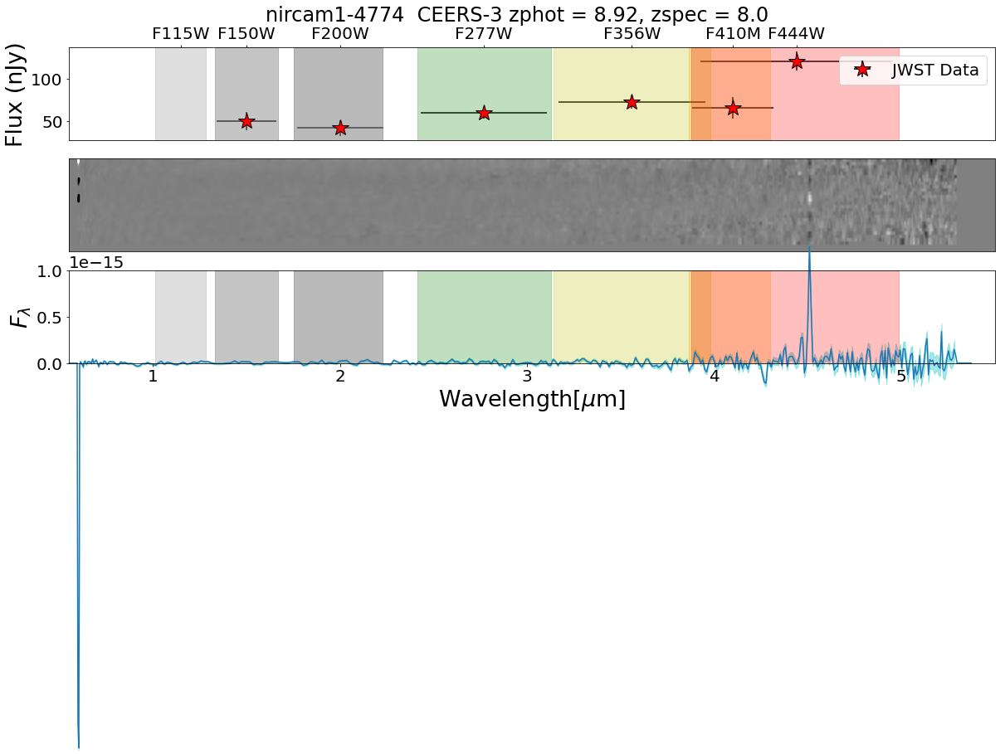

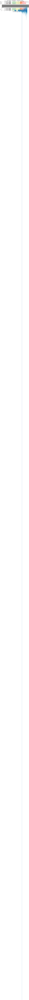

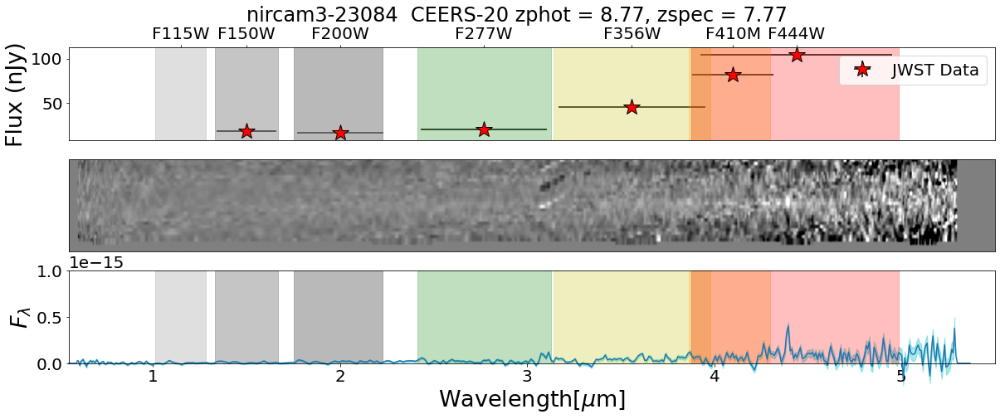

In [192]:
plt.rcParams['figure.figsize'] = (20, 7)
#plot_sources(remaining['Object'], remaining, df_col6, 6)
df = artifactless
sources = photids
#plt.rcParams['figure.figsize'] = (20, 10)
#Grab filters from DataFrame
fs = []
fs_strings = []
a=df.index[0]
c=0
prismss = []
mgratss = []
scale = .1e-14
low_min = 0
datmin = -.01#-1e-5
emax = 1e-1

HST_filters = [140.0, 81.4, 60.6, 105.0, 125.0,  160.0]

val = 3

#mx = 

fs = []
fs_strings = []

for key in df.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=16
stop2 = 29
f_final = []
for f in fs:
    if f>600:
        f_final.append(f*.1)
    else:
        f_final.append(f)

#Create a colormap 

#colormap = plt.cm.gist_ncar
#colors = [colormap(i) for i in np.linspace(0, 1,len(sources)+2)][1:-1]

#Create an SED for each of the sources
i=0
n=-1
for obj in sources[0:3]:
    #print(obj)
    fig, (ax1, ax2, ax3) = plt.subplots(3)
    #fig.suptitle('Vertically stacked subplots')
    
    #UN-COMMENT FOR PLOT ALPHA LABELS
    #props = dict(boxstyle = 'square', facecolor = 'wheat', alpha = 0.2)
    #ax1.text(0.7, 150, 'E', size = 'large', bbox = props)
    
    n+=1
    #print(shapes[i])
    mk = np.array(df['Object']) == np.array(obj)
    a = df[mk]
    #Get the redshift and filters
    rs = a['PHOTOM_RED_SHIFT']
    
    try:
        specrs = zpecs[zpecs['MPTID'] == mptids[n]]['Z'].values[0]
    except:
        specrs = np.nan
    filters = np.array(a.keys()[start:stop].values)
    filter_er = np.array(a.keys()[stop:stop2].values)
    #Mask the data so all filter values are greater than 3 times their error
    mask = (a[filters].values[0] > (3*a[filter_er].values[0]))& (a[filter_er].values[0]>0) 
    #Sort the data so the SED plot connects from left to right, regardless of filter input order
    z = sorted(zip(np.array(f_final)[mask],a[filters].values[0][mask]))
    x=[i[0] for i in z]
    y=[i[1] for i in z]
    

    
    xerror = []
    for j in x:
        xerror.append(error_dict[j]/2)

        
        
        
    ax1.errorbar(x,y,a[filter_er].values[0][mask], xerr = xerror, ls='none',
                color = 'k', marker = '*', markersize = 20, zorder = 1, label = 'JWST Data',
                markerfacecolor='r',)
        #Add the x ticks
    ax1.set_xticks(np.array(f_final)[mask])
    
    itr = 0
    for point in range(len(x)):
        if itr == 0:
            if x[point] in HST_filters:
                itr+=1
                ax1.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20, label = 'HST Data',
                        zorder = 2)
        else:
            if x[point] in HST_filters:
                itr+=1
                ax1.plot(x[point], y[point], marker = '*', color = 'grey', markersize = 20,
                        zorder = 2)
            

    i+=1
    ax1.axvspan(314, 398,  color = 'y', alpha = .25)
    ax1.axvspan(386.4, 430.1,  alpha = 0.25, color = 'orange')
    ax1.axvspan(388, 498.6,  color = 'r', alpha = .25)
    ax1.axvspan(241.6, 312.7,  color = 'g', alpha = .25)
    
    ax1.axvspan(175.5, 222.6,  color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
    ax1.axvspan(133.1, 166.8,  color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
    ax1.axvspan(101.3, 128.2,  color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)
    
    ax1.legend()
    
    #fig.suptitle(f'{obj} \n RS = {round(rs.values[0],2)} observed in {cathits[n]} \n NIRSpec matching distance: {d2ds[n]} \nMPTID {mptids[n]}')
    fig.suptitle(f'{obj}  CEERS-{int(mptids[n])} zphot = {round(rs.values[0],2)}, zspec = {round(specrs,2)}') #observed in {cathits[n]} ')
    
    #plt.title(f'{obj} \n RS = {round(rs.values[0],2)} observed in {cathits[n]} \n NIRSpec matching distance: {d2ds[n]} \nMPTID {mptids[n]}')
    ax1.set_xlim(55,550)
    ax1.set_ylabel('Flux (nJy)')
    #plt.yscale("log")
    #ax1.set_xlabel('Filter')
    ax1.xaxis.tick_top()
    flabels = np.array(['F115W', 'F150W', 'F200W', 'F277W', 'F356W', 'F410M', 'F444W'])
    ax1.set_xticks(np.array([115, 150, 200, 277, 356, 410, 444]))
    ax1.set_xticklabels(flabels)
###

    check = 0
    pointing = cathits[n][-1][-1]
    files = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/*')
    if len(files)==0:
        #print(f'Download files for source {obj}')
        check += 1
    else:
        prism = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/'+
                     f'p{pointing}_PRISM_{int(mptids[n])}_*')
        #print(len(prism))
        if len(prism)!=0:
           # print('Prism available')
            if prism[0][-8] == 's':
                d1 = prism[1]
                d2 = prism[0]
                
                hdu1 = fits.open(d1)
                datap1 = hdu1[1].data
                wave_1d = datap1['WAVELENGTH']
                flx_1d  = datap1['FLUX']
                pix_1d  = np.arange(len(wave_1d))

                datap1 = hdu1[1].data
                flux = []
                for f in flx_1d:
                    if f<datmin:
                        flux.append(np.nan)
                    else:
                        flux.append(f*1e-9)
                        
                flux_e = []
                for f in datap1['FLUX_ERROR']:
                    if f>emax:
                        flux_e.append(np.nan)
                    else:
                        flux_e.append(f*1e-9)
                        
                ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                     np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                #Illustrate a detector gap
                #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                ax3.set_xlabel(r'Wavelength[$\mu$m]')
                ax3.set_ylabel(r'$F_{\lambda}$')
                ax3.set_xlim(.55,5.50)
                ax3.set_ylim(low_min,scale)
                 
                
                


                hdu = fits.open(d2)
                datap2 = hdu[1].data
                #55to550
                xs = np.linspace(.55, 5.5, int(1e4))
                spectra = np.zeros(( datap2.shape[0], int(1e4)))
                for x in np.arange(datap2.shape[0]):
                    inter = np.interp(xs, wave_1d, datap2[x] )
                    spectra[x, :] = inter


                vmin = np.median(datap2) - val * np.std(datap2)
                vmax = np.median(datap2) + val * np.std(datap2)


                ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                ax2.set_xticks([])
                ax2.set_yticks([])
                
            elif prism[0][-8] == 'x':
                
                ###
                d1 = prism[0]
                d2 = prism[1]
                
                hdu1 = fits.open(d1)
                datap1 = hdu1[1].data
                wave_1d = datap1['WAVELENGTH']
                flx_1d  = datap1['FLUX']
                pix_1d  = np.arange(len(wave_1d))

                datap1 = hdu1[1].data
                
                flux = []
                for f in flx_1d:
                    if f<datmin:
                        flux.append(np.nan)
                    else:
                        flux.append(f*1e-9)
                        
                flux_e = []
                for f in datap1['FLUX_ERROR']:
                    if f>emax:
                        flux_e.append(np.nan)
                    else:
                        flux_e.append(f*1e-9)
                        
                ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                     np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                #Illustrate a detector gap
                #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                ax3.set_xlabel(r'Wavelength[$\mu$m]')
                ax3.set_ylabel(r'$F_{\lambda}$')
                ax3.set_xlim(.55,5.50)
                ax3.set_ylim(low_min,scale)
                
                
                


                hdu = fits.open(d2)
                datap2 = hdu[1].data
                #55to550
                xs = np.linspace(.55, 5.5, int(1e4))
                spectra = np.zeros(( datap2.shape[0], int(1e4)))
                for x in np.arange(datap2.shape[0]):
                    inter = np.interp(xs, wave_1d, datap2[x] )
                    spectra[x, :] = inter


                vmin = np.median(datap2) - val * np.std(datap2)
                vmax = np.median(datap2) + val * np.std(datap2)


                ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                ax2.set_xticks([])
                ax2.set_yticks([])
###
                
                
            
            
        elif len(prism)==0:
            mgrat3 = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/'+
                     f'p{pointing}_G395M_{int(mptids[n])}_*')
            if len(mgrat3)!=0:
               # print(f'M grating available for source {obj}')
                
                if mgrat3[0][-8] == 's':
                    d1 = mgrat3[1]
                    d2 = mgrat3[0]
                   # print(mgrat3, mptids[n], '1D:', d1)
                    
                    mgratss.append(mptids[n])
                    
                    hdu1 = fits.open(d1)
                    datap1 = hdu1[1].data
                    wave_1d = datap1['WAVELENGTH']
                    flx_1d  = datap1['FLUX']
                    pix_1d  = np.arange(len(wave_1d))

                    datap1 = hdu1[1].data
                    flux = []
                    for f in flx_1d:
                        if f<datmin:
                            flux.append(np.nan)
                        else:
                            flux.append(f*1e-9)

                    flux_e = []
                    for f in datap1['FLUX_ERROR']:
                        if f>emax:
                            flux_e.append(np.nan)
                        else:
                            flux_e.append(f*1e-9)

                    ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                    ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                         np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                    ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                    ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                    ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                    ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                    #Illustrate a detector gap
                    #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                    ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                    ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                    ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                    ax3.set_xlabel(r'Wavelength[$\mu$m]')
                    ax3.set_ylabel(r'$F_{\lambda}$')
                    ax3.set_xlim(.55,5.50)
                    ax3.set_ylim(low_min,scale)
                    




                    hdu = fits.open(d2)
                    datap2 = hdu[1].data
                    #55to550
                    xs = np.linspace(.55, 5.5, int(1e4))
                    spectra = np.zeros(( datap2.shape[0], int(1e4)))
                    for x in np.arange(datap2.shape[0]):
                        inter = np.interp(xs, wave_1d, datap2[x] )
                        spectra[x, :] = inter


                    vmin = np.median(datap2) - val * np.std(datap2)
                    vmax = np.median(datap2) + val * np.std(datap2)


                    ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                    ax2.set_xticks([])
                    ax2.set_yticks([])


                elif mgrat3[0][-8] == 'x':
                    d1 = mgrat3[0]
                    d2 = mgrat3[1]
                   # print(mgrat3, mptids[n], '1D:', d1)
                    
                    mgratss.append(mptids[n])

                    hdu1 = fits.open(d1)
                    datap1 = hdu1[1].data
                    wave_1d = datap1['WAVELENGTH']
                    flx_1d  = datap1['FLUX']
                    pix_1d  = np.arange(len(wave_1d))

                    datap1 = hdu1[1].data
                    flux = []
                    for f in flx_1d:
                        if f<datmin:
                            flux.append(np.nan)
                        else:
                            flux.append(f*1e-9)

                    flux_e = []
                    for f in datap1['FLUX_ERROR']:
                        if f>emax:
                            flux_e.append(np.nan)
                        else:
                            flux_e.append(f*1e-9)

                    ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                    ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                         np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                    ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                    ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                    ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                    ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                    #Illustrate a detector gap
                    #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                    ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                    ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                    ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                    ax3.set_xlabel(r'Wavelength[$\mu$m]')
                    ax3.set_ylabel(r'$F_{\lambda}$')
                    ax3.set_xlim(.55,5.50)
                    ax3.set_ylim(low_min,scale)
                   




                    hdu = fits.open(d2)
                    datap2 = hdu[1].data
                    #55to550
                    xs = np.linspace(.55, 5.5, int(1e4))
                    spectra = np.zeros(( datap2.shape[0], int(1e4)))
                    for x in np.arange(datap2.shape[0]):
                        inter = np.interp(xs, wave_1d, datap2[x] )
                        spectra[x, :] = inter


                    vmin = np.median(datap2) - val * np.std(datap2)
                    vmax = np.median(datap2) + val * np.std(datap2)


                    ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                    ax2.set_xticks([])
                    ax2.set_yticks([])

            elif len(mgrat3) == 0:
                check == 1
               # print(f'Download files for source {obj}')
    if check == 1:
        
        pointing = int(cathits[n][-1][-1])
        #if:
        ps = []
        for h in cathits[n]:
            p = h[-1]
            try:
                int(p)
                if p !=pointing:
                    ps.append(p)
            except:
                y = True
                
       
                
                
                
                
        if len(ps)!= 0:
            for p in ps:
                pointing = p
                
                ###
                
                files = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/*')
                if len(files)==0:
                    #print(f'Download files for source {obj}')
                    check == 1
                else:
                    prism = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/'+
                                 f'p{pointing}_PRISM_{int(mptids[n])}_*')
                    
                   # prismss.append(mptids[n])
                    #print(len(prism))
                    if len(prism)!=0:
                       # print('Prism available')
                        if prism[0][-8] == 's':
                            d1 = prism[1]
                            d2 = prism[0]
                            
                            prismss.append(mptids[n])

                            hdu1 = fits.open(d1)
                            datap1 = hdu1[1].data
                            wave_1d = datap1['WAVELENGTH']
                            flx_1d  = datap1['FLUX']
                            pix_1d  = np.arange(len(wave_1d))

                            datap1 = hdu1[1].data
                            flux = []
                            for f in flx_1d:
                                if f<datmin:
                                    flux.append(np.nan)
                                else:
                                    flux.append(f*1e-9)

                            flux_e = []
                            for f in datap1['FLUX_ERROR']:
                                if f>emax:
                                    flux_e.append(np.nan)
                                else:
                                    flux_e.append(f*1e-9)

                            ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                            ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                                 np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                            ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                            ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                            ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                            ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                            #Illustrate a detector gap
                            #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                            ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                            ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                            ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                            ax3.set_xlabel(r'Wavelength[$\mu$m]')
                            ax3.set_ylabel(r'$F_{\lambda}$')
                            ax3.set_xlim(.55,5.50)
                            ax3.set_ylim(low_min,scale)
                            




                            hdu = fits.open(d2)
                            datap2 = hdu[1].data
                            #55to550
                            xs = np.linspace(.55, 5.5, int(1e4))
                            spectra = np.zeros(( datap2.shape[0], int(1e4)))
                            for x in np.arange(datap2.shape[0]):
                                inter = np.interp(xs, wave_1d, datap2[x] )
                                spectra[x, :] = inter


                            vmin = np.median(datap2) - val * np.std(datap2)
                            vmax = np.median(datap2) + val * np.std(datap2)


                            ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                            ax2.set_xticks([])
                            ax2.set_yticks([])

                        elif prism[0][-8] == 'x':
                            d1 = prism[0]
                            d2 = prism[1]
                            
                            prismss.append(mptids[n])

                            hdu1 = fits.open(d1)
                            datap1 = hdu1[1].data
                            wave_1d = datap1['WAVELENGTH']
                            flx_1d  = datap1['FLUX']
                            pix_1d  = np.arange(len(wave_1d))

                            datap1 = hdu1[1].data
                            flux = []
                            for f in flx_1d:
                                if f<datmin:
                                    flux.append(np.nan)
                                else:
                                    flux.append(f*1e-9)

                            flux_e = []
                            for f in datap1['FLUX_ERROR']:
                                if f>emax:
                                    flux_e.append(np.nan)
                                else:
                                    flux_e.append(f*1e-9)

                            ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                            ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                                 np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                            ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                            ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                            ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                            ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                            #Illustrate a detector gap
                            #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                            ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                            ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                            ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                            ax3.set_xlabel(r'Wavelength[$\mu$m]')
                            ax3.set_ylabel(r'$F_{\lambda}$')
                            ax3.set_xlim(.55,5.50)
                            ax3.set_ylim(low_min,scale)
                             




                            hdu = fits.open(d2)
                            datap2 = hdu[1].data
                            #55to550
                            xs = np.linspace(.55, 5.5, int(1e4))
                            spectra = np.zeros(( datap2.shape[0], int(1e4)))
                            for x in np.arange(datap2.shape[0]):
                                inter = np.interp(xs, wave_1d, datap2[x] )
                                spectra[x, :] = inter


                            vmin = np.median(datap2) - val * np.std(datap2)
                            vmax = np.median(datap2) + val * np.std(datap2)


                            ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                            ax2.set_xticks([])
                            ax2.set_yticks([])


                    elif len(prism)==0:
                        mgrat3 = glob.glob(f'/home/kelcey/JWST_test_code/updated_sources/p{pointing}/'+
                                 f'p{pointing}_G395M_{int(mptids[n])}_*')
                        if len(mgrat3)!=0:
                           # print(f'M grating available for source {obj}')

                            if mgrat3[0][-8] == 's':
                                d1 = mgrat3[1]
                                d2 = mgrat3[0]
                               # print(mgrat3, mptids[n], '1D:', d1)
                                mgratss.append(mptids[n])

                                hdu1 = fits.open(d1)
                                datap1 = hdu1[1].data
                                wave_1d = datap1['WAVELENGTH']
                                flx_1d  = datap1['FLUX']
                                pix_1d  = np.arange(len(wave_1d))

                                datap1 = hdu1[1].data
                                flux = []
                                for f in flx_1d:
                                    if f<datmin:
                                        flux.append(np.nan)
                                    else:
                                        flux.append(f*1e-9)

                                flux_e = []
                                for f in datap1['FLUX_ERROR']:
                                    if f>emax:
                                        flux_e.append(np.nan)
                                    else:
                                        flux_e.append(f*1e-9)

                                ax3.plot(datap1['WAVELENGTH'], flux, clip_on = False)
                                ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                                     np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                                ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                                ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                                ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                                ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                                #Illustrate a detector gap
                                #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                                ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                                ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                                ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                                ax3.set_xlabel(r'Wavelength[$\mu$m]')
                                ax3.set_ylabel(r'$F_{\lambda}$')
                                ax3.set_xlim(.55,5.50)
                                ax3.set_ylim(low_min,scale)
                                 




                                hdu = fits.open(d2)
                                datap2 = hdu[1].data
                                #55to550
                                xs = np.linspace(.55, 5.5, int(1e4))
                                spectra = np.zeros(( datap2.shape[0], int(1e4)))
                                for x in np.arange(datap2.shape[0]):
                                    inter = np.interp(xs, wave_1d, datap2[x] )
                                    spectra[x, :] = inter


                                vmin = np.median(datap2) - val * np.std(datap2)
                                vmax = np.median(datap2) + val * np.std(datap2)


                                ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                                ax2.set_xticks([])
                                ax2.set_yticks([])


                            elif mgrat3[0][-8] == 'x':
                                d1 = mgrat3[0]
                                d2 = mgrat3[1]
                               # print(mgrat3, mptids[n], '1D:', d1)
                                hdu1 = fits.open(d1)
                                datap1 = hdu1[1].data
                                wave_1d = datap1['WAVELENGTH']
                                flx_1d  = datap1['FLUX']
                                pix_1d  = np.arange(len(wave_1d))

                                datap1 = hdu1[1].data
                                flux = []
                                for f in flx_1d:
                                    if f<datmin:
                                        flux.append(np.nan)
                                    else:
                                        flux.append(f*1e-9)

                                flux_e = []
                                for f in datap1['FLUX_ERROR']:
                                    if f>emax:
                                        flux_e.append(np.nan)
                                    else:
                                        flux_e.append(f*1e-9)

                                ax3.plot(datap1['WAVELENGTH'], flux,  clip_on = False)
                                ax3.fill_between(datap1['WAVELENGTH'], np.array(flux)-np.array(flux_e), 
                                     np.array(flux)+np.array(flux_e), color = 'c', alpha  = 0.35, clip_on = False)
                                ax3.axvspan(3.14, 3.98, label= 'F356', color = 'y', alpha = .25)
                                ax3.axvspan(3.864, 4.301, label= 'F410', alpha = 0.25, color = 'orange')
                                ax3.axvspan(3.88, 4.986, label= 'F444', color = 'r', alpha = .25)
                                ax3.axvspan(2.416, 3.127, label= 'F277', color = 'g', alpha = .25)

                                #Illustrate a detector gap
                                #plt.axvspan(3.26,4.78,color = 'grey', alpha = 0.75)

                                ax3.axvspan(1.755, 2.226, label= 'F200', color = 'grey', alpha = 0.55)#color = 'cyan', alpha = .25)
                                ax3.axvspan(1.331, 1.668, label= 'F150', color = 'grey', alpha = 0.45)#color = 'blue', alpha = .25)
                                ax3.axvspan(1.013, 1.282, label= 'F115', color = 'grey', alpha = 0.25)#color = 'purple', alpha = .25)

                                ax3.set_xlabel(r'Wavelength[$\mu$m]')
                                ax3.set_ylabel(r'$F_{\lambda}$')
                                ax3.set_xlim(.55,5.50)
                                ax3.set_ylim(low_min,scale)
                                
                                #ax3.set_xlim(.55,5.5) 




                                hdu = fits.open(d2)
                                dat
                                ap2 = hdu[1].data
                                #55to550
                                xs = np.linspace(.55, 5.5, int(1e4))
                                spectra = np.zeros(( datap2.shape[0], int(1e4)))
                                for x in np.arange(datap2.shape[0]):
                                    inter = np.interp(xs, wave_1d, datap2[x] )
                                    spectra[x, :] = inter


                                vmin = np.median(datap2) - val * np.std(datap2)
                                vmax = np.median(datap2) + val * np.std(datap2)


                                ax2.imshow(spectra , cmap = 'gray', vmin = vmin, vmax = vmax, origin = 'lower', aspect = 'auto')

                                ax2.set_xticks([])
                                ax2.set_yticks([])
                                #plt.show()
                                #plt.close()
                                #plt.figure();

                        elif len(mgrat3) == 0:
                            check += 1
                           # print(f'Download files for source {obj}')

        
                ###nircam9-90381
        
        elif len(ps) == 0:
            print(f'Download files for source {obj}')

And grabbing Steve's redshift errors so we can compare:

In [193]:
nirspec[nirspec['MPT ID'] == 3]['Photometry ID'].values[0]
catids = []
zstvs = []
zguis = []

for m in zpecs['MPTID']:
    obj = nirspec[nirspec['MPT ID'] == m]['Photometry ID'].values[0]
    zstv = artifactless[artifactless['Object'] == obj]['PHOTOM_RED_SHIFT']
   # zgui = artifactless[artifactless['Object'] == obj]['ZPhot']
    
    catids.append(obj)
    zstvs.append(zstv)
   # zguis.append(zgui)

ze_u = []
ze_l = []
zp = []
for obj in catids:
    dat = df_new[df_new['Object'] == obj]
    ze_u.append(dat['ze_upper'].values[0])
    ze_l.append(dat['ze_lower'].values[0])
    zp.append(dat['PHOTOM_RED_SHIFT'].values[0])

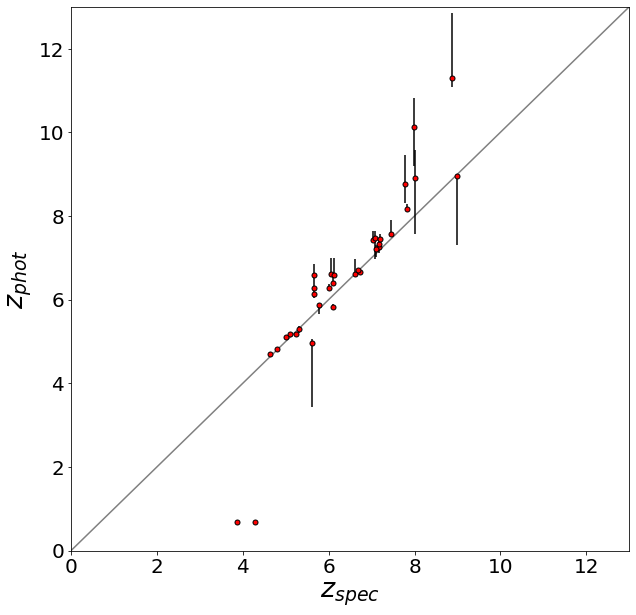

In [194]:
plt.rcParams['figure.figsize'] = (10, 10)
plt.errorbar(zpecs['Z'], zp, zorder = 2, yerr = ([abs(np.array(ze_u)-np.array(zp)),abs(np.array(zp)-np.array(ze_l))]),
             #uplims = np.array(ze_u),
             #lolims = np.array(ze_l),
             marker='o', markersize=5,markeredgecolor = 'k', markerfacecolor = 'r',
            #yerr = (np.array(ze_l), np.array(ze_u)), 
             ls='none', ecolor = 'k',
           rasterized = True)

plt.plot(np.arange(0,14.1,.1), np.arange(0,14.1,.1), 
             c = 'grey', zorder = 0)


plt.xlabel(r'$z_{spec}$')
plt.xlim(0,13)
plt.ylim(0,13)
plt.ylabel('$z_{phot}$')
plt.savefig('/home/kelcey/paper_plots/spec_compare.pdf', bbox_inches = 'tight')

Next, we load in the EWs we calculated previously and calculate EWs for the remaining population:

In [199]:
df_new2= load_photometry("/home/kelcey/Downloads/CEERS_v0.51.2_photom.fits",
                    "/home/kelcey/Downloads/CEERS_v0.51.2_photz_quantities.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_chi2.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_zgrid.fits",
                            "/home/kelcey/Downloads/CEERS_v0.51.2_photz_templates.fits",
                            ignore_HST = True)
ews_tot, ew_lists_big, cont, spike_vals, spike_widths = get_ew_red_only(df = df_new2, sources = df_new2['Object'])
ews_tot277, ew_lists_big277, cont277, spike_vals277, spike_widths277 = get_ew_277(df = df_new2, sources = df_new2['Object'])

<ipython-input-20-4f4a519f3b63>:105: RuntimeWarning: All-NaN axis encountered
  ews_tot.append(np.nanmax(ews))
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountere

In [200]:
df_new2['Cont'] = cont
df_new2['Cont277'] = cont277

df_new2['Spike'] = spike_vals
df_new2['Spike277'] = spike_vals277

In [201]:
conts = []
spikes = []



#ewhigh = []
m = -1
for i in final_data['Object']:
    m+=1
    compdat = df_new2[df_new2['Object'] == i]
    dat = final_data[final_data['Object'] == i]
    f277 = np.max(dat['EW277'].values)
    fred = np.max(dat['EW'].values)
    
    if f277>fred:
       # ewhigh.append(f277)
        conts.append(np.mean(compdat['Cont277'].values[0]))
        spikes.append(compdat['Spike277'].values[0])
    else:
       # ewhigh.append(fred)
        conts.append(np.mean(compdat['Cont'].values[0]))
        spikes.append(compdat['Spike'].values[0])

#for c in cont:
#    conts.append(np.mean(c))
final_data['Cont'] = conts
final_data['Spike'] = spikes

<a class="anchor" id="filter_idents"></a>

# Identifying properties from the filters

We identify both continua and emission lines from the filters of our tier 1 sources and background sources based on their photometric redshifts.

In [229]:
#Identifying the sources in our 2 highest confidence tiers (tier 1)

t1_bool = []
tz = []
for t in final_data['Tier'].values:
    if t == '1A' or t =='1B':
        tz.append(t)
        t1_bool.append(True)
    else:
        t1_bool.append(False)

In [230]:
#Getting information for the continuum of the EELGs

cont_filts = []
cont_width = []
cont_lambds = []
cont_err = []
for obj in final_data['Object'][t1_bool]:
    dat = final_data[final_data['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<.83:
        c = dat['F150']
        cont_filts.append(c)
        cont_lambds.append(1.501*u.um)
        cont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
        cont_err.append(dat['F150_ERROR'].values[0])
    elif zref>3.8 and zref<5.4:
        c = dat['F150']
        cont_filts.append(c)
        cont_lambds.append(1.501*u.um)
        cont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
        cont_err.append(dat['F150_ERROR'].values[0])
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = dat['F200']
        cont_filts.append(c)
        cont_lambds.append(1.99*u.um)
        cont_width.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
        cont_err.append(dat['F200_ERROR'].values[0])
       
    elif zref>7.1:
        c = dat['F277']
        cont_filts.append(c)
        cont_lambds.append(2.786*u.um)
        cont_width.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)
        cont_err.append(dat['F277_ERROR'].values[0])
                           
        

In [231]:
#Getting background population continuum information

cont_filts_big = []
cont_width_big = []
cont_lambds_big = []
for obj in df_new['Object']:
    dat = df_new[df_new['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<3.8:
        c = dat['F150']
        cont_filts_big.append(c)
        cont_lambds_big.append(1.501*u.um)
        cont_width_big.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
    elif zref>3.8 and zref<5.4:
        c = dat['F150']
        cont_filts_big.append(c)
        cont_lambds_big.append(1.501*u.um)
        cont_width_big.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = dat['F200']
        cont_filts_big.append(c)
        cont_lambds_big.append(1.99*u.um)
        cont_width_big.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
       
    elif zref>7.1:
        c = dat['F277']
        cont_filts_big.append(c)
        cont_lambds_big.append(2.786*u.um)
        cont_width_big.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)

In [238]:
def reject_outliers(data, max_std):
    """
    other string to fill out
    """
    return data[abs(data - np.mean(data)) < max_std * np.std(data)]

<a class="anchor" id="errors"></a>
# Error Calculations

In [241]:
#Getting error for the continuum measurements

cont_es = []

for obj in final_data['Object']:

    fxs = []
    odat = final_data[final_data['Object'] == obj]
    for ky in odat.keys()[3:10]:
        fxs.append(odat[ky].values[0])
    conti = reject_outliers(np.array(fxs),1)
    cont_ers = []
    for c in conti:
        idx = np.argwhere(fxs == c)[0][0]
        ekey = odat.keys()[3:10][idx] + '_ERROR'
        cont_ers.append(odat[ekey].values[0])
    cont_es.append(cont_ers)

In [248]:
#Getting error for the emission spike filters

spike_es = []
flx_er = []
spike_keys = []
for obj in final_data['Object']:

    fxs = []
    odat = final_data[final_data['Object'] == obj]
    for ky in odat.keys()[6:10]:
        fxs.append(odat[ky].values[0])
    mx = np.argmax(fxs)
    sky = odat.keys()[6:10][mx]
    spike_keys.append(sky)
    fx_e = odat[sky+'_ERROR'].values[0]
    flx_er.append(fx_e)
    spike_es.append(odat[sky].values[0])

In [250]:
#Getting errors (68% confidence ranges) for the photometric redshifts

ze_u = []
ze_l = []
zp = []
for obj in final_data[t1_bool]['Object']:
    dat = df_new[df_new['Object'] == obj]
    ze_u.append(dat['ze_upper'].values[0])
    ze_l.append(dat['ze_lower'].values[0])
    zp.append(dat['PHOTOM_RED_SHIFT'].values[0])

zie = np.array(ze_u)-np.array(ze_l)

In [251]:
#Creating a null keyword for the masses 
final_data['mass'] = np.repeat(np.nan, len(final_data))

#Calculating observed frame and rest frame equivalent width errors
ewof_er = []
ewrf_er = []
cont_errors = []
i=-1
for obj in final_data[t1_bool]['Object']:
    i+=1
    odat = final_data[final_data['Object'] == obj]
    EW = all_plot['ewrf'].values
    
   # contvs = 
    contvals_eprop = cont_es[i]
    ew_filt_er = spike_keys[i]
    
    mean_e = np.sqrt(np.sum(np.array(contvals_eprop)**2))/len(contvals_eprop)
    cont_errors.append(mean_e)
    
    ew_flx = spike_es[i]
    ew_flux_er = flx_er[i]
    
    subtr = ew_flx - np.mean(contvals_eprop)
    subtr_er = np.sqrt( ((ew_flux_er)**2) + ((mean_e)**2))
    
    under = np.mean(contvals_eprop)
    under_e = mean_e
    
    ew_er  = abs(subtr/under)*np.sqrt( ((subtr_er/subtr)**2) + ((under_e/under)**2) )
    
    

    ewof_er.append(ew_er)
                  
                  
    zi = odat['PHOTOM_RED_SHIFT'].values[0]
    zer = zie[i]
    
    ewrf_er.append((np.abs(EW[i]/(1+zi)))* np.sqrt( ((ew_er/EW[i])**2) + ((zer/(1+zi))**2)))#dls[i]*

# Grabbing $H\alpha$ and $[OIII]$ lines from the photometry

<a class="anchor" id="line_vals"></a>

In [252]:
# Calculating line measurements from the photometry

ha = []
ha_er = []
ha_error = []
o3_er = []
o3 = []
o3_error = []
objs = []
tz = []
cont_fluxes = []

mz = final_data['mass']
zphots = []


lambd = []
fwidth = []

lambdo3 = []
fwidtho3 = []
masses = []
sps = []

ew_filt_key = []
i=-1
for obj in final_data['Object'][t1_bool]:
    dat = final_data[final_data['Object'] == obj]
    shape = dat['Pure Shape'].values
    sps.append(shape)
    c = dat['Cont'].values[0]
    cont_fluxes.append(c)
    #print(c)
    i+=1
    cont_e = cont_errors[i]
    
    if shape == 's356-nd':
        
        ms = dat['mass'].values[0]
        tz.append(dat['Tier'].values[0])
        masses.append(ms)
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        ew_filt_key.append('F356')
        
        objs.append(obj)
        ha.append(np.nan)
        ha_er.append(np.nan)
        ha_error.append(np.nan)
        lambd.append(np.nan)
        fwidth.append(np.nan)
        
        o3.append(dat['F356'].values[0]-c)
        o3_er.append(dat['F356_ERROR'].values[0])
        o3_e = dat['F356_ERROR'].values[0]
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        
        lambdo3.append((3.563*u.um).value)
        fwidtho3.append((((width_dict[356.0][1] - width_dict[356.0][0])/100)*u.um).value)
        
    elif shape ==  's356s410-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        ew_filt_key.append('F356')
                    
        objs.append(obj)
        ha.append(np.nan)
        ha_er.append(np.nan)
        lambd.append(np.nan)
        ha_error.append(np.nan)
        fwidth.append(np.nan)
        
        o3.append(dat['F356'].values[0]-c)
        o3_e = dat['F356_ERROR'].values[0]
        o3_er.append(dat['F356_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((3.563*u.um).value)
        fwidtho3.append((((width_dict[356.0][1] - width_dict[356.0][0])/100)*u.um).value)
        
    elif shape ==  's410-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F410')
                    
        objs.append(obj)
        ha.append(np.nan)
        ha_er.append(np.nan)
        ha_error.append(np.nan)
        lambd.append(np.nan)
        fwidth.append(np.nan)
        
        o3.append(dat['F410'].values[0]-c)
        o3_e = dat['F410_ERROR'].values[0]
        o3_er.append(dat['F410_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((4.092*u.um).value)
        fwidtho3.append((((width_dict[410.0][1] - width_dict[410.0][0])/100)*u.um).value)
        
    elif shape ==  's444-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F444')
                    
        objs.append(obj)
        ha.append(np.nan)
        ha_er.append(np.nan)
        lambd.append(np.nan)
        fwidth.append(np.nan)
        ha_error.append(np.nan)
        
        o3.append(dat['F444'].values[0]-c)
        o3_e = dat['F444_ERROR'].values[0]
        o3_er.append(dat['F444_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((4.421*u.um).value)
        fwidtho3.append((((width_dict[444.0][1] - width_dict[444.0][0])/100)*u.um).value)
        
    elif shape ==  's277-nd':
         
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F277')
                    
        objs.append(obj)
        ha.append(dat['F356'].values[0]-c)
        ha_er.append(dat['F356_ERROR'].values[0])
        ha_e = dat['F356_ERROR'].values[0]
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append((3.563*u.um).value)
        fwidth.append((((width_dict[356.0][1] - width_dict[356.0][0])/100)*u.um).value)
        
        o3.append(dat['F277'].values[0]-c)
        o3_e = dat['F277_ERROR'].values[0]
        o3_er.append(dat['F277_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((2.786*u.um).value)
        fwidtho3.append((((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um).value)
        
    elif shape ==  's277s356-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F277')
                    
                    
        objs.append(obj)
        ha.append(dat['F356'].values[0]-c)
        ha_e = dat['F356_ERROR'].values[0]
        ha_er.append(dat['F356_ERROR'].values[0])
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append((3.563*u.um).value)
        fwidth.append((((width_dict[356.0][1] - width_dict[356.0][0])/100)*u.um).value)
        
        o3.append(dat['F277'].values[0]-c)
        o3_e = dat['F277_ERROR'].values[0]
        o3_er.append(dat['F277_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((2.786*u.um).value)
        fwidtho3.append((((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um).value)
        
        
    elif shape ==  's277s356s444-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F277')
                    
        objs.append(obj)
        ha.append(dat['F444'].values[0]-c)
        ha_e = dat['F444_ERROR'].values[0]
        ha_er.append(dat['F444_ERROR'].values[0])
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append((4.421*u.um).value)
        fwidth.append((((width_dict[444.0][1] - width_dict[444.0][0])/100)*u.um).value)
        
        o3.append(np.nan)
        o3_er.append(np.nan)
        lambdo3.append(np.nan)
        o3_error.append(np.nan)
        fwidtho3.append(np.nan)
        
    elif shape ==  's277s410-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
        #ew_filt_key.append('F277')
                    
        objs.append(obj)
        ha.append(dat['F410'].values[0]-c)
        ha_er.append(dat['F410_ERROR'].values[0])
        ha_e = dat['F410_ERROR'].values[0]
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append((4.092*u.um).value)
        fwidth.append((((width_dict[410.0][1] - width_dict[410.0][0])/100)*u.um).value)
        
        o3.append(dat['F277'].values[0]-c)
        o3_e = dat['F277_ERROR'].values[0]
        o3_er.append(dat['F277_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((2.786*u.um).value)
        fwidtho3.append((((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um).value)
        
    elif shape ==  's277s410s444-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
                    
        objs.append(obj)
        ha.append(dat['F444'].values[0]-c)
        ha_e = dat['F444_ERROR'].values[0]
        ha_er.append(dat['F444_ERROR'].values[0])
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append(4.421*u.um)
        fwidth.append(((width_dict[444.0][1] - width_dict[444.0][0])/100)*u.um)
        
        o3.append(dat['F277'].values[0]-c)
        o3_er.append(dat['F277_ERROR'].values[0])
        o3_e = dat['F277_ERROR'].values[0]
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((2.786*u.um).value)
        fwidtho3.append((((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um).value)
        
    elif shape ==  's356s444-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
                    
        objs.append(obj)
        ha.append(dat['F444'].values[0]-c)
        ha_er.append(dat['F444_ERROR'].values[0])
        ha_er.append(dat['F444_ERROR'].values[0])
        ha_e = dat['F444_ERROR'].values[0]
        ha_error.append(np.sqrt(((ha_e)**2)+((cont_e)**2)))
        lambd.append((4.421*u.um).value)
        fwidth.append((((width_dict[444.0][1] - width_dict[444.0][0])/100)*u.um).value)
        
        o3.append(dat['F356'].values[0]-c)
        o3_e = dat['F356_ERROR'].values[0]
        o3_er.append(dat['F356_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((3.563*u.um).value)
        fwidtho3.append((((width_dict[356.0][1] - width_dict[356.0][0])/100)*u.um).value)
        
    elif shape ==  's410s444-nd':
                    
        ms = dat['mass'].values[0]
        masses.append(ms)
        tz.append(dat['Tier'].values[0])
        zphots.append(dat['PHOTOM_RED_SHIFT'].values[0])
                    
        objs.append(obj)
        ha.append(np.nan)
        ha_error.append(np.nan)
        ha_er.append(np.nan)
        lambd.append(np.nan)
        fwidth.append(np.nan)
        
        o3.append(dat['F410'].values[0]-c)
        o3_e = dat['F410_ERROR'].values[0]
        o3_er.append(dat['F410_ERROR'].values[0])
        o3_error.append(np.sqrt(((o3_e)**2)+((cont_e)**2)))
        lambdo3.append((4.092*u.um).value)
        fwidtho3.append((((width_dict[410.0][1] - width_dict[410.0][0])/100)*u.um).value)
        
        

Calculating luminosity of the continuum and both emission lines

In [255]:
from astropy.cosmology import WMAP9 as cosmo
import astropy.constants as c
import astropy.units as u

Lcont_comp = []
no = 0
rs = df_new['PHOTOM_RED_SHIFT'].values#[~np.array(eelg_bool)].values
#contvs = final_data['Cont'].values
for i in range(len(rs)):
    con = cont_filts_big[i].values[0]
    d = cosmo.luminosity_distance(rs[i])
    Lc = (con*u.nJy) * 4 * np.pi * (d**2) * (c.c) * (1/(cont_lambds_big[i]))#*cont_width[i])
    Lcont_comp.append(Lc.decompose(bases=u.cgs.bases).value)
df_new['Comp_Lcont'] = Lcont_comp

In [256]:
Lcont = []
Lcont_e = []
no = 0
rs = final_data[t1_bool]['PHOTOM_RED_SHIFT'].values
#contvs = final_data['Cont'].values
for i in range(len(rs)):
    con = cont_filts[i].values[0]
    d = cosmo.luminosity_distance(rs[i])
    Lc = (con*u.nJy) * 4 * np.pi * (d**2)* (c.c) * (1/((cont_lambds[i])))#*(cont_width[i])
    Le = (cont_err[i]*u.nJy)* 4 * np.pi * (d**2)* (c.c) * (1/((cont_lambds[i])))
    Lcont_e.append(Le.decompose(bases=u.cgs.bases).value)
    Lcont.append(Lc.decompose(bases=u.cgs.bases).value)#.to(u.erg/u.s/u.Hz).value)

In [257]:
Lha = []
Lha_e = []#ha_er
#Lcont = []
no = 0
rs = final_data[t1_bool]['PHOTOM_RED_SHIFT'].values
for i in range(len(ha)):
    d = cosmo.luminosity_distance(rs[i])
    L = (ha[i]*u.nJy) * 4 * np.pi * (d**2) * (c.c) * (1/(lambd[i]*u.um**2) *fwidth[i]*u.um)
    Lh = (ha_er[i]*u.nJy) * 4 * np.pi * (d**2) * (c.c) * (1/(lambd[i]*u.um**2) *fwidth[i]*u.um)
    Lha.append(L.decompose(bases=u.cgs.bases).value)#.to(u.erg/u.s/u.Hz).value)
    Lha_e.append(Lh.decompose(bases=u.cgs.bases).value)
        #Lha.append(L.to(u.L_sun))
    #print(L.unit)

In [258]:
Lo3 = []
Lo3_e = []#o3_er
flx_o3 = []
no = 0
for i in range(len(o3)):
    d = cosmo.luminosity_distance(rs[i])
    L = (o3[i]*u.nJy) * 4 * np.pi * (d**2) * (c.c) * (1/(lambdo3[i]*u.um**2) *fwidtho3[i]*u.um)
    Lo = (o3_er[i]*u.nJy) * 4 * np.pi * (d**2) * (c.c) * (1/(lambdo3[i]*u.um**2) *fwidtho3[i]*u.um)
    Lo3.append(L.decompose(bases=u.cgs.bases).value)
    Lo3_e.append(Lo.decompose(bases=u.cgs.bases).value)
        #Lha.append(L.to(u.L_sun))
    #print(L.unit)

Calculating the inferred $[OIII]\lambda 5008$ line

In [259]:
o3_5008 = (3/4)*(np.array(o3) - (np.array(ha)*(1/3)))
o3_5008_error =(3/4)* np.sqrt(((np.array(o3_error)/o3 )**2) + (( np.array(ha_error)/ha )**2))* (np.array(o3) + ((1/3)*np.array(ha)))

Calculating the inferred $[OIII]\lambda 5008/ H \alpha$ ratio

In [316]:
o3ha = []

for i in range(len(o3)):
    h = ha[i]
    o = o3_5008[i]
    if o == np.nan or h == np.nan:
        o3ha.append(np.nan)
    else:
        o3ha.append(o/h)
        
o3ha_error = np.array(o3ha)*np.sqrt(((o3_5008_error/o3_5008)**2) + ((ha_error/np.array(ha))**2))
no_nan = np.array(o3ha) != np.nan

<a class="anchor" id="eazy"></a>

# EAZY

Loading in a previous EAZY run (EAZY code included seperately):

In [215]:
eazyvals = Table.read('eazyoutputzphot.ecsv', format = 'ascii.ecsv')
eazyvals_adj = Table.read('eazyoutputzphot_adjusted_conts3.ecsv', format = 'ascii.ecsv')
#Table.read('eazyoutputzphot_adjusted_conts3.ecsv', format = 'ascii.ecsv')

In [216]:
#artifactless = pd.read_pickle('the_final.pkl')

bad_bool1 = artifactless[chibool]['Object']!='nircam5-51524'
bad_bool = artifactless[chibool][bad_bool1]['Object'] != 'nircam7-73581'
#final_data = artifactless[chibool][bad_bool1][bad_bool]
#artifactless
rej = [23087,27863,33244, 36167, 59927,95505, 99815,39083,64059, 69906,75468,78081,79645, 81281, 82314,86152,94692]
arts = []
for o in artifactless[chibool][bad_bool1][bad_bool]['Object'].values:
    if int(o.split('-')[1]) in rej:
        arts.append(False)
    else:
        arts.append(True)

In [217]:
eazyvals_adj = eazyvals_adj[arts]

In [218]:
eazyvals_adj['id'] = np.arange(len(eazyvals_adj))
#eazyvals_adj = eazyvals_adj[arts]

In [219]:
eazyvals['Object'] = df_new['Object'].values
eazyvals_adj['Object'] = final_data['Object']

In [220]:
eelg_bool = []
eelg_idents = final_data['Object'].values
for o in df_new['Object']:
    if o in eelg_idents:
        eelg_bool.append(True)
    else:
        eelg_bool.append(False)

In [260]:
top_tier_bool = []
for tier in final_data['Tier']:
    if tier in ['1A', '1B', '2A', '2B']:
        top_tier_bool.append(True)
    else:
        top_tier_bool.append(False)
final_data_top = final_data[top_tier_bool]
#final_data_top

In [222]:
tier2_bool = []
for tier in final_data['Tier']:
    if tier in ['2A', '2B']:
        tier2_bool.append(True)
    else:
        tier2_bool.append(False)

In [226]:
datbool =  ~np.array(eelg_bool)

Grabbing the comparison sample and subjecting t to the same requirements as the EELGs:

In [262]:
#eazyvals['Lcont'] = Lcont_comp
comp_data = eazyvals[datbool]
comp_data['Lcont'] = df_new['Comp_Lcont'][datbool]

comp_data = comp_data[(comp_data['z_spec']>4) & (comp_data['z_spec']<9.5)]
comp_bool = []
for o in df_new['Object'].values:
    if o in comp_data['Object']:
        comp_bool.append(True)
    else:
        comp_bool.append(False)
        
dv = df_new[comp_bool]
blue_cuts = df_new[comp_bool]
fs = []
fs_strings = []
a=dv.index[0]
c=0


fs = []
fs_strings = []

for key in dv.loc[a][3:16].keys():
    fs.append(float(key.split('F')[1]))
    fs_strings.append(key)
start=3
stop=16
stop2 = 29
f_final = []
for f in fs:
    f_final.append(f)


min_obs = 5
filter_strings = blue_cuts.keys()[start:stop]
error_strings = blue_cuts.keys()[stop:stop2]
keep = []
for ind in blue_cuts.index:
    fvals = []
    evals = []
    dat = blue_cuts.loc[ind]
    for s in range(len(filter_strings)):
        fvals.append(dat[filter_strings[s]])
        evals.append(dat[error_strings[s]])
    hits = (np.array(fvals)>3*np.array(evals) )#& (np.array(fvals) >0) &(np.array(evals) >0)
    hit_count = np.count_nonzero(hits)
    if hit_count > min_obs:
        toss = 0
        mn = np.min(np.array(fvals)[hits])
        mx = np.max(np.array(fvals)[hits])
        if mn<10:
            toss+=1
        #if mx >700:
         #   toss+=1
        #for val in  np.array(fvals)[hits]:
         #   if val < 10:
          #      toss +=1
           # elif val >500:
            #    toss+=1
        if toss == 0:
            keep.append(ind)

comp_data.add_index('id')
comp_data = comp_data.loc[keep]

Removing list columns from the eazy data:

In [263]:
for e in ['Lv_p', 'mass_p', 'LIR_p', 'sfr_p', 'Av_p', 'ssfr_p', 'ABSM_271', 'ABSM_272', 'ABSM_274']:
    eazyvals_adj.remove_column(e)

In [264]:
#Adding restU and restB to the EELG DataFrame

mass = []
restu = []
restb = []

for o in final_data['Object'].values:
    dt = eazyvals_adj[eazyvals_adj['Object'] == o]
    dat = dt.to_pandas()
    #mass.append(dat['mass'].values[0])
    restu.append(dat['restU'].values[0])
    restb.append(dat['restB'].values[0])


#final_data['mass'] = np.array(mass)#eazyvals_adj['mass']
final_data['restU'] = np.array(restu)#eazyvals_adj['restU']
final_data['restB'] = np.array(restb)#eazyvals_adj['restB']


#final_data['sfr'] = #eazyvals_adj['sfr']

In [266]:
#Masking the comparision data out with flags from eazy

colmask = []
for o in (comp_data['Object']):
    dt = comp_data[comp_data['Object'] == o]
    u = dt['restU']
    b = dt['restB']
    if u == -99 or b == -99:
        colmask.append(False)
    else:
        colmask.append(True)

# Half-light Radii

<a class="anchor" id="re"></a>

In [277]:
#loading in file
hdu = fits.open('/home/kelcey/Downloads/ceers_v0.52_galfit.fits')

In [278]:
#Loading the GALFITs for each wideband filter

objects = []
ras = []
decs = []


f115_re = []
f115_re_error = []

f150_re = []
f150_re_error = []

f200_re = []
f200_re_error = []

f277_re = []
f277_re_error = []

f356_re = []
f356_re_error = []

f444_re = []
f444_re_error = []

flag115 = []
flag150 = []
flag200 = []
flag277 = []
flag356 = []
flag444 = []

data = hdu[1].data
for i in range(len(hdu[1].data['ID'])):
    cat = data['CATID'][i]
    ras.append(data['RA'][i])
    decs.append(data['DEC'][i])
    point = data['FIELD'][i].split()[0]
    obj = 'nircam'+str(point)+'-'+str(cat)
    objects.append(obj)
    
    f115_re.append(data['F115W_RE'][i])
    f115_re_error.append(data['F115W_RE_ERR'][i])
    flag115.append(data['F115W_FLAG'][i])
    
    f150_re.append(data['F150W_RE'][i])
    f150_re_error.append(data['F150W_RE_ERR'][i])
    flag150.append(data['F150W_FLAG'][i])
    
    f200_re.append(data['F200W_RE'][i])
    f200_re_error.append(data['F200W_RE_ERR'][i])
    flag200.append(data['F200W_FLAG'][i])
    
    f277_re.append(data['F277W_RE'][i])
    f277_re_error.append(data['F277W_RE_ERR'][i])
    flag277.append(data['F277W_FLAG'][i])

    f356_re.append(data['F356W_RE'][i])
    f356_re_error.append(data['F356W_RE_ERR'][i])
    flag356.append(data['F356W_FLAG'][i])
    
    f444_re.append(data['F444W_RE'][i])
    f444_re_error.append(data['F444W_RE_ERR'][i])
    flag444.append(data['F444W_FLAG'][i])

In [279]:
#RE in arcsec, with associated flags
re_table = pd.DataFrame({'Object': objects, 'F277': f277_re, 'F277_ER': f277_re_error,'F277_FLG':flag277,
                        'F356': f356_re, 'F356_ER': f356_re_error,'F356_FLG':flag356,
                        'F444': f444_re, 'F444_ER': f444_re_error, 'F444_FLG':flag444,
                        'F200': f200_re, 'F200_ER': f200_re_error, 'F200_FLG':flag200,
                        'F150': f150_re, 'F150_ER': f150_re_error, 'F150_FLG':flag150,
                        'F115': f115_re, 'F115_ER': f115_re_error, 'F115_FLG':flag115})

In [280]:
#resetting the index of the DataFrame
plotdat.reset_index()

,index,RA,DEC,Region,F115,F150,F200,F277,F356,F410,...,Dust,Blue,Pure Shape,Tier,ZEEL,Cont,Spike,mass,restU,restB
0,1,214.948019,52.977387,2,40.468047,35.267163,42.683652,79.978971,52.432502,26.553881,...,nd,bc,s277-nd,1A,"[4, 5.5]",40.461752,"[356.0, 410.0, 444.0]",NaN,10.860536,17.945967
1,2,214.940366,52.970820,2,39.287647,30.916884,38.413252,82.691391,62.614552,36.037090,...,nd,bc,s277-nd,1A,"[4, 5.5]",45.074463,"[356.0, 410.0, 444.0]",NaN,45.339581,54.544033
2,3,214.948392,52.975951,2,27.685415,24.395622,23.526240,59.577211,37.842881,25.015032,...,nd,bc,s277-nd,1A,"[4, 5.5]",27.348080,"[356.0, 410.0, 444.0]",NaN,27.780725,33.000256
3,4,214.923938,52.957912,2,87.525454,78.365270,73.491645,157.327402,93.869264,62.085379,...,nd,bc,s277-nd,1A,"[4, 5.5]",76.190880,"[356.0, 410.0, 444.0]",NaN,64.678154,75.412254
4,5,214.990616,53.005090,1,17.491455,14.602899,18.708105,25.804159,34.996333,17.291198,...,nd,bc,s356s444-nd,1A,"[5.6, 7]",20.279699,"[356.0, 410.0, 444.0]",NaN,18.022041,21.173513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
697,2817,214.852986,52.776482,1,18.348273,20.708817,22.730519,21.643946,36.057281,79.578274,...,nd,bc,s410-nd,1B,"[7, 8]",25.582797,"[356.0, 410.0, 444.0]",NaN,16.639671,19.505653
698,2818,214.853041,52.776507,1,18.619350,14.870296,10.700347,23.430228,25.970648,69.882519,...,nd,bc,s410-nd,1B,"[7, 8]",23.757509,"[356.0, 410.0, 444.0]",NaN,16.116541,23.251160
699,2819,214.812056,52.746747,2,58.428681,62.685483,56.340509,48.254716,56.876591,201.590522,...,nd,bc,s410-nd,1B,"[7, 8]",64.972306,"[356.0, 410.0, 444.0]",NaN,13.138564,28.185545
700,2821,214.849493,52.772945,1,66.183172,86.089758,91.874049,133.996290,168.152788,280.598663,...,nd,bc,s410-nd,1B,"[7, 8]",120.028222,"[356.0, 410.0, 444.0]",NaN,34.512306,65.297409


In [281]:
#Matching the halflight radii to the EELGs

import astropy.units as u


catalog = SkyCoord(ra=ras*u.degree, dec=decs*u.degree)

c = SkyCoord(ra=plotdat['RA']*u.degree, dec=plotdat['DEC']*u.degree)

idx, d2d, d3d = c.match_to_catalog_sky(catalog)

match_re = pd.DataFrame({'Match Distance': d2d, 'Photometry RA': plotdat['RA'], 
                         'Photometry DEC':plotdat['DEC'], 
                         'Photometry ID': plotdat['Object'],
                        'F277': np.array(f277_re)[idx], 'F277_ER': np.array(f277_re_error)[idx],
                        'F277_FLG':np.array(flag277)[idx],
                        'F356': np.array(f356_re)[idx], 
                        'F356_ER': np.array(f356_re_error)[idx],
                        'F356_FLG':np.array(flag356)[idx],
                        'F444': np.array(f444_re)[idx], 
                        'F444_ER': np.array(f444_re_error)[idx], 
                        'F444_FLG':np.array(flag444)[idx],
                        'F200': np.array(f200_re)[idx], 
                        'F200_ER': np.array(f200_re_error)[idx], 
                        'F200_FLG':np.array(flag200)[idx],
                        'F150': np.array(f150_re)[idx], 
                        'F150_ER': np.array(f150_re_error)[idx], 
                        'F150_FLG':np.array(flag150)[idx],
                        'F115': np.array(f115_re)[idx], 
                        'F115_ER': np.array(f115_re_error)[idx], 
                        'F115_FLG':np.array(flag115)[idx]
                        
                        })

match_re = match_re.reset_index()

In [282]:
#Matching the comparison data to the halflight radii 

cdat = comp_data


catalog = SkyCoord(ra=ras*u.degree, dec=decs*u.degree)

c = SkyCoord(ra=cdat['ra']*u.degree, dec=cdat['dec']*u.degree)

idx, d2d, d3d = c.match_to_catalog_sky(catalog)

match_re_comp = pd.DataFrame({'Match Distance': d2d, 'Photometry RA': cdat['ra'], 
                         'Photometry DEC':cdat['dec'], 
                         'Photometry ID': cdat['Object'],
                        'F277': np.array(f277_re)[idx], 'F277_ER': np.array(f277_re_error)[idx],
                        'F277_FLG':np.array(flag277)[idx],
                        'F356': np.array(f356_re)[idx], 
                        'F356_ER': np.array(f356_re_error)[idx],
                        'F356_FLG':np.array(flag356)[idx],
                        'F444': np.array(f444_re)[idx], 
                        'F444_ER': np.array(f444_re_error)[idx], 
                        'F444_FLG':np.array(flag444)[idx],
                        'F200': np.array(f200_re)[idx], 
                        'F200_ER': np.array(f200_re_error)[idx], 
                        'F200_FLG':np.array(flag200)[idx],
                        'F150': np.array(f150_re)[idx], 
                        'F150_ER': np.array(f150_re_error)[idx], 
                        'F150_FLG':np.array(flag150)[idx],
                        'F115': np.array(f115_re)[idx], 
                        'F115_ER': np.array(f115_re_error)[idx], 
                        'F115_FLG':np.array(flag115)[idx]
                        
                        })

match_re_comp = match_re_comp.reset_index()

In [283]:
#Getting the relavent continuum filters for the population based on photometric redshift

recont_filts = []
recont_width = []
recont_lambds = []

re = []
re_flg = []
re_er = []
for obj in plotdat['Object']:
    dat = plotdat[plotdat['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<.83:
        c = 'F150'
        recont_filts.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        re.append(ind_dat[c].values[0])
        re_flg.append(ind_dat[flg].values[0])
        re_er.append(ind_dat[er].values[0])
        #recont_lambds.append(1.501*u.um)
        #recont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
    elif zref>3.8 and zref<5.4:
        c = 'F150'
        recont_filts.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        re.append(ind_dat[c].values[0])
        re_flg.append(ind_dat[flg].values[0])
        re_er.append(ind_dat[er].values[0])
        #recont_lambds.append(1.501*u.um)
        #recont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = 'F200'
        recont_filts.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        re.append(ind_dat[c].values[0])
        re_flg.append(ind_dat[flg].values[0])
        re_er.append(ind_dat[er].values[0])
        #recont_lambds.append(1.99*u.um)
        #recont_width.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
       
    elif zref>7.1:
        c = 'F277'
        recont_filts.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        re.append(ind_dat[c].values[0])
        re_flg.append(ind_dat[flg].values[0])
        re_er.append(ind_dat[er].values[0])
        #recont_lambds.append(2.786*u.um)
        #recont_width.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)
                           
#Doing this same selection for the background data       

recont_filts_big = []
recont_width_big = []
recont_lambds_big = []

re_big = []
re_flg_big = []
re_er_big = []

for obj in cdat['Object']:
    dat = df_new[df_new['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<3.8:
        c = 'F150'
        recont_filts_big.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        re_big.append(ind_dat[c].values[0])
        re_flg_big.append(ind_dat[flg].values[0])
        re_er_big.append(ind_dat[er].values[0])
        #recont_lambds_big.append(1.501*u.um)
        #recont_width_big.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
    elif zref>3.8 and zref<5.4:
        c = 'F150'
        recont_filts_big.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        re_big.append(ind_dat[c].values[0])
        re_flg_big.append(ind_dat[flg].values[0])
        re_er_big.append(ind_dat[er].values[0])
        #recont_lambds_big.append(1.501*u.um)
        #recont_width_big.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = 'F200'
        recont_filts_big.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        re_big.append(ind_dat[c].values[0])
        re_flg_big.append(ind_dat[flg].values[0])
        re_er_big.append(ind_dat[er].values[0])
        #recont_lambds_big.append(1.99*u.um)
        #recont_width_big.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
       
    elif zref>7.1:
        c = 'F277'
        recont_filts_big.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        re_big.append(ind_dat[c].values[0])
        re_flg_big.append(ind_dat[flg].values[0])
        re_er_big.append(ind_dat[er].values[0])
        #recont_lambds_big.append(2.786*u.um)
        #recont_width_big.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)

In [284]:
#Getting the filters for the [OIII] line 

recont_filtso3 = []
recont_widtho3 = []
recont_lambdso3 = []

reo3 = []
re_flgo3 = []
re_ero3 = []

for obj in plotdat['Object']:
    dat = plotdat[plotdat['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<3.8:
        c = 'F150'
        recont_filtso3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        reo3.append(ind_dat[c].values[0])
        re_flgo3.append(ind_dat[flg].values[0])
        re_ero3.append(ind_dat[er].values[0])
        #recont_lambds.append(1.501*u.um)
        #recont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
    elif zref>3.8 and zref<5.4:
        c = 'F277'
        recont_filtso3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        reo3.append(ind_dat[c].values[0])
        re_flgo3.append(ind_dat[flg].values[0])
        re_ero3.append(ind_dat[er].values[0])
        #recont_lambdso3.append(2.786*u.um)
        #recont_widtho3.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = 'F356'
        recont_filtso3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        reo3.append(ind_dat[c].values[0])
        re_flgo3.append(ind_dat[flg].values[0])
        re_ero3.append(ind_dat[er].values[0])
        #recont_lambds.append(1.99*u.um)
        #recont_width.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
       
    elif zref>7.1:
        c = 'F444'
        recont_filtso3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re[match_re['Photometry ID'] == obj]
        reo3.append(ind_dat[c].values[0])
        re_flgo3.append(ind_dat[flg].values[0])
        re_ero3.append(ind_dat[er].values[0])
        #recont_lambds.append(2.786*u.um)
        #recont_width.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)
                           
        
#Getting background data [OIII] filters

recont_filts_bigo3 = []
recont_width_bigo3 = []
recont_lambds_bigo3 = []

reo3_big = []
re_flgo3_big = []
re_ero3_big = []

for obj in cdat['Object']:
    dat = df_new[df_new['Object'] == obj]
    zref = dat['PHOTOM_RED_SHIFT'].values[0]
    if zref<3.8:
        c = 'F150'
        recont_filts_bigo3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        reo3_big.append(ind_dat[c].values[0])
        re_flgo3_big.append(ind_dat[flg].values[0])
        re_ero3_big.append(ind_dat[er].values[0])
        #recont_lambds.append(1.501*u.um)
        #recont_width.append(((width_dict[150.0][1] - width_dict[150.0][0])/100)*u.um)
    elif zref>3.8 and zref<5.4:
        c = 'F277'
        recont_filts_bigo3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        reo3_big.append(ind_dat[c].values[0])
        re_flgo3_big.append(ind_dat[flg].values[0])
        re_ero3_big.append(ind_dat[er].values[0])
        #recont_lambdso3.append(2.786*u.um)
        #recont_widtho3.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)
       # print(zref)
    elif zref>5.4 and zref<7.1:
        c = 'F356'
        recont_filts_bigo3.append(c)
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        reo3_big.append(ind_dat[c].values[0])
        re_flgo3_big.append(ind_dat[flg].values[0])
        re_ero3_big.append(ind_dat[er].values[0])
        #recont_lambds.append(1.99*u.um)
        #recont_width.append(((width_dict[200.0][0][1] - width_dict[200.0][0][0])/100)*u.um)
       
    elif zref>7.1:
        c = 'F444'
        er = c +'_ER'
        flg = c + '_FLG'
        ind_dat = match_re_comp[match_re_comp['Photometry ID'] == obj]
        reo3_big.append(ind_dat[c].values[0])
        re_flgo3_big.append(ind_dat[flg].values[0])
        re_ero3_big.append(ind_dat[er].values[0])
        recont_filts_bigo3.append(c)
        #recont_lambds.append(2.786*u.um)
        #recont_width.append(((width_dict[277.0][1] - width_dict[277.0][0])/100)*u.um)

In [285]:
#Adding the bakcground and EELG Re data to seperate DataFrames

re_data_sorted_comp = pd.DataFrame({'Re_cont':re_big,
                               'Re_contFLG':re_flg_big,
                               'Re_contER':re_er_big,
                               'Re_o3':reo3_big,
                               'Re_o3FLG':re_flgo3_big,
                               'Re_o3_ER':re_ero3_big,
                              })

re_data_sorted = pd.DataFrame({'Re_cont':re,
                               'Re_contFLG':re_flg,
                               'Re_contER':re_er,
                               'Re_o3':reo3,
                               'Re_o3FLG':re_flgo3,
                               'Re_o3_ER':re_ero3,
                              })

In [286]:
#Getting sources with the best flag for continuum Re

datbool0 = []
for f in range(len(re_data_sorted['Re_cont'])):
    dat = re_data_sorted.iloc[f]
    f1 = dat['Re_contFLG']
    f2 = dat['Re_o3FLG']
    if f1 == 0 and f2 == 0:
        datbool0.append(True)
    else:
        datbool0.append(False)

datbool1 = []
for f in range(len(re_data_sorted['Re_cont'])):
    dat = re_data_sorted.iloc[f]
    f1 = dat['Re_contFLG']
    f2 = dat['Re_o3FLG']
    if f1 == 1 and f2 == 1:
        datbool1.append(True)
    else:
        datbool1.append(False)

In [287]:
#Getting sources with the best [OIII] Re. Don't worry about the index out of range error.

good_cont = []
for f in re_data_sorted['Re_contFLG'].values:
    if f == 0:
        good_cont.append(True)
    else:
        good_cont.append(False)

badcont3 = plotdat[good_cont]
badcont3.to_csv('cont_flag.csv')

good_cont = []
for f in re_data_sorted['Re_o3FLG'].values:
    if f == 0:
        good_cont.append(True)
    else:
        good_cont.append(False)

bado3 = plotdat[good_cont]
bado3.to_csv('emission_flag.csv')

good_cont = []
for f in re_data_sorted['Re_contFLG'].values:
    if f == 0 or f == 1:
        good_cont.append(True)
    else:
        good_cont.append(False)

good_o3 = []
for f in re_data_sorted[good_cont]['Re_o3FLG'].values:
    if f == 0 or f == 1:
        good_o3.append(True)
    else:
        good_o3.append(False)

good_cont_comp = []
for f in re_data_sorted_comp['Re_contFLG'].values:
    if f == 0:
        good_cont_comp.append(True)
    else:
        good_cont_comp.append(False)

good_o3_comp = []
for f in re_data_sorted_comp[good_cont_comp]['Re_o3FLG'].values:
    if f == 0:
        good_o3_comp.append(True)
    else:
        good_o3_comp.append(False)

good_cont_tri = []
itr = -1
for f in re_data_sorted['Re_contFLG'].values:
    itr+=1
    if f ==0 or f == 1 or f == 2:
        chk = good_cont[itr]
        if chk == True:
            good_cont_tri.append(False)
        else:
            good_cont_tri.append(True)
    else:
        good_cont_tri.append(False)

good_o3_tri = []
itr = -1
for f in re_data_sorted[good_cont_tri]['Re_o3FLG'].values:
    itr+=1
    if f ==0 or f == 1 or f == 2:
        chk = good_o3[itr]
        if chk == True:
            good_o3_tri.append(False)
        else:
            good_o3_tri.append(True)
    else:
        good_o3_tri.append(False)
itr = -1
good_cont_comp_tri = []
for f in re_data_sorted_comp['Re_contFLG'].values:
    itr+=1
    if f ==0 or f == 1 or f == 2:
        chk = good_cont_comp[itr]
        if chk == True:
            good_cont_comp_tri.append(False)
        else:
            good_cont_comp_tri.append(True)
    else:
        good_cont_comp_tri.append(False)

itr = -1
good_o3_comp_tri = []
for f in re_data_sorted_comp[good_cont_comp_tri]['Re_o3FLG'].values:
    itr+=1
    if f ==0 or f == 1 or f == 2:
        chk = good_o3_comp[itr]
        if chk == True:
            good_o3_comp_tri.append(False)
        else:
            good_o3_comp_tri.append(True)
    else:
        good_o3_comp_tri.append(False)


IndexError: list index out of range

In [312]:
#Note only looking in wideband filters
maxspike = []
for obj in final_data['Object']:
    dat = final_data[final_data['Object'] == obj]
    filtvals = []
    
    f277 = dat['F277'].values[0]
    f356 = dat['F356'].values[0]
    f444 = dat['F444'].values[0]

    spikes = np.array([f277, f356, f444])
    mx = np.argmax(spikes)

    if mx == 0:
        maxspike.append('F277')
    elif mx == 1:
        maxspike.append('F356')
    elif mx == 2:
        maxspike.append('F444')
final_data['Max Spike'] = maxspike

# Data Plots

Here, we make all our plots for the data we derived in the previous parts.

<a class="anchor" id="datplots"></a>

<ipython-input-272-a7b1a0dd81b6>:5: RuntimeWarning: invalid value encountered in log10
  xs = np.log10(comp_data['Lcont'][colmask])
<ipython-input-272-a7b1a0dd81b6>:6: RuntimeWarning: invalid value encountered in divide
  ys = -2.5*np.log10(comp_data['restU'][colmask]/comp_data['restB'][colmask])
<ipython-input-272-a7b1a0dd81b6>:6: RuntimeWarning: invalid value encountered in log10
  ys = -2.5*np.log10(comp_data['restU'][colmask]/comp_data['restB'][colmask])
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


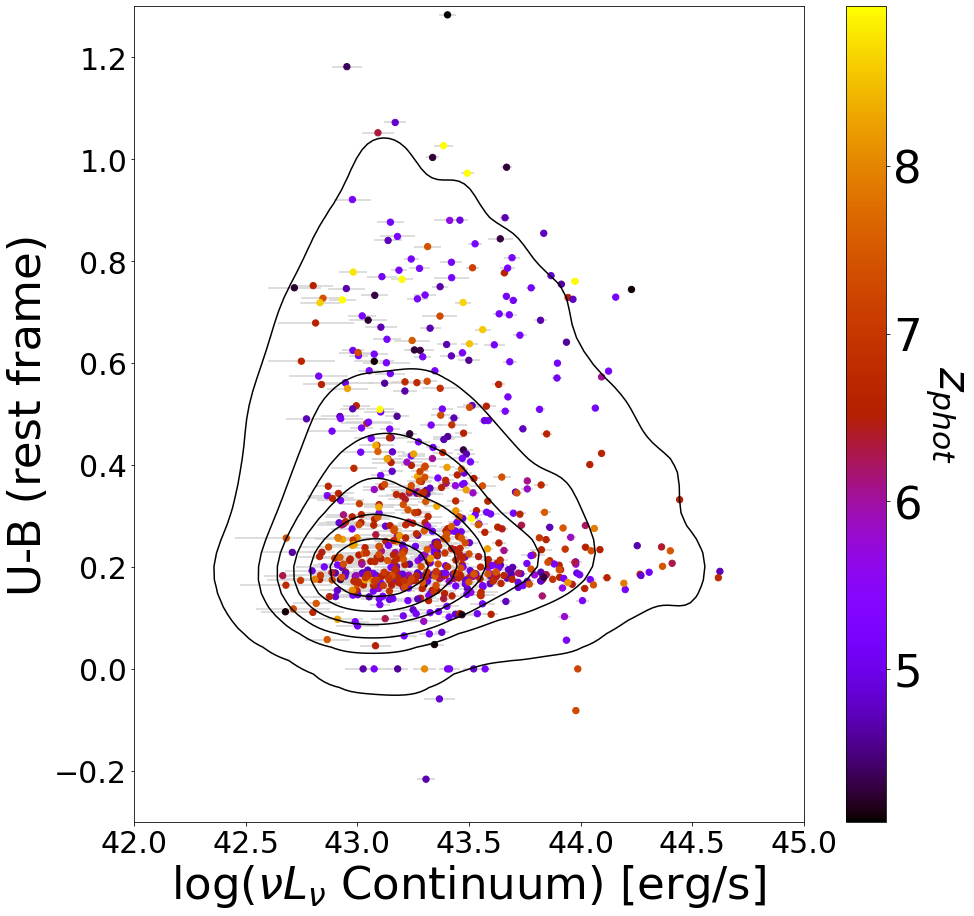

In [272]:
plt.rcParams['figure.figsize'] = (15, 15)



xs = np.log10(comp_data['Lcont'][colmask])
ys = -2.5*np.log10(comp_data['restU'][colmask]/comp_data['restB'][colmask])

dat =  pd.DataFrame({'F410 - F444':xs, ' ':ys})
sns.kdeplot(data = dat, x = 'F410 - F444', y = ' ',  fill = False,  label = 'CEERS', 
            levels = 7, color = 'k')

plotdat = pd.concat([final_data[final_data['Tier'] == '1A'], final_data[final_data['Tier'] == '1B']])


xe = (1/np.log(10))*np.array(Lcont_e)/np.array(Lcont)
#ye = (1/np.log(10))*np.array(Lha_e)/np.array(Lha)


plt.errorbar(np.log10(Lcont), -2.5*np.log10(plotdat['restU']/plotdat['restB']), xerr = xe, ls='none', zorder = 0, c = 'lightgrey')



plt.scatter(np.log10(Lcont), 
            -2.5*np.log10(plotdat['restU']/plotdat['restB']), 
             label = 'Tier 1 EELGs', 
           c = all_plot['z'], s = 40,  cmap = 'gnuplot', rasterized = True)

#plt.scatter(np.log10(final_data['mass'][final_data['Tier'] == '1B']), 
#            -2.5*np.log10(final_data['restU'][final_data['Tier'] == '1B']/final_data['restB'][final_data['Tier'] == '1B']), 
#           c = 'r', s = 20, edgecolor = 'grey')

#plt.scatter(np.log10(artifactless['mass'][artifactless['Tier'] == '1B']), 
#            -2.5*np.log10(artifactless['restU'][artifactless['Tier'] == '1B']/artifactless['restB'][artifactless['Tier'] == '1B']), 
#             label = '1B', 
#           c = 'lightcoral', s = 20, edgecolor = 'grey')

c = plt.colorbar()
c.ax.set_ylabel(r'$z_{phot}$', rotation=270, fontsize = 45, labelpad=45)
c.ax.tick_params(labelsize=45)

plt.ylabel('U-B (rest frame)', fontsize  = 45)
#plt.yticks([])
#plt.colorbar()
plt.xlabel(r'log($\nu L_{\nu}$ Continuum) [erg/s]', fontsize = 45)
plt.ylim(-.3,1.3)
plt.xlim(42,45)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
#plt.ylim(-1,2)
#plt.xlim(6,15)
#plt.legend();
plt.savefig('/home/kelcey/paper_plots/ub_z2.pdf')

<a class="anchor" id="zphot"></a>

plot for the redshift distribution of EELGs:

(4.0, 9.5)

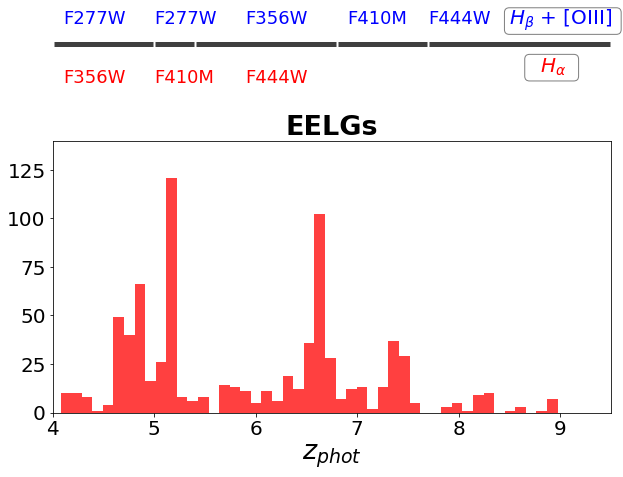

In [275]:
plt.rcParams['figure.figsize'] = (10, 5)
plt.hist(final_data[top_tier_bool]['PHOTOM_RED_SHIFT'], bins = 120, label = '1A', alpha = .75, 
         color = 'r', zorder = 0)

###


implied_dict = {'s277-nd': [4,5, 'F277W F356W', 'hb ha'], 
                #'s277s356s444-nd': [5.1,5.6, 'F277W F356W+F444W', 'hb ha'], 
                's277s410-nd':[5, 5.4, 'F277W F410M', 'hb ha'],
               #'s277s410s444-nd': [5,5.2, 'F277W F410M+F444W', 'hb ha'], 
               # 's356-nd': [6.5, 7, 'F356W', 'hb'], 
               # 's356s410-nd': [6.7, 7.1, 'F356W+F410M', 'hb'],
               's356s444-nd':[5.4,6.8, 'F356W F444W', 'hb ha'], 
                's410-nd': [6.8, 7.7, 'F410M', 'hb'], 
                #'s410s444-nd':[7.2, 7.8, 'F410M+F444W', 'hb'],
               's444-nd':[7.7, 9.5, 'F444W', 'hb']}


for i in implied_dict.keys():
    i2 = None
    if i == 's277s410-nd':
        i2 = 's277s410s444-nd'
    elif i == 's410-nd':
        i2 = 's410s444-nd'
    elif i == 's356s410-nd':
        i2 = 's356-nd'
        
    
    if i2 == None:
        dc = implied_dict[i]
        lower = dc[0]
        upper = dc[1]
        filts = dc[2].split(' ')
        lines = dc[3].split(' ')
        if len(lines)==1:
            #Just Hb
            textlabel = filts[0]
            textcolor = 'b'

            shape_dat = final_data[final_data['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            percent = 80

            plt.errorbar(x = np.mean([lower,upper]), y = 190, xerr = (((upper)-(lower))/2)-.01, lw =5, alpha = .75,
                    c = 'k', clip_on = False)
            plt.text(lower+0,200, textlabel, rotation = 0, c = textcolor, fontsize = 18)
           # plt.text(lower, percent-.02, f'N = {len(shape_dat)} ', fontsize = 14)

        else:

            textlabel1 = filts[0]
            textcolor1 = 'b'

            textlabel2 = filts[1]
            textcolor2 = 'r'

            shape_dat = final_data[final_data['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            percent = 100

            plt.errorbar(x = np.mean([lower,upper]), y = 190, xerr = (((upper)-(lower))/2)-.01, lw =5, alpha = .75,
                    c = 'k', clip_on = False)
            #red
            plt.text(upper-.9,200, textlabel1, rotation = 0, c = textcolor1, fontsize = 18)
           # plt.text(upper-.25,200, '/', rotation = 0, c = 'k', fontsize = 19)
            #blue
            plt.text(upper-.9,170, textlabel2, rotation = 0, c = textcolor2, fontsize = 18)

            #plt.text(lower, percent-.02, f'N = {len(shape_dat)}', fontsize = 14)
            
    else:
        dc = implied_dict[i]
        lower = dc[0]
        upper = dc[1]
        filts = dc[2].split(' ')
        lines = dc[3].split(' ')
        if len(lines)==1:
            #Just Hb
            textlabel = filts[0]
            textcolor = 'b'

            shape_dat = final_data[final_data['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            dati2 = final_data[final_data['Pure Shape'] == str(i)]
            
            ina2 = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb2 = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])
            
            
            percent = 90

            plt.errorbar(x = np.mean([lower,upper]), y = 190, xerr = (((upper)-(lower))/2)-.01, lw =5, alpha = .75,
                    c = 'k', clip_on = False)
            plt.text(upper-.8,200, textlabel, rotation = 0, c = textcolor, fontsize = 18)
           # plt.text(lower, percent-.02, f'N = {len(shape_dat)+len(dati2)} ', fontsize = 14)

        else:

            textlabel1 = filts[0]
            textcolor1 = 'b'

            textlabel2 = filts[1]
            textcolor2 = 'r'

            shape_dat = final_data[final_data['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])
            
            dati2 = final_data[final_data['Pure Shape'] == str(i)]
            
            ina2 = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb2 = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            percent = 80

            plt.errorbar(x = np.mean([lower,upper]), y = 190, xerr = (((upper)-(lower))/2)-.01, lw =5, alpha = .75,
                    c = 'k', clip_on = False)
            #red
            plt.text(upper-.4,200, textlabel1, rotation = 0, c = textcolor1, fontsize = 18)
            #plt.text(upper-.25,200 ,'/', rotation = 0, c = 'k', fontsize = 19)
            #blue
            plt.text(upper-.4,170, textlabel2, rotation = 0, c = textcolor2, fontsize = 18)

           # plt.text(lower, percent-.02, f'N = {len(shape_dat)+len(dati2)}', fontsize = 14)


        #print(lines)
font = {'family': 'serif',
        'color':  'white',
        'weight': 'normal',
        'size': 16,
        }
props = dict(boxstyle='round', facecolor='white', alpha=0.5)        
label = 'box   '#r'\textcolor{red}{$H_{\beta}$ + [OIII]} '+ r'\textcolor{blue}{$H_{\alpha}$} '     
plt.text(8.7, 182, label,  
        verticalalignment='top', bbox=props, fontdict=font)  
        


props = dict(boxstyle='round', facecolor='white', alpha=0.5)        
label = 'box  box box '#r'\textcolor{red}{$H_{\beta}$ + [OIII]} '+ r'\textcolor{blue}{$H_{\alpha}$} '     
plt.text(8.5, 206, label,  
        verticalalignment='top', bbox=props, fontdict=font)  
   
plt.text(8.5, 200, r'$H_{\beta}$ + [OIII]', c = 'b')
#plt.ylim(0.2,1)
plt.text(8.8, 175, r'$H_{\alpha}$', c = 'r')

#plt.axvline(6.6)
###
plt.ylim(0,140)

#plt.axvline(6.8)
plt.title('EELGs')
plt.xlabel('$z_{phot}$')
#plt.ylim(0, 2500)
#plt.xticks([])
plt.xlim(4,9.5)
#plt.savefig('/home/kelcey/paper_plots/eelg_z.pdf', bbox_inches = 'tight')

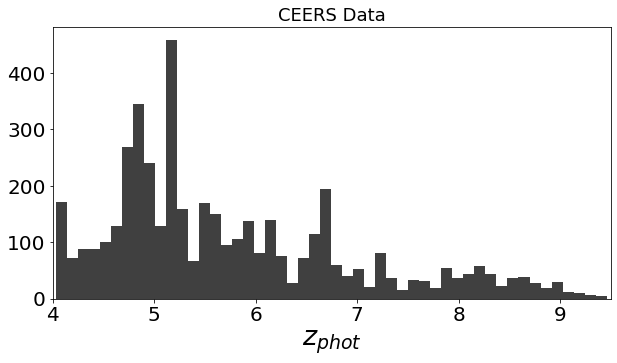

In [357]:
#comp_dat_bool = ~np.array(eelg_bool)
plt.rcParams['figure.figsize'] = (10, 5)
plt.hist(comp_data['z_spec'], bins = 50, label = '1A', alpha = .75, 
         color = 'k', zorder = 10)

###






###

#plt.hist(artifactless[artifactless['Tier'] == '1B']['PHOTOM_RED_SHIFT'], bins = 15, label = '1B', alpha = .75, 
#         color = 'lightcoral', zorder = 5)


plt.title('CEERS Data')
plt.xlabel('$z_{phot}$')
#plt.xlabel('Photometric Redshift')
#plt.ylim(0, 2500)
#plt.xticks([])
plt.xlim(4,9.5)
plt.savefig('/home/kelcey/paper_plots/ceers_z.pdf', bbox_inches = 'tight')
#plt.legend();

s277s410-nd changed
s356s444-nd changed
s410-nd


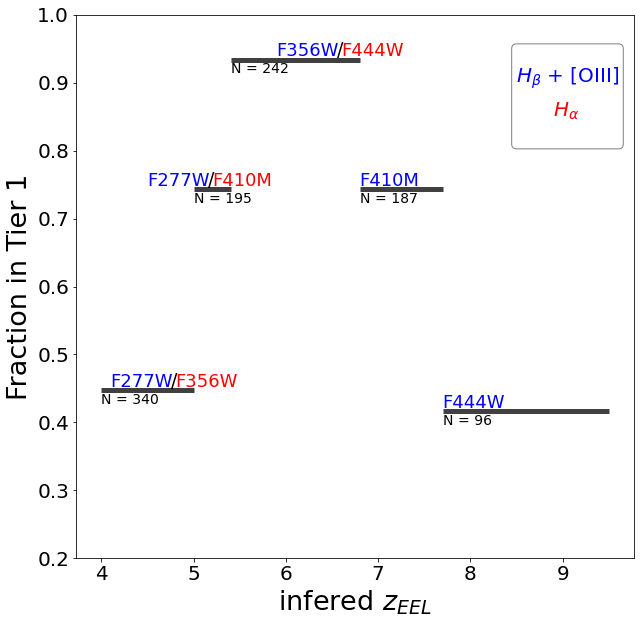

In [276]:
plt.rcParams['figure.figsize'] = (10, 10)

used_shapes = []
for i in implied_dict.keys():
    i2 = None
    if i == 's277s410-nd':
        i2 = 's277s410s444-nd'
    elif i == 's410-nd':
        i2 = 's410s444-nd'
        i3 = 's356s410-nd'
   # elif i == 's410-nd':
    #    i2 =
    elif i == 's356s444-nd':
        i2 = 's356-nd'
        
    if i2 == None:
        dc = implied_dict[i]
        lower = dc[0]
        upper = dc[1]
        filts = dc[2].split(' ')
        lines = dc[3].split(' ')
        if len(lines)==1:
            #Just Hb
            textlabel = filts[0]
            textcolor = 'b'

            shape_dat = final_data_top[final_data_top['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            percent = (ina+inb)/len(shape_dat)

            plt.errorbar(x = np.mean([lower,upper]), y = percent, xerr = (upper-lower)/2, lw =5, alpha = .75,
                    c = 'k')
            plt.text(lower,percent+.005, textlabel, rotation = 0, c = textcolor, fontsize = 18)
            plt.text(lower, percent-.02, f'N = {len(shape_dat)} ', fontsize = 14)
            used_shapes.append(i)

        else:

            textlabel1 = filts[0]
            textcolor1 = 'b'

            textlabel2 = filts[1]
            textcolor2 = 'r'

            shape_dat = final_data_top[final_data_top['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            percent = (ina+inb)/len(shape_dat)

            plt.errorbar(x = np.mean([lower,upper]), y = percent, xerr = (upper-lower)/2, lw =5, alpha = .75,
                    c = 'k')
            #red
            plt.text(upper-.9,percent+.005, textlabel1, rotation = 0, c = textcolor1, fontsize = 18)
            plt.text(upper-.25,percent+.005, '/', rotation = 0, c = 'k', fontsize = 19)
            #blue
            plt.text(upper-.2,percent+.005, textlabel2, rotation = 0, c = textcolor2, fontsize = 18)

            plt.text(lower, percent-.02, f'N = {len(shape_dat)}', fontsize = 14)
            used_shapes.append(i)
            
    else:
        dc = implied_dict[i]
        lower = dc[0]
        upper = dc[1]
        filts = dc[2].split(' ')
        lines = dc[3].split(' ')
        if len(lines)==1:
            #Just Hb
            textlabel = filts[0]
            textcolor = 'b'
            print(i)

            shape_dat = final_data_top[final_data_top['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])

            dati2 = final_data_top[final_data_top['Pure Shape'] == str(i2)]
            
            ina2 = len(dati2[dati2['Tier'] == '1A'])
            inb2 = len(dati2[dati2['Tier'] == '1B'])
            
            dati3 = final_data_top[final_data_top['Pure Shape'] == str(i3)]
            
            ina3 = len(dati3[dati3['Tier'] == '1A'])
            inb3 = len(dati3[dati3['Tier'] == '1B'])
            
            
            percent = (ina+inb+ina2+inb2+ina3+inb3)/(len(shape_dat)+len(dati2)+len(dati3))

            plt.errorbar(x = np.mean([lower,upper]), y = percent, xerr = (upper-lower)/2, lw =5, alpha = .75,
                    c = 'k')
            plt.text(lower,percent+.005, textlabel, rotation = 0, c = textcolor, fontsize = 18)
            plt.text(lower, percent-.02, f'N = {len(shape_dat)+len(dati2)+len(dati3)} ', fontsize = 14)
            used_shapes.append(i)
            used_shapes.append(i2)

        else:
            print(i, 'changed')
            textlabel1 = filts[0]
            textcolor1 = 'b'

            textlabel2 = filts[1]
            textcolor2 = 'r'

            shape_dat = final_data_top[final_data_top['Pure Shape'] == str(i)]

            ina = len(shape_dat[shape_dat['Tier'] == '1A'])
            inb = in1 = len(shape_dat[shape_dat['Tier'] == '1B'])
            
            dat2i = final_data[final_data['Pure Shape'] == str(i2)]
            
            ina2 = len(dat2i[dat2i['Tier'] == '1A'])
            inb2 = len(dat2i[dat2i['Tier'] == '1B'])

            percent = (ina+inb+ina2+inb2)/(len(shape_dat)+len(dat2i))

            plt.errorbar(x = np.mean([lower,upper]), y = percent, xerr = (upper-lower)/2, lw =5, alpha = .75,
                    c = 'k')
            #red
            plt.text(upper-.9,percent+.005, textlabel1, rotation = 0, c = textcolor1, fontsize = 18)
            plt.text(upper-.25,percent+.005, '/', rotation = 0, c = 'k', fontsize = 19)
            #blue
            plt.text(upper-.2,percent+.005, textlabel2, rotation = 0, c = textcolor2, fontsize = 18)

            plt.text(lower, percent-.02, f'N = {len(shape_dat)+len(dat2i)}', fontsize = 14)
            play = shape_dat
            play2 = dat2i
            used_shapes.append(i)
            used_shapes.append(i2)

        #print(lines)
font = {'family': 'serif',
        'color':  'white',
        'weight': 'normal',
        'size': 16,
        }
props = dict(boxstyle='round', facecolor='white', alpha=0.5)        
label = 'box box box \n box \n box \nbox \n box'#r'\textcolor{red}{$H_{\beta}$ + [OIII]} '+ r'\textcolor{blue}{$H_{\alpha}$} '     
plt.text(8.5, 0.95, label,  
        verticalalignment='top', bbox=props, fontdict=font)  
        
plt.text(8.5, .9, r'$H_{\beta}$ + [OIII]', c = 'b')
plt.ylim(0.2,1)
plt.text(8.9, .85, r'$H_{\alpha}$', c = 'r')
plt.xlabel('infered $z_{EEL}$')
plt.ylabel('Fraction in Tier 1');
plt.savefig('/home/kelcey/paper_plots/zeel.pdf')

<a class="anchor" id="restew"></a>

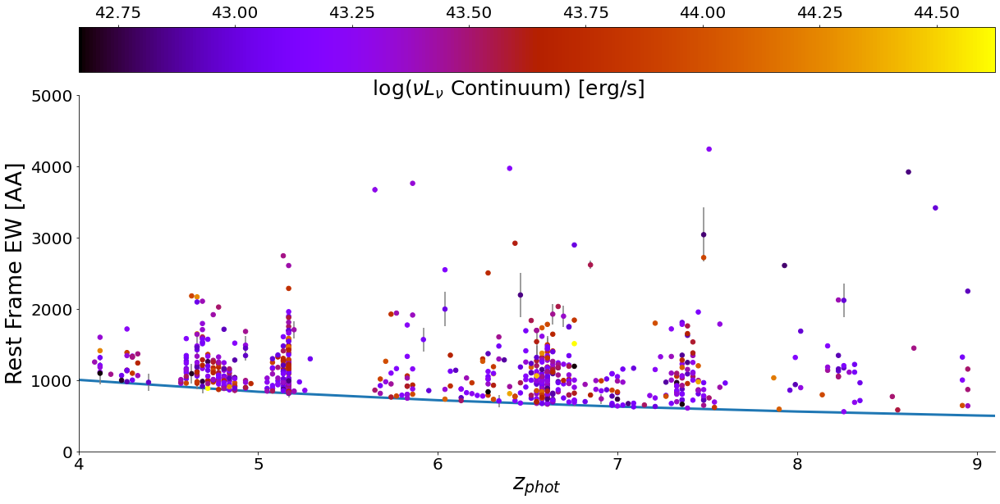

In [274]:
all_plot = pd.concat([dat1a, dat1b])

ewhigh = []

for i in final_data['Object']:
    dat = final_data[final_data['Object'] == i]
    f277 = np.max(dat['EW277'].values)
    fred = np.max(dat['EW'].values)
    
    if f277>fred:
        ewhigh.append(f277)
    else:
        ewhigh.append(fred)
        
plotdat = pd.concat([final_data[final_data['Tier'] == '1A'], final_data[final_data['Tier'] == '1B']])



plt.rcParams['figure.figsize'] = (20, 10)
fig, ax = plt.subplots()

zs = final_data['PHOTOM_RED_SHIFT'].values
ews = ewhigh/(1+zs)
vals = np.arange(0,12)
objects_1a = final_data[final_data['Tier'] == '1A']['Object']
objects_1b = final_data[final_data['Tier'] == '1B']['Object']
plt.plot(vals, 5000/(1+vals), lw = 3, label = 'EW >5000 AA \n(Observed Frame)', zorder = 0)

#plt.scatter(zs[final_data['Tier'] == '1A'], ews[final_data['Tier'] == '1A'], 
#           color = 'r', label = '1A', s = 100, marker = '.', zorder = 10, edgecolor = 'k')
dat1a = pd.DataFrame({'z': zs[final_data['Tier'] == '1A'], 'ewrf': ews[final_data['Tier'] == '1A'],
                     'ewof': np.array(ewhigh)[final_data['Tier'] == '1A']})

#plt.scatter(zs[final_data['Tier'] == '1B'], ews[final_data['Tier'] == '1B'], 
#           color = 'lightcoral', label = '1B', s = 100, marker = '.', zorder = 1, edgecolor = 'grey')
dat1b = pd.DataFrame({'z': zs[final_data['Tier'] == '1B'], 'ewrf': ews[final_data['Tier'] == '1B'],
                     'ewof': np.array(ewhigh)[final_data['Tier'] == '1B']})

plt.scatter(plotdat['PHOTOM_RED_SHIFT'], all_plot['ewrf'], c = np.log10(Lcont), s=30,
            cmap = 'gnuplot', rasterized = True)
ax.spines[['right', 'top']].set_visible(False)


#ewrf_er

plt.errorbar(plotdat['PHOTOM_RED_SHIFT'], all_plot['ewrf'],yerr=ewrf_er, ls = 'none', color = 'grey', 
             zorder = 0)

#plt.scatter(zs[artifactless['Tier'] == '2A'], ews[artifactless['Tier'] == '2A'], 
#           color = 'b', label = '2A')

#plt.scatter(zs[artifactless['Tier'] == '2B'], ews[artifactless['Tier'] == '2B'], 
#           color = 'cornflowerblue', label = '2B')

#plt.scatter(zs[artifactless['Tier'] == '3A'], ews[artifactless['Tier'] == '3A'], 
#           color = 'gold', label = '3A')

#plt.scatter(zs[artifactless['Tier'] == '3B'], ews[artifactless['Tier'] == '3B'], 
#           color = 'yellow', label = '3B')
plt.xlim(3,9.5)
#plt.axhline(2500, c = 'grey', label = 'Very Extreme', zorder = 0, ls = '-.')
plt.xlabel(r'$z_{phot}$')
plt.ylabel('Rest Frame EW [AA]')

c = plt.colorbar(location = 'top')
c.ax.tick_params(labelsize=20)
#c.ax.set_ylabel(r'log($L_{\nu}$ Continuum) [erg/s/Hz]', rotation=90, fontsize = 16, labelpad=20)
plt.text(5.6, 5000,r' log($\nu L_{\nu}$ Continuum) [erg/s]', fontsize = 25)
plt.xlim(4,9.1)
plt.ylim(0,5000)
#plt.legend(loc = 'upper left', fontsize = 'large');
plt.savefig('/home/kelcey/paper_plots/ewrf.pdf', bbox_inches = 'tight')

Re plots:

<a class="anchor" id="replot"></a>

In [289]:
zbool_size = (final_data[t1_bool][good_cont][good_o3]['PHOTOM_RED_SHIFT']>5) &(final_data[t1_bool][good_cont][good_o3]['PHOTOM_RED_SHIFT']<5.5)

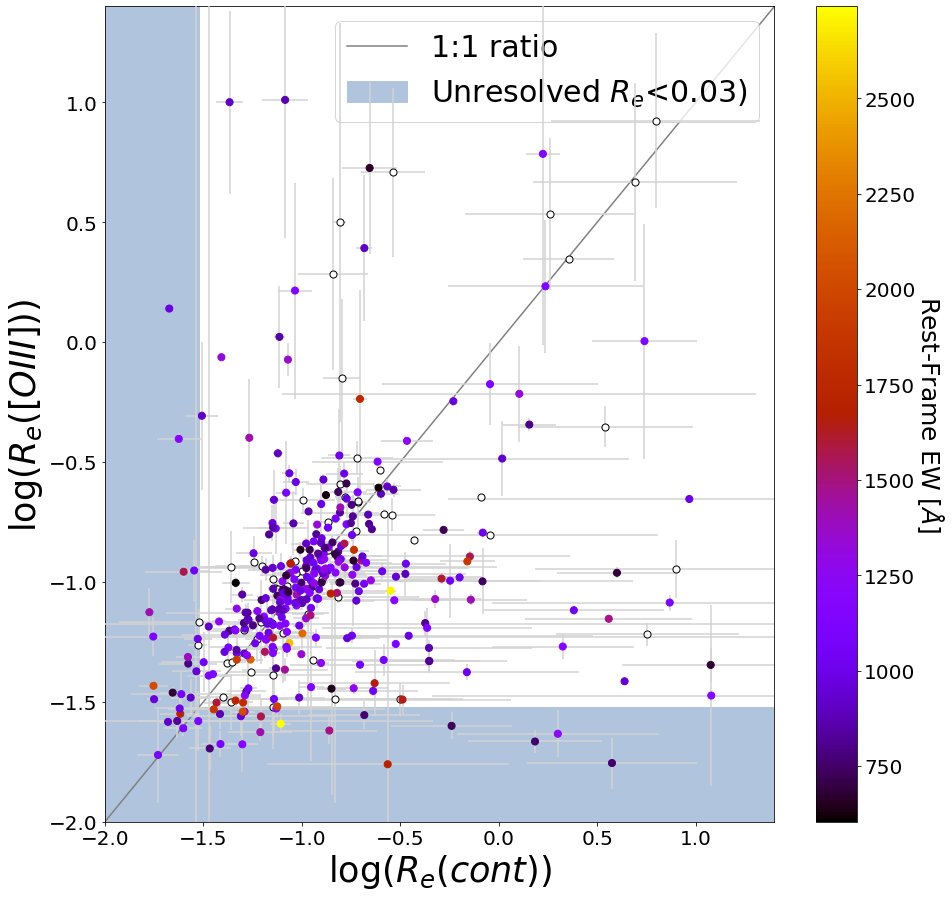

In [290]:
from matplotlib.cm import ScalarMappable
plt.rcParams['figure.figsize'] = (15, 15)

cmap = plt.get_cmap('hot')
array = np.log10(np.array(Lo3)[good_cont][good_o3])
# Normalize the array values to fit within the colormap's range (0 to 1)
norm = plt.Normalize(array.min(), array.max())

# Create a ScalarMappable object to map values to colors
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Get RGB values from RGBA values
rgb_colors = cmap(norm(array))[:, :3]  # Extract the first 3 components (R, G, B)



plt.errorbar(np.log10(re_data_sorted[good_cont][good_o3]['Re_cont']), 
            np.log10(re_data_sorted[good_cont][good_o3]['Re_o3']), 
             xerr = re_data_sorted[good_cont][good_o3]['Re_contER']/(re_data_sorted[good_cont][good_o3]['Re_cont']*np.log(10)),
             yerr = re_data_sorted[good_cont][good_o3]['Re_o3_ER']/(re_data_sorted[good_cont][good_o3]['Re_o3']*np.log(10)),
             zorder = 10,ls='none',fmt = 'none', color= 'lightgrey',
             #color =  np.log10(np.array(Lo3)[good_cont][good_o3]),
             #mfc = rgb_colors, 
            #label = 'High Confidence GALFITs', 
            rasterized = True)

plt.scatter(np.log10(re_data_sorted[good_cont][good_o3][~zbool_size.values]['Re_cont']), 
            np.log10(re_data_sorted[good_cont][good_o3][~zbool_size.values]['Re_o3']), s = 50,
            c = all_plot['ewrf'][good_cont][good_o3][~zbool_size.values],#np.log10(np.array(Lcont)[good_cont][good_o3]), 
            cmap = 'gnuplot', zorder = 20)

c = plt.colorbar()
c.ax.set_ylabel(r'Rest-Frame EW [$\AA$]', rotation=270, fontsize = 25, labelpad=30)

plt.scatter(np.log10(re_data_sorted[good_cont][good_o3][zbool_size.values]['Re_cont']), 
            np.log10(re_data_sorted[good_cont][good_o3][zbool_size.values]['Re_o3']), s = 50,
            c = 'white', edgecolor = 'k',#np.log10(np.array(Lcont)[good_cont][good_o3]), 
            zorder = 16)

#plot median error bar in each dimension and plot 

#c = plt.colorbar()
#c.ax.set_ylabel(r'log(L([OIII])) [erg/s/Hz]', rotation=270, fontsize = 18, labelpad=20)

#plt.scatter(np.log10(re_data_sorted[good_cont_tri][good_o3_tri]['Re_cont']), 
#            np.log10(re_data_sorted[good_cont_tri][good_o3_tri]['Re_o3']), zorder = 11,
#           c = 'green', marker = '^', label = 'Lower Confidence GALFITs', rasterized = True)
x = np.arange(-5,5, .1)
plt.plot(x,x, c = 'grey', label = '1:1 ratio', )
#plt.xlim(0,10)
#plt.ylim(0,10)
xi = np.log10(re_data_sorted[good_cont][good_o3]['Re_cont'])
yi = np.log10(re_data_sorted[good_cont][good_o3]['Re_o3'])


#coef = np.polyfit(xi,yi,1)
#poly1d_fn = np.poly1d(coef) 
# poly1d_fn is now a function which takes in x and returns an estimate for y

#plt.plot(xi, poly1d_fn(xi), zorder = 100, c = 'k', ls = 'dotted',
#        label = 'Trend Line for Best Fit Sources') #'--k'=black dashed line, 'yo' = yellow circle marker

plt.axhspan(-2.2, np.log10(0.03),color = 'lightsteelblue', alpha = 1, 
            label = r'Unresolved $R_{e}$<0.03)', zorder = 0)
plt.axvspan(-2.2, np.log10(0.03),color = 'lightsteelblue', alpha = 1, zorder = 0)




#plt.xscale('log')
#plt.yscale('log')

plt.xlim(-2.0,1.4)
plt.ylim(-2.0,1.4)
plt.legend(fontsize = 30, loc = 'upper right')
#plt.ylim(-3,8)
#plt.xlim(-1, 15)
#plt.ylim(-1, 15)
plt.xlabel(r'log(${R}_{e}(cont))$', fontsize = 35)
plt.ylabel(r'log(${R}_{e}([OIII])$)', fontsize = 35);
plt.savefig('/home/kelcey/paper_plots/ref_o3.pdf')

In [307]:
import lmfit
from lmfit import Model
from scipy.stats import spearmanr

#infmask = ~(weight==np.inf)
#o3t = re_data_sorted[good_cont][good_o3]['Re_o3'].values>0.05
#contt = re_data_sorted[good_cont][good_o3]['Re_cont'].values>0.05
xvs = np.log10(re_data_sorted[good_cont][good_o3]['Re_o3']/re_data_sorted[good_cont][good_o3]['Re_cont'])
#newratio = (xvals/yvals)


master_res = ((.5)>xvs)&(xvs>((-.5)))#o3t & contt

#len(master_res[master_res==False])
#for i in range(len(o3t)):
#    if (o3t[i]== True) or contt[i] == True:
master_res = master_res.values



In [308]:
cont_compare = np.array(cont_fluxes)[good_cont][good_o3][master_res]
master_res2 = cont_compare>0

<ipython-input-309-64ba54bfd168>:54: RuntimeWarning: divide by zero encountered in divide
  ewts = np.sqrt((( oer/oval)**2) + (( oer2/oval2)**2))*oe/oe2
<ipython-input-309-64ba54bfd168>:54: RuntimeWarning: invalid value encountered in divide
  ewts = np.sqrt((( oer/oval)**2) + (( oer2/oval2)**2))*oe/oe2
<ipython-input-309-64ba54bfd168>:56: RuntimeWarning: divide by zero encountered in divide
  wts = 1/((oer)**2)
<ipython-input-309-64ba54bfd168>:61: RuntimeWarning: divide by zero encountered in divide
  weight = (1/((ewts[emask])**2))


[[Model]]
    Model(linear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 255
    # variables        = 2
    chi-square         = 8.77685514
    reduced chi-square = 0.03469113
    Akaike info crit   = -855.132074
    Bayesian info crit = -848.049546
    R-squared          = 0.06977359
[[Variables]]
    slope:     -0.44057906 +/- 0.10113754 (22.96%) (init = 1)
    intercept:  1.30973865 +/- 0.30570984 (23.34%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.9993
Correlation matrix:
[[ 0.0102288  -0.03089623]
 [-0.03089623  0.09345851]]
Correlation between slope and intercept: -0.0309
Correlation between intercept and slope: -0.0309
slope = -0.44+/-0.1 intercept =  1.31+/-0.31


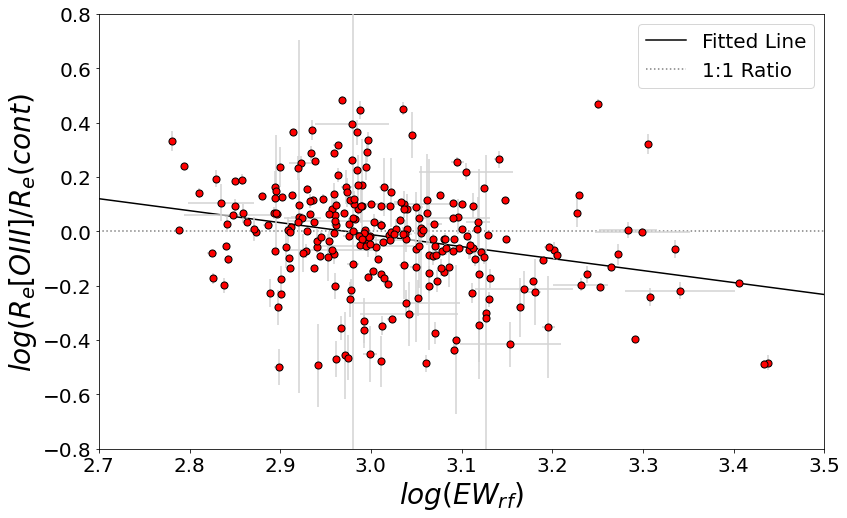

In [309]:
#from matplotlib.cm import ScalarMappable
plt.rcParams['figure.figsize'] = (13, 8)
mn_e = (1/np.log(10))*0.000001#.001

zbool_size = (final_data[t1_bool][good_cont][good_o3][master_res][master_res2]['PHOTOM_RED_SHIFT']>5) &(final_data[t1_bool][good_cont][good_o3][master_res][master_res2]['PHOTOM_RED_SHIFT']<5.5)

#cmap = plt.get_cmap('hot')
#array = np.log10(np.array(Lo3)[good_cont][good_o3])
# Normalize the array values to fit within the colormap's range (0 to 1)
#norm = plt.Normalize(array.min(), array.max())

# Create a ScalarMappable object to map values to colors
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Get RGB values from RGBA values
rgb_colors = cmap(norm(array))[:, :3]  # Extract the first 3 components (R, G, B)

#yvals = re_data_sorted[good_cont][good_o3]['Re_cont']
xvals = np.log10(re_data_sorted[good_cont][good_o3][master_res][master_res2]['Re_o3']/re_data_sorted[good_cont][good_o3][master_res][master_res2]['Re_cont'])
#newratio = (xvals/yvals)

#yr = re_data_sorted[good_cont][good_o3]['Re_contER']/(re_data_sorted[good_cont][good_o3]['Re_cont']*np.log(10))
#xr = re_data_sorted[good_cont][good_o3]['Re_o3_ER']/(re_data_sorted[good_cont][good_o3]['Re_o3']*np.log(10))

#err_new = np.sqrt(((xvals)**2) + ((yvals)**2))*newratio

#zs = np.log10(np.array(Lcont)[good_cont][good_o3])


line_orig = models.Linear1D(slope=1.0, intercept=0.5)

# initialize a linear fitter
fit = fitting.LinearLSQFitter()

# initialize a linear model
line_init = models.Linear1D()


x = (xvals[zbool_size.values])
y = np.log10(all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][zbool_size.values])

# Fit a line using polyfit (degree 1 for a linear fit)
oe2 = re_data_sorted[good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]['Re_contER'].values
oval2 = re_data_sorted[good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]['Re_cont'].values

oer2 = (1/np.log(10))*(oe2/oval2)

oe = re_data_sorted[good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]['Re_o3_ER'].values
oval = re_data_sorted[good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]['Re_o3'].values

oer = (1/np.log(10))*(oe/oval)

ewts = np.sqrt((( oer/oval)**2) + (( oer2/oval2)**2))*oe/oe2

wts = 1/((oer)**2)
xvs2 = np.log10(all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)])

emask = ~np.isnan(ewts)

weight = (1/((ewts[emask])**2))
infmask = ~(ewts[emask]==np.inf)
#weight 

ewts[ewts<mn_e] = mn_e
weight = (1/((ewts[emask][infmask])**2))
###

def linear_model(x, slope, intercept):
    return slope * x + intercept

model = Model(linear_model)

# Set initial parameter values (guess)
params = model.make_params(slope=1.0, intercept=0.0)
###

x_data = xvs2[emask][infmask].values
y_data = (xvals[~np.array(zbool_size.values)][emask][infmask].values)

# Perform the fit with weights (using y-errors)
result = model.fit(y_data, params, x=x_data)#, weights=weight)

print(result.fit_report())
#fitted_line = fit(line_init, xvs2[emask][infmask], np.log10(xvals[~np.array(zbool_size.values)][emask][infmask]),
#                 weights = weight)



#slope, intercept, r, p, se = stats.linregress(xvs2[emask][infmask]*weight[infmask], 
#                                              np.log10(xvals[~np.array(zbool_size.values)][emask][infmask])*weight[infmask])
#slope

###
slope = result.params['slope'].value
intercept = result.params['intercept'].value
                     


xvz = np.arange(2,4,.01)


plt.plot(xvz, slope * xvz + intercept, color='k', label='Fitted Line')
ew_errs = np.array(ewrf_er)[good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]
ewvals = all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]
###
#plt.plot(x_data, result.best_fit, label='Fit', color='k')
plt.errorbar(np.log10(all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]),
             (xvals[~np.array(zbool_size.values)]), yerr= oer2/2, 
             xerr = (1/np.log(10))*(ew_errs/ewvals),
             zorder = 10,ls='none',fmt = 'none', color= 'lightgrey', rasterized = True )

plt.scatter( np.log10(all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)]), 
            (xvals[~np.array(zbool_size.values)]),
            s = 200,
            c = 'r',edgecolor = 'k',
            #c = tier1dat['PHOTOM_RED_SHIFT'][good_cont][good_o3],cmap = 'hot',
             #xerr = re_data_sorted[good_cont][good_o3]['Re_contER']/(re_data_sorted[good_cont][good_o3]['Re_cont']*np.log(10)),
             #yerr = err_new, s = 
             #re_data_sorted[good_cont][good_o3]['Re_o3_ER']/(re_data_sorted[good_cont][good_o3]['Re_o3']*np.log(10)),
             zorder = 11, marker = '.',
             #color =  np.log10(np.array(Lo3)[good_cont][good_o3]),
             #mfc = rgb_colors, 
            rasterized = True)



plt.plot(xvz, np.repeat(np.log10(1), len(xvz)), label = '1:1 Ratio', c = 'grey', ls = 'dotted')
#plt.title(f'Slope  = {round(slope,2)} ')#Error floor = {round(np.log10(mn_e),2)}')
plt.xlim(2.7,3.5)
#plt.axvspan(np.log10(2500), np.log10(3500), color = 'm', alpha = 0.25, label = 'Under-predicted in Theory')
#plt.ylim(-1.5,6)
#plt.yscale('log')
#plt.ylim(.01,100)
plt.ylim(-.8,.8)
plt.legend(fontsize = 20)
plt.ylabel(r'$log(R_e[OIII]/R_e(cont)$', fontsize = 28)
plt.xlabel(r'$log(EW_{rf})$', fontsize = 28);
#plt.xscale('log')
plt.savefig('/home/kelcey/paper_plots/ref_o3_ew.pdf', bbox_inches = 'tight' )
#ratio on y axis, ew on y, compare to emission line luminosity
#xompact, brighter if AGN is causing this (smaller ratio as line gets brighter?)
#sk in oython chanel
#add in minium error floor 
correlation_matrix = result.covar
print("Correlation matrix:")
print(correlation_matrix)
sle = result.params['slope'].stderr
sint = result.params['intercept'].stderr
#plt.plot(xvz, (slope+sle) * xvz + (intercept), color='k', label='Fitted Line')
for i, param_i in enumerate(result.params.values()):
    for j, param_j in enumerate(result.params.values()):
        if i != j:  # Avoid printing self-correlations
            correlation_value = correlation_matrix[i, j]
            print(f"Correlation between {param_i.name} and {param_j.name}: {correlation_value:.4f}")

print(f'slope = {round(slope,2)}+/-{round(sle,2)} intercept =  {round(intercept,2)}+/-{round(sint,2)}')
#print(result.corr)

In [310]:
xvz = np.log10(all_plot['ewrf'][good_cont][good_o3][master_res][master_res2][~np.array(zbool_size.values)])
yvs = xvals[~np.array(zbool_size.values)]
yez = yerr= oer2/2

spearmanr(xvz, yvs)

SignificanceResult(statistic=-0.3070617531067232, pvalue=4.653514925853434e-07)

Flux ratios:
        
<a class="anchor" id="ratios"></a>

In [319]:
zbool = (final_data[t1_bool]['PHOTOM_RED_SHIFT']>5.1)&(final_data[t1_bool]['PHOTOM_RED_SHIFT']<5.5)

In [321]:
import astropy.units as u

conv_to_cgs = 1*u.nJy.decompose(bases=u.cgs.bases)

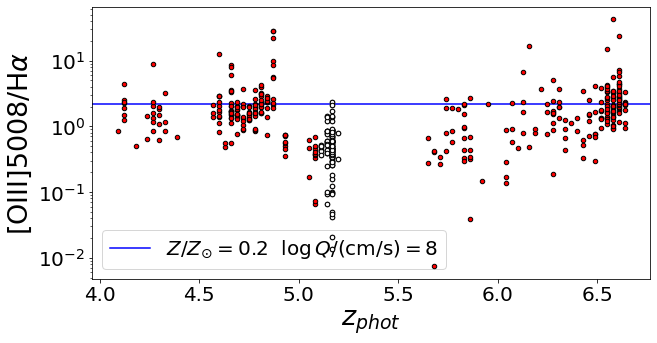

In [322]:
plt.rcParams['figure.figsize'] = (10, 5)

#cont = final_data['Cont']
rs = zphots
plt.axhline(2.22, c = 'b', label = r'$Z/Z_{\odot} = 0.2$  $\log Q/\mathrm{(cm/s)} = 8$')
plt.scatter(np.array(rs)[no_nan], np.array(o3ha)[no_nan]*conv_to_cgs, c = 'r', edgecolor = 'k',
           # c = np.log10(all_plot['ewrf']), 
            s = 20, 
            rasterized  = True, zorder = 10)#, cmap = 'hot')
plt.scatter(np.array(rs)[zbool], np.array(o3ha)[zbool]*conv_to_cgs, c = 'white', s = 20, 
            edgecolor = 'k', rasterized  = True, zorder = 100)



#plt.scatter(np.array(rs)[no_nan], np.array(o3ha)[no_nan], c = 'lightcoral', label = '1B', zorder = 0)
plt.xlabel(r'$z_{phot}$')
plt.ylabel(r'[OIII]5008/H$\alpha$')
#plt.xlim(3.3,9.5)
#plt.axvline(5.5)
#plt.axhline(1)
#plt.ylim(-30,30)
plt.yscale('log')
plt.legend(loc = 'lower left')
plt.savefig('/home/kelcey/paper_plots/ratio_z.pdf', bbox_inches = 'tight')

<ipython-input-325-bd791a866566>:2: RuntimeWarning: invalid value encountered in log10
  ebool =(1/np.log(10))*(np.array(o3ha_error)[no_nan]*conv_to_cgs.value)/(np.log10(np.array(o3ha)[no_nan]*conv_to_cgs.value)) >0
<ipython-input-325-bd791a866566>:6: RuntimeWarning: invalid value encountered in log10
  plt.scatter(np.log10(np.array(rs)[no_nan]), np.log10(np.array(o3ha)[no_nan]*conv_to_cgs.value), c = 'r', edgecolor = 'k',
<ipython-input-325-bd791a866566>:10: RuntimeWarning: invalid value encountered in log10
  plt.scatter(np.log10(np.array(rs)[zbool]), np.log10(np.array(o3ha)[zbool]*conv_to_cgs.value), c = 'white', s = 20,


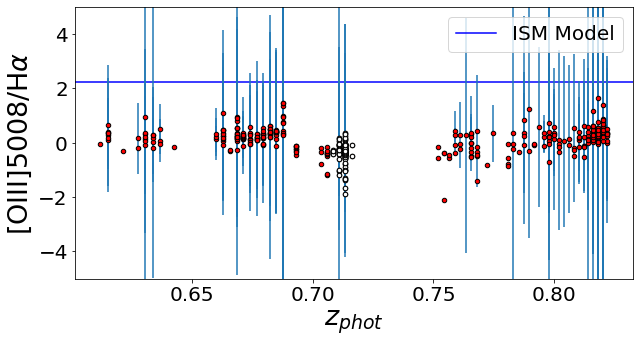

In [325]:
plt.rcParams['figure.figsize'] = (10, 5)
ebool =(1/np.log(10))*(np.array(o3ha_error)[no_nan]*conv_to_cgs.value)/(np.log10(np.array(o3ha)[no_nan]*conv_to_cgs.value)) >0
#cont = final_data['Cont']
rs = zphots
plt.axhline(2.22, c = 'b', label = 'ISM Model')
plt.scatter(np.log10(np.array(rs)[no_nan]), np.log10(np.array(o3ha)[no_nan]*conv_to_cgs.value), c = 'r', edgecolor = 'k',
           # c = np.log10(all_plot['ewrf']), 
            s = 20, 
            rasterized  = True, zorder = 10)#, cmap = 'hot')
plt.scatter(np.log10(np.array(rs)[zbool]), np.log10(np.array(o3ha)[zbool]*conv_to_cgs.value), c = 'white', s = 20, 
            edgecolor = 'k', rasterized  = True, zorder = 100)

plt.errorbar(np.log10(np.array(rs)[no_nan][ebool]), np.log10(np.array(o3ha)[no_nan][ebool]*conv_to_cgs.value), yerr = (1/np.log(10))*(np.array(o3ha_error)[no_nan][ebool]*conv_to_cgs.value)/(np.log10(np.array(o3ha)[no_nan][ebool]*conv_to_cgs.value)),
            ls = 'none')

#plt.scatter(np.array(rs)[no_nan], np.array(o3ha)[no_nan], c = 'lightcoral', label = '1B', zorder = 0)
plt.xlabel(r'$z_{phot}$')
plt.ylabel(r'[OIII]5008/H$\alpha$')
#plt.xlim(3.3,9.5)
#plt.axvline(5.5)
#plt.axhline(1)
plt.ylim(-5,5)
#plt.ylim(-30,30)
#plt.yscale('log')
plt.legend()
plt.savefig('/home/kelcey/paper_plots/ratio_z.pdf', bbox_inches = 'tight')

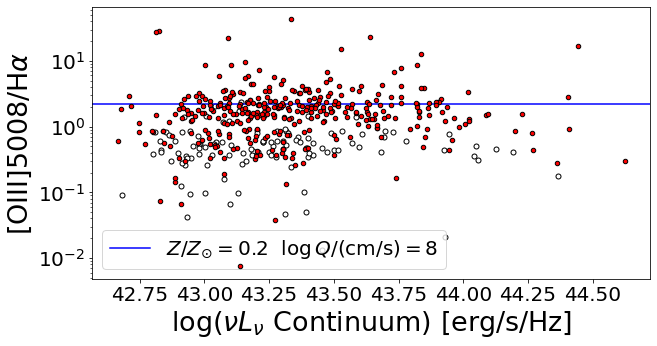

In [326]:
### plt.rcParams['figure.figsize'] = (10, 5)

#cont = final_data['Cont']
rs = zphots
plt.axhline(2.22, c = 'b', label = r'$Z/Z_{\odot} = 0.2$  $\log Q/\mathrm{(cm/s)} = 8$')

plt.scatter(np.log10(Lcont)[~zbool], np.array(o3ha)[no_nan][~zbool]*conv_to_cgs,  c = 'r', edgecolor = 'k',
            #c = np.log10(all_plot['ewrf']),
            zorder = 10, s = 20,  #cmap = 'hot',
           rasterized  = True)

plt.scatter(np.log10(Lcont)[zbool], np.array(o3ha)[zbool]*conv_to_cgs, c = 'white', s = 25, 
            edgecolor = 'k', rasterized  = True, zorder = 1)
#plt.scatter(np.array(rs)[no_nan], np.array(o3ha)[no_nan], c = 'lightcoral', label = '1B', zorder = 0)
#plt.xlabel('log(cont)')
plt.ylabel(r'[OIII]5008/H$\alpha$')

plt.xlabel(r'log($\nu L_{\nu}$ Continuum) [erg/s/Hz]')
plt.legend(loc = 'lower left')
#plt.xlim(3.3,9.5)
#plt.axvline(5.5)
#plt.axhline(1)
#plt.ylim(-30,30)
plt.yscale('log')
plt.savefig('/home/kelcey/paper_plots/ratio_cont.pdf', bbox_inches = 'tight')

Line luminosities

    
<a class="anchor" id="line_lums"></a>

In [327]:

line_orig = models.Linear1D(slope=1.0, intercept=0.5)
# initialize a linear fitter
fit = fitting.LinearLSQFitter()
# initialize a linear model
line_init = models.Linear1D()


def linear_model(x, slope, intercept):
    return slope * x + intercept

model = Model(linear_model)

# Set initial parameter values (guess)
params = model.make_params(slope=1.0, intercept=0.0)
###

x_data = np.log10(Lcont)
y_data = np.log10(Lo3)

# Perform the fit with weights (using y-errors)
result = model.fit(y_data, params, x=x_data)#, weights=weight)

slope = result.params['slope'].value
intercept = result.params['intercept'].value
                     
print(result.fit_report(), spearmanr(x_data, y_data))

[[Model]]
    Model(linear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 702
    # variables        = 2
    chi-square         = 36.5956181
    reduced chi-square = 0.05227945
    Akaike info crit   = -2069.71144
    Bayesian info crit = -2060.60357
    R-squared          = 0.62877833
[[Variables]]
    slope:      0.88073063 +/- 0.02557773 (2.90%) (init = 1)
    intercept:  4.71393383 +/- 1.10897876 (23.53%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -1.0000 SignificanceResult(statistic=0.7806802395735498, pvalue=4.662973642447304e-145)


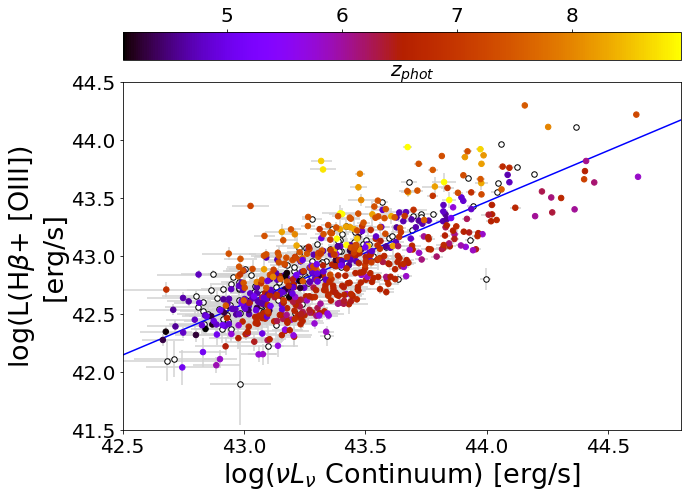

In [328]:
plt.rcParams['figure.figsize'] = (10, 8)

fig, ax = plt.subplots()
xvz = np.arange(35,46,.01)
#plt.plot(p,p, c = 'k')

xe = (1/np.log(10))*np.array(Lcont_e)/np.array(Lcont)
ye = (1/np.log(10))*np.array(Lo3_e)/np.array(Lo3)

plt.scatter(np.log10(Lcont)[~zbool], np.log10(Lo3)[~zbool],
            c = final_data[t1_bool][~zbool]['PHOTOM_RED_SHIFT'].values, s= 30, 
           cmap = 'gnuplot', rasterized = True, zorder = 10)

plt.errorbar(np.log10(Lcont), np.log10(Lo3), xerr = xe, yerr= abs(ye),ls='none', zorder = 0, c = 'lightgrey')

c = plt.colorbar(location = 'top')


plt.scatter(np.log10(np.array(Lcont)[zbool]), np.log10(np.array(Lo3)[zbool]),
            c = 'white', s= 30, edgecolor = 'k',
            rasterized = True, zorder = 1)



#rng = np.arange(25,40)
#plt.plot(rng,rng)

plt.xlabel(r'log($\nu L_{\nu}$ Continuum) [erg/s]')
plt.ylabel(r'log(L(H$\beta$+ [OIII])' + f'\n[erg/s]')

xi = np.log10(np.array(Lcont)[~zbool])
yi = np.log10(np.array(Lo3)[~zbool])

idx = np.isfinite(xi) & np.isfinite(yi)

xvz = np.arange(42.5,45,.01)


plt.plot(xvz, slope * xvz + intercept, label='Fitted Line', c = 'b')
plt.xlim(42.5,44.8)
plt.ylim(41.5,44.5)
plt.text(43.6, 44.55, r'$z_{phot}$', fontsize = 20)
#coef = np.polyfit(xi[idx],yi[idx],1)
#poly1d_fn = np.poly1d(coef) 
#plt.plot(xi[idx], poly1d_fn(xi[idx]), zorder = 100, c = 'b', 
#        label = f' m = {round(coef[0],2)} ') 
#plt.legend()

#plt.xlabel(r'log$(M_{\star}) [M_{\odot}]$')
#plt.ylabel(r'log(L(H$\alpha$) [erg/s]') #+ f'\n[{L.decompose(bases=u.cgs.bases).unit}]')
#plt.savefig('/home/kelcey/paper_plots/lo3_cont.pdf')
#c.ax.set_ylabel(r'$z_{phot}$', rotation=270, fontsize = 16, labelpad=20)
plt.savefig('/home/kelcey/paper_plots/lo3_cont.pdf', bbox_inches = 'tight')
#plt.yscale('log')
#plt.xlim(3.3,9.5);

In [329]:

line_orig = models.Linear1D(slope=1.0, intercept=0.5)
# initialize a linear fitter
fit = fitting.LinearLSQFitter()
# initialize a linear model
line_init = models.Linear1D()


def linear_model(x, slope, intercept):
    return slope * x + intercept

model = Model(linear_model)

# Set initial parameter values (guess)
params = model.make_params(slope=1.0, intercept=0.0)
###

xi = np.log10(Lcont)#[~zbool]
yi = np.log10(Lha)#[~zbool]

idx = np.isfinite(xi) & np.isfinite(yi)

x_data = np.log10(Lcont)[idx]
y_data = np.log10(Lha)[idx]

# Perform the fit with weights (using y-errors)
result = model.fit(y_data, params, x=x_data)#, weights=weight)

slope = result.params['slope'].value
intercept = result.params['intercept'].value
                     

print(result.fit_report(), spearmanr(x_data, y_data))

[[Model]]
    Model(linear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 477
    # variables        = 2
    chi-square         = 79.4733087
    reduced chi-square = 0.16731223
    Akaike info crit   = -850.829442
    Bayesian info crit = -842.494409
    R-squared          = 0.43374203
[[Variables]]
    slope:      1.03342227 +/- 0.05417793 (5.24%) (init = 1)
    intercept: -2.31602775 +/- 2.34741315 (101.36%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -1.0000 SignificanceResult(statistic=0.6191493412712049, pvalue=8.035282987511292e-52)


<ipython-input-329-a89397ad9f81>:18: RuntimeWarning: invalid value encountered in log10
  yi = np.log10(Lha)#[~zbool]
<ipython-input-329-a89397ad9f81>:23: RuntimeWarning: invalid value encountered in log10
  y_data = np.log10(Lha)[idx]


<ipython-input-331-bcd38b50076b>:10: RuntimeWarning: invalid value encountered in log10
  plt.scatter(np.log10(Lcont), np.log10(Lha), c = final_data[t1_bool]['PHOTOM_RED_SHIFT'].values, s= 30,
<ipython-input-331-bcd38b50076b>:12: RuntimeWarning: invalid value encountered in log10
  plt.errorbar(np.log10(Lcont), np.log10(Lha), xerr = xe, yerr= abs(ye),ls='none', zorder = 0, c = 'lightgrey')


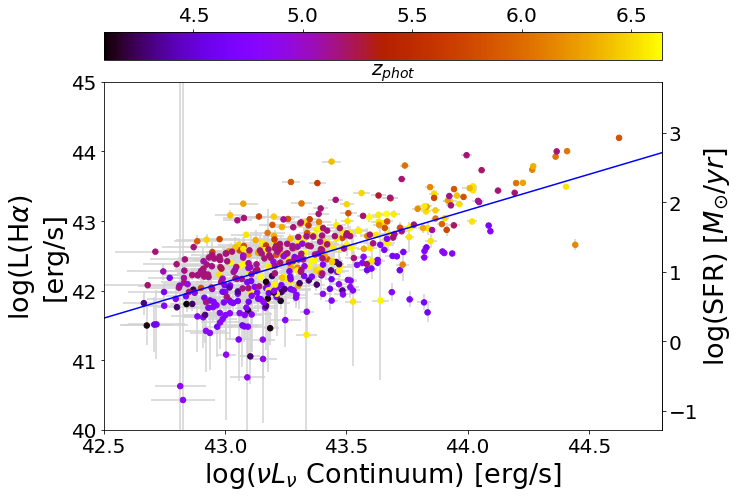

In [331]:
plt.rcParams['figure.figsize'] = (10, 8)

fig, ax = plt.subplots()
xvz = np.arange(35,46,.01)
#plt.plot(p,p, c = 'k')

xe = (1/np.log(10))*np.array(Lcont_e)/np.array(Lcont)
ye = (1/np.log(10))*np.array(Lha_e)/np.array(Lha)

plt.scatter(np.log10(Lcont), np.log10(Lha), c = final_data[t1_bool]['PHOTOM_RED_SHIFT'].values, s= 30, 
            cmap = 'gnuplot', rasterized = True)
plt.errorbar(np.log10(Lcont), np.log10(Lha), xerr = xe, yerr= abs(ye),ls='none', zorder = 0, c = 'lightgrey')

c = plt.colorbar(location = 'top')

def Lhaf(x):
    return x 


def SFR(x):
    return (x -41.27)


secay = ax.secondary_yaxis('right', functions=(SFR, Lhaf))
secay.set_ylabel(r'log(SFR) [$M_{\odot}/yr$]')

#plt.scatter(np.log10(Lcont)[zbool], np.log10(Lha)[zbool], c = 'grey', s= 20, 
#            edgecolor = 'k', rasterized = True)
plt.xlabel(r'log($\nu L_{\nu}$ Continuum) [erg/s]')
plt.ylabel(r'log(L(H$\alpha$)' + f'\n[erg/s]')

plt.plot(xvz, slope * xvz + intercept, label='Fitted Line', c = 'b')
plt.xlim(42.5,44.8)
plt.ylim(40,45)
plt.text(43.6, 45.1, r'$z_{phot}$', fontsize = 20)
#c.ax.set_ylabel(r'$z_{phot}$', rotation=270, fontsize = 16, labelpad=20)
#plt.legend()
plt.savefig('/home/kelcey/paper_plots/lha_cont.pdf', bbox_inches = 'tight')
#plt.xlim(41,45)
#plt.ylim(39,45);
#plt.yscale('log')
#plt.xlim(3.3,9.5);
##luminosity plots

Morphology plots:
    
<a class="anchor" id="morph"></a>

In [333]:
paths =glob.glob('/home/kelcey/paper_plots/updated_morph/*')

spike_paths = []
cont_paths = []
pic_objects = []
s_oj = []
c_oj = []
for p in paths:
    pic_objects.append(p.split('/')[-1].split('_')[1])
    if p.split('/')[-1].split('_')[0] == 'spike':
        spike_paths.append(p)
        s_oj.append(p.split('/')[-1].split('_')[1])
    else:
        cont_paths.append(p)
        c_oj.append(p.split('/')[-1].split('_')[1])
to_plot = list(set(pic_objects))

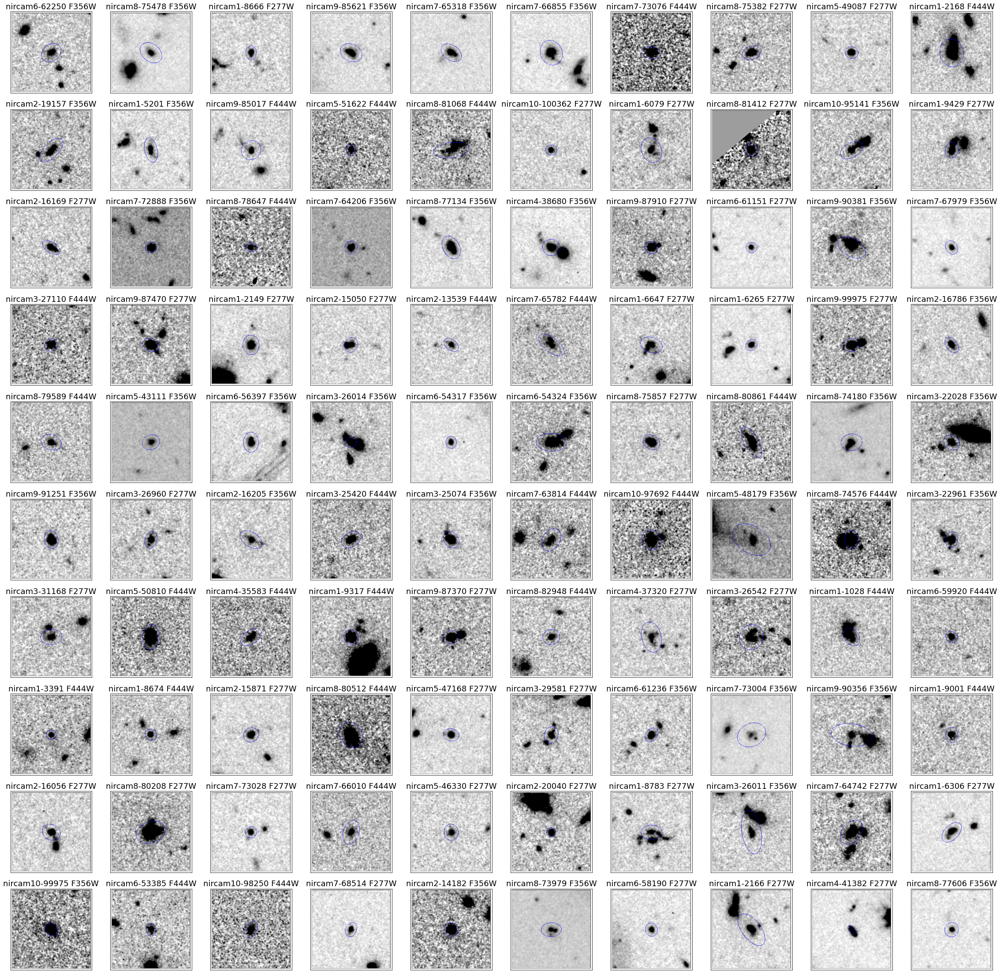

In [335]:
#plt.rcParams['figure.figsize'] = (20, 20)
import cv2 as cv
plt.figure(figsize=(40,40)) # specifying the overall grid size

#plt.rc('axes', labelsize=27)
#plt.rc('axes', labelweight='bold')
plt.rc('axes', titlesize=18)
plt.rc('axes', titleweight='normal')
plt.rc('font', family='sans-serif')
#plt.rcParams.update({'font.size': 20})
ob_test = []
for i in range(100):
    oj = to_plot[i]
    plt.subplot(10,10,i+1)    
    
    pths = []
    for s in spike_paths:
        ob = s.split('_')[-2]
        if ob == oj:
            pths.append(s)
        ob_test.append(ob)
    this_path = pths[0]
    img = cv.imread(this_path)
    plt.imshow(img)
    #oj = spike_paths[0].split('_')[2]
    f = this_path.split('_')[-1].split('.')[0]+'W'
    plt.title(f'{oj} {f}')
    plt.xticks([])
    plt.yticks([])

#plt.show()

plt.savefig('/home/kelcey/paper_plots/spikes.pdf', bbox_inches = 'tight')

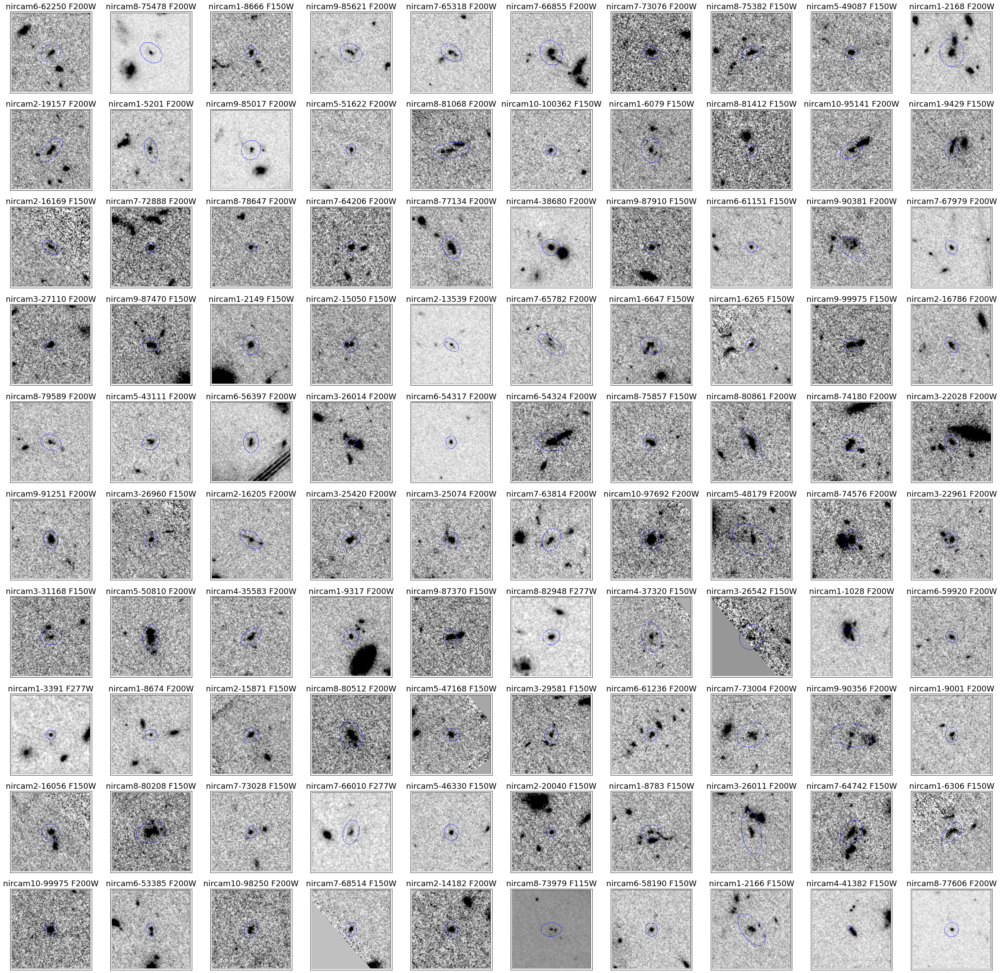

In [336]:
#plt.rcParams['figure.figsize'] = (20, 20)

plt.figure(figsize=(40,40)) # specifying the overall grid size

#plt.rc('axes', labelsize=27)
#plt.rc('axes', labelweight='bold')
plt.rc('axes', titlesize=18)
#plt.rc('axes', titleweight='bold')
plt.rc('font', family='sans-serif')
#plt.rcParams.update({'font.size': 20})
ob_test = []
for i in range(100):
    oj = to_plot[i]
    plt.subplot(10,10,i+1)    
    
    pths = []
    for s in cont_paths:
        ob = s.split('_')[-2]
        if ob == oj:
            pths.append(s)
        ob_test.append(ob)
    this_path = pths[0]
    img = cv.imread(this_path)
    plt.imshow(img)
    #oj = spike_paths[0].split('_')[2]
    f = this_path.split('_')[-1].split('.')[0]+'W'
    plt.title(f'{oj} {f}')
    plt.xticks([])
    plt.yticks([])

#plt.show()
plt.savefig('/home/kelcey/paper_plots/conts.pdf', bbox_inches = 'tight')

<a class="anchor" id="color"></a>

# Color color plots

These were not included in the paper, but they are still relavent to preserve

In [337]:
eelg_colors = get_color_table(final_data)[0]
df_colors = get_color_table(df_new)[0]

/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [339]:
comp_colors = df_colors[comp_bool]
#comp_colors

In [341]:
redbool = []
f277bool = []
for o in final_data['Object']:
    data = final_data[final_data['Object'] == o]
    e277 = data['EW277'].values[0]
    eother = data['EW'].values[0]
    if e277>eother:
        f277bool.append(True)
        redbool.append(False)
    elif e277>5000 and eother>5000:
        f277bool.append(True)
        redbool.append(True)
    else:
        f277bool.append(False)
        redbool.append(True)

In [342]:
f277_c = final_data[f277bool]
red_selec = final_data[redbool]

red_colors = get_color_table(red_selec[red_selec['Tier'] == '3B'])[0]
good_tiers = []
for t in red_selec['Tier']:
    if t in ['1A', '1B', '2A', '2B']:
        good_tiers.append(True)
    else:
        good_tiers.append(False)
red_eelg_cols = get_color_table(red_selec[good_tiers])[0]

/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/seaborn/distributions.py:1191: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/seaborn/distributions.py:1191: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/seaborn/distributions.py:1191: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(


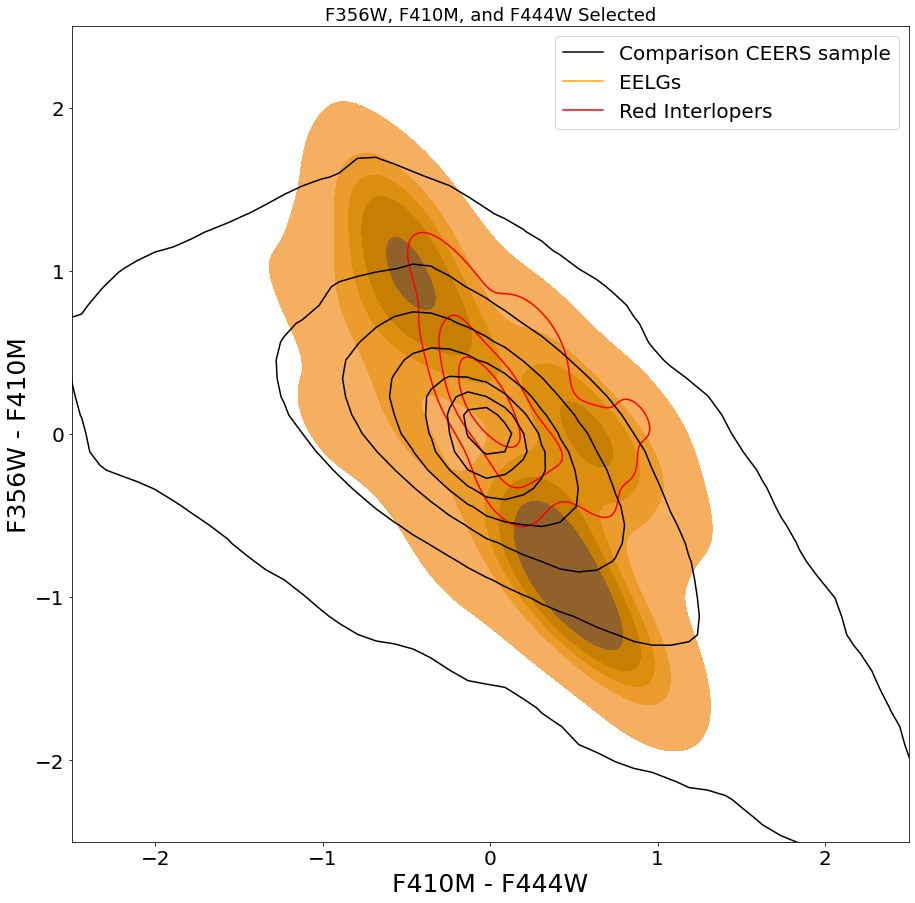

In [344]:
from matplotlib.lines import Line2D
plt.rcParams['figure.figsize'] = (15, 15)
xs = df_colors['F410 - F444']
ys = df_colors['F356 - F410']

dat =  pd.DataFrame({'x':xs, 'y':ys})


sns.kdeplot(data = dat, x = 'x', y = 'y',  fill = False, 
            levels = 8, color = 'k',  zorder = 101, rasterized = True)


xsi = red_colors['F410 - F444']
ysi = red_colors['F356 - F410']

dati =  pd.DataFrame({'x':xsi, 'y':ysi})
#plt.scatter(xsi,ysi)


sns.kdeplot(data = dati, x = 'x', y = 'y',  fill = False, alpha = 1,
            levels = 4, color = 'red',  zorder = 100, rasterized = True)

xsi = red_eelg_cols['F410 - F444']
ysi = red_eelg_cols['F356 - F410']

dati =  pd.DataFrame({'x':xsi, 'y':ysi})
#plt.scatter(xsi,ysi)


sns.kdeplot(data = dati, x = 'x', y = 'y',  fill = True, 
            levels = 6, color = 'orange',  zorder = 10, rasterized = True)

legend_handles = []
contour_labels = ['Comparison CEERS sample', 'EELGs','Red Interlopers']
colors = ['k', 'orange', 'red']  # Customize the colors as needed
for label, color in zip(contour_labels, colors):
    legend_handles.append(Line2D([0], [0], color=color, label=label))

# Add a legend to the plot with custom handles
plt.legend(handles=legend_handles)


plt.title('F356W, F410M, and F444W Selected')
plt.xlabel('F410M - F444W', fontsize = 25)
plt.ylabel('F356W - F410M', fontsize = 25)
plt.xlim(-2.5,2.5)
plt.ylim(-2.5,2.5)
plt.savefig('/home/kelcey/paper_plots/red_col.pdf', bbox_inches = 'tight')
#plt.legend()

/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/seaborn/distributions.py:1191: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/home/kelcey/anaconda3/envs/hera/lib/python3.9/site-packages/seaborn/distributions.py:1191: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(


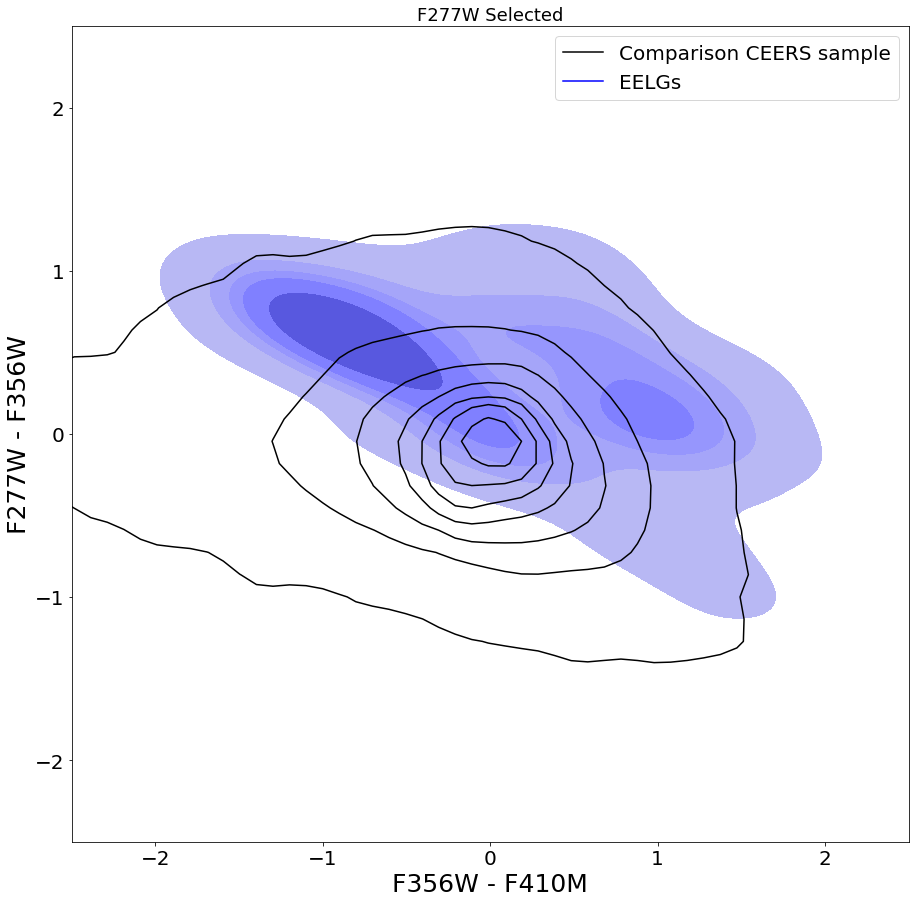

In [345]:
good_tiers277 = []
for t in f277_c['Tier']:
    if t in ['1A', '1B', '2A', '2B']:
        good_tiers277.append(True)
    else:
        good_tiers277.append(False)


f277_col = get_color_table(f277_c[good_tiers277])
plt.rcParams['figure.figsize'] = (15, 15)

xs = df_colors['F356 - F410']
ys = df_colors['F277 - F356']

dat =  pd.DataFrame({'x':xs, 'y':ys})


sns.kdeplot(data = dat, x = 'x', y = 'y',  fill = False, 
            levels = 8, color = 'k',  zorder = 101, rasterized = True)


xsi = red_eelg_cols['F356 - F410']
ysi = red_eelg_cols['F277 - F356']

dati =  pd.DataFrame({'x':xsi, 'y':ysi})
#plt.scatter(xsi,ysi)


sns.kdeplot(data = dati, x = 'x', y = 'y',  fill = True, 
            levels = 6, color = 'blue',  zorder = 10, rasterized = True)

legend_handles = []
contour_labels = ['Comparison CEERS sample', 'EELGs']
colors = ['k', 'blue']  # Customize the colors as needed
for label, color in zip(contour_labels, colors):
    legend_handles.append(Line2D([0], [0], color=color, label=label))

# Add a legend to the plot with custom handles
plt.legend(handles=legend_handles)
plt.title('F277W Selected')



plt.xlabel('F356W - F410M', fontsize = 25)
plt.ylabel('F277W - F356W', fontsize = 25)
plt.xlim(-2.5,2.5)
plt.ylim(-2.5,2.5)
plt.savefig('/home/kelcey/paper_plots/f277_col.pdf', bbox_inches = 'tight')
#plt.legend()